## Libraries

In [1]:
import os
import warnings
warnings.filterwarnings('ignore')
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from IPython.utils.capture import capture_output
import os, sys
from importlib import reload

In [3]:
sys.path.insert(0, os.path.abspath('../../../2022/palin/python'))
import palin as pa
from palin.utils import utils
from palin.internal_noise import grid
from palin.kernels import classification_images

In [4]:
reload(pa)
reload(utils)
reload(grid)
reload(classification_images)

<module 'palin.kernels.classification_images' from 'G:\\Utilisateurs\\aynaz.adlzarrabi\\Documents\\WORK\\DO\\2022\\palin\\python\\palin\\kernels\\classification_images.py'>

In [5]:
### rpy2
import sys
sys.executable
import rpy2
print(rpy2.__version__)
import os
os.environ['PATH'] = r'C:\Program Files\R\R-4.2.1\bin\x64'
os.environ['R_HOME'] = r'C:\Program Files\R\R-4.2.1' #path to your R installation
os.environ['R_USER'] = r'C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2' #path depends on where you installed Python. Mine is the Anaconda distribution
os.environ['R_LIBS_USER'] = r'C:\Program Files\R\R-4.2.1\library'
import rpy2.situation
for row in rpy2.situation.iter_info():
    print(row)
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
base = importr('base')
utils = importr('utils')
#%load_ext rpy2.ipython

3.5.6
rpy2 version:
3.5.6
Python version:
3.8.3 (tags/v3.8.3:6f8c832, May 13 2020, 22:37:02) [MSC v.1924 64 bit (AMD64)]
Looking for R's HOME:
    Environment variable R_HOME: C:\Program Files\R\R-4.2.1
    InstallPath in the registry: C:\Program Files\R\R-4.3.2
    Environment variable R_USER: C:\Users\aynaz.adlzarrabi\Anaconda3\Lib\site-packages\rpy2
    Environment variable R_LIBS_USER: C:\Program Files\R\R-4.2.1\library
R version:
    In the PATH: R version 4.2.1 (2022-06-23 ucrt) -- "Funny-Looking Kid"
    Loading R library from rpy2: OK
Additional directories to load R packages from:
None
C extension compilation:


In [6]:
import pingouin as pg
from scipy.stats import mannwhitneyu, probplot, shapiro,chi2_contingency, kruskal, wilcoxon
from pymer4.models import Lm
from statsmodels.formula.api import ols
from statsmodels.stats import multicomp as mc
from statsmodels.stats.diagnostic import normal_ad, het_breuschpagan, acorr_ljungbox,kstest_fit
from statsmodels.stats.outliers_influence import variance_inflation_factor

## Data Cleaning

control data collected by Melissa Jeulin & Aynaz Adl Zarrabi from 2018 to 2024 (21 healthy participants)

In [7]:
revcor_controls = pd.read_csv("data/revcor_data_avc.csv", index_col=0)
revcor_controls=revcor_controls[revcor_controls.type=='controls']
revcor_controls=revcor_controls[revcor_controls.subject!=6]
revcor_controls=revcor_controls[revcor_controls.session==1]

glioma patients collected by Célia Chauche-Lombard, Aude Warnery (21 patients that 16 of them passed pre and post operation revcor experiment and 5 of them just passed pre operation revcor)

In [8]:
directory = r'G:\Utilisateurs\aynaz.adlzarrabi\Documents\WORK\DO\2024\gliome\experiment\data'

# List all CSV files that start with 'results_subj'
file_list = [os.path.join(directory, filename) 
             for filename in os.listdir(directory) 
             if filename.startswith('results_subj') and filename.endswith('.csv')]

# Create an empty list to store the DataFrames
dataframes = []

# Read each CSV file into a DataFrame and append it to the list
for file in file_list:
    df = pd.read_csv(file, sep=';')  # Assuming the separator is semicolon based on your previous file
    dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_dataframe = pd.concat(dataframes, ignore_index=True)

# Now, you have a single DataFrame, "combined_dataframe," that contains data from all 5 CSV files.


In [9]:
for name, group in combined_dataframe.groupby('session'):
    print(name, group['sex'].unique())

1.0 ['m' 'f' 'f ']
2.0 ['m' 'f' 'f ']


In [10]:
rename_sex = {'f ':'f','m':'m','f':'f'}
combined_dataframe['sex'] = combined_dataframe['sex'].str.lower().str.strip().map(rename_sex)

Localization data of these 21 patients (where the tumor has placed)

In [11]:
clinical_data=pd.read_excel('..\experiment\data\clinical.xlsx')  
clinical_data.rename(columns={'subj': 'subject'}, inplace=True)
clinical_data['experimentor'] = 'celia_aude'
clinical_data['type'] = clinical_data['session'].apply(lambda x: 'pre' if x == 1 else 'post')

In [12]:
clinical_data.subject.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21], dtype=int64)

In [13]:
combined_dataframe.groupby(['subj','session','sex']).agg({'age':'mean'})

age
subj session sex      
1.0  1.0     m    30.0
     2.0     m    30.0
2.0  1.0     f    52.0
     2.0     f    52.0
3.0  1.0     f    32.0
     2.0     f    32.0
4.0  1.0     m    42.0
5.0  1.0     m    44.0
     2.0     m    44.0
6.0  1.0     m    34.0
     2.0     m    34.0
7.0  1.0     f    37.0
     2.0     f    37.0
8.0  1.0     m    47.0
     2.0     m    47.0
9.0  1.0     m    58.0
10.0 1.0     m    49.0
     2.0     m    49.0
11.0 1.0     f    33.0
     2.0     f    33.0
12.0 1.0     f    24.0
13.0 1.0     m    40.0
     2.0     m    40.0
14.0 1.0     m    46.0
     2.0     m    46.0
15.0 1.0     f    37.0
     2.0     f    37.0
16.0 1.0     m    51.0
     2.0     m    51.0
17.0 1.0     f    49.0
     2.0     f    49.0
18.0 1.0     m    35.0
19.0 1.0     f    35.0
     2.0     f    35.0
20.0 1.0     m    37.0
21.0 1.0     f    37.0
     2.0     f    37.0

In [14]:
nouveaux_noms = {'filter': 'segment', 'filter_freq': 'segment_time', 'filter_gain': 'pitch'}
combined_dataframe = combined_dataframe.rename(columns=nouveaux_noms)

In [15]:
combined_dataframe[combined_dataframe['response'].isna()]

,subj,session,trial,block,sex,age,date,stim,stim_order,segment,segment_time,pitch,response,rt
8624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28033,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36658,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38815,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
revcor_data_cleaned = combined_dataframe.dropna(subset=['response'])

In [17]:
revcor_data_cleaned.rename(columns={'subj': 'subject'}, inplace=True)

revcor_data_cleaned['experimentor'] = 'celia_aude'
revcor_controls=revcor_controls[['trial', 'block', 'date', 'stim', 'stim_order',
       'response', 'rt', 'age', 'sex', 'segment', 'segment_time', 'pitch',
       'subject', 'experimentor', 'type', 'session']]

In [18]:
revcor_data_cleaned['type'] = revcor_data_cleaned['session'].apply(lambda x: 'pre' if x == 1 else 'post')

In [19]:
revcor_data_cleaned = pd.merge(revcor_data_cleaned,clinical_data, on=["subject",'session','experimentor','type'])

In [20]:
revcor_data_cleaned.reset_index().to_csv('revcor_data.csv')

In [21]:
for name, group in revcor_data_cleaned.groupby('session'):
    print(name, group['hemisphere'].unique())

1.0 ['D' 'G']
2.0 ['D' 'G']


In [22]:
for name, group in revcor_data_cleaned.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Fronto-pariétal' 'Frontal' 'Temporo-insulaire' 'Insulaire' 'Temporal'
 'Pariétal' 'Fronto-temporal']
G ['Pariétal' 'Frontal' 'Temporo-insulaire' 'Fronto-calleux' 'Temporal']


In [23]:
revcor_data_cleaned['hemisphere'] = revcor_data_cleaned['hemisphere'].replace({'D': 'Right', 'G': 'Left'})

In [24]:
revcor_data_cleaned['localization'] = revcor_data_cleaned['localization'].replace({'Pariétal':'Parietal','Temporo-insulaire':'Temporoinsular', 'Fronto-calleux':'Frontocallosal','Fronto-pariétal': 'Frontoparietal','Insulaire':'Insular','Fronto-temporal':'Frontotemporal'})

In [25]:
for name, group in revcor_data_cleaned.groupby('hemisphere'):
    print(name, group['localization'].unique())

Left ['Parietal' 'Frontal' 'Temporoinsular' 'Frontocallosal' 'Temporal']
Right ['Frontoparietal' 'Frontal' 'Temporoinsular' 'Insular' 'Temporal'
 'Parietal' 'Frontotemporal']


## Reverse-Correlation Analysis

In [26]:
merge_data = pd.concat([revcor_data_cleaned, revcor_controls], ignore_index=True)

In [27]:
merge_data.to_csv('data/revcor_patients_controls.csv')

### Internal representation

In [28]:
trial_ids=['type','subject','session','experimentor']
kernels=classification_images.compute_kernel(merge_data,trial_ids,'segment','response','pitch')
kernels=kernels.merge(clinical_data, how='left',on= ['type','subject','experimentor','session'])

In [29]:
kernels.groupby(['experimentor']).session.nunique()

experimentor
aynaz         1
celia_aude    2
jeulin        1
Name: session, dtype: int64

In [30]:
# compute average kernel from all participants tagged as "controls"
control_kernels = kernels[kernels['type']=='controls'].groupby('segment')['kernel_value'].mean().reset_index()
# match each patient kernel, at each segment, with the corresponding gain in the control kernel 
distances = pd.merge(kernels,control_kernels, on=["segment"])
#compute squared difference between patient and control kernel gains at each segment
distances["kernel_distance"] = (distances["kernel_value_x"] - distances["kernel_value_y"])**2
# and average over segments, for each patient
distances = distances.groupby(['experimentor','type','subject','session'])['kernel_distance'].mean().reset_index()
# and rescale as a similarity value
distances['kernel_typicality'] = ( distances.kernel_distance - distances.kernel_distance.max() ) / ( distances.kernel_distance.min() - distances.kernel_distance.max() )   

In [31]:
kernels.groupby(['type']).subject.nunique()

type
controls    21
post        16
pre         21
Name: subject, dtype: int64

### Patients variability based on the controls' mean

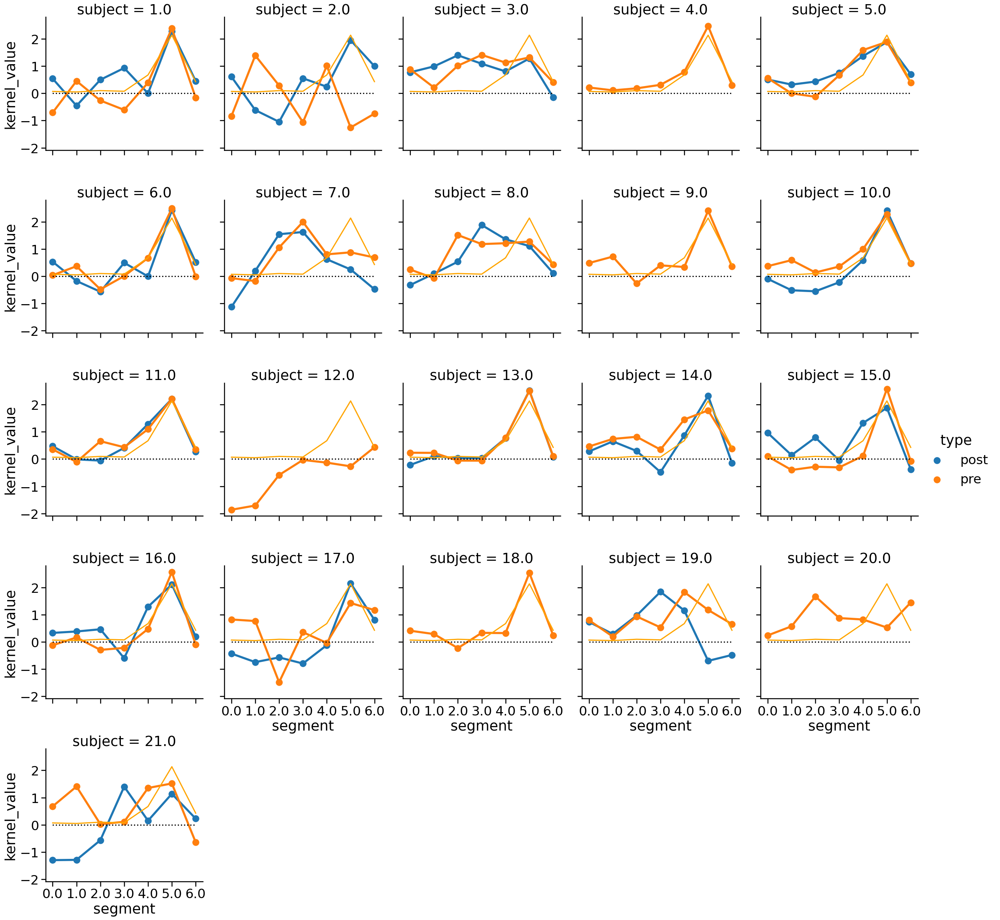

In [32]:
sns.set_context('talk', font_scale=1.5) 

g = sns.catplot(x="segment", 
                y="kernel_value",
                col = "subject",
                hue='type',
                col_wrap=5,
                data=kernels[(kernels.type!='controls')], 
                kind='point')

control_kernels = kernels[kernels.type=='controls'].groupby('segment')['kernel_value'].mean().reset_index()
axes =  g.axes.flatten()
for axis in axes:
    axis.plot(control_kernels['segment'], control_kernels['kernel_value'], color='orange')
    axis.plot([0,6],[0,0],color='k',linestyle = ':')
plt.savefig('subjects_kernels.png')


### Internal noise measurements

In [33]:
double_pass = utils.index_double_pass_trials(merge_data, 
                               session_identifiers=['type','subject','session'],
                               trial_identifier='trial',
                               response_identifier='double_pass_id',
                               value_identifier='pitch')

AttributeError: module 'utils' has no attribute 'index_double_pass_trials'

In [34]:
#revcor_data['response'] = pd.to_numeric(revcor_data['response'], errors='coerce')
prob_agreement = utils.compute_prob_agreement(double_pass,
                             session_identifiers=['type','subject','session'],
                             trial_identifier='trial',
                             response_identifier='response',
                             order_identifier='stim_order',
                             double_pass_identifier='double_pass_id')
prob_agreement = prob_agreement.dropna(subset=['double_pass_id']).groupby(trial_ids).pc_agree.mean()

AttributeError: module 'utils' has no attribute 'compute_prob_agreement'

In [121]:
prob_int_1 = utils.compute_prob_interval1(double_pass,
                             session_identifiers=['subject', 'type','session','experimentor'],
                             trial_identifier='trial',
                             response_identifier='response',
                             order_identifier='stim_order',
                             double_pass_identifier='double_pass_id')

In [122]:
internal_noise_measures = prob_int_1.merge(prob_agreement, on=trial_ids)

In [123]:
# load precomputed model or recompute if doesn't exist
MODEL_FILE = 'data/model_with_criteria_5.csv'
if os.path.isfile(MODEL_FILE): 
    model_with_criteria = pd.read_csv(MODEL_FILE, index_col=0)
else:
    model_with_criteria = grid.estimate_model(internal_noise_bounds=[0,5,0.05],criteria_bounds=[-5,5,0.05],n_trials=10000)
    model_with_criteria.to_csv(MODEL_FILE)

In [124]:
internal_noise_measures['criteria'] = internal_noise_measures.apply(lambda row: grid.invert_model(model_with_criteria, 
                                                                                      row.pc_agree, 
                                                                                      row.p_int1)[0], axis=1)
internal_noise_measures['internal_noise_with_criteria'] = internal_noise_measures.apply(lambda row: grid.invert_model(model_with_criteria, 
                                                                                      row.pc_agree, 
                                                                                      row.p_int1)[1], axis=1)

In [125]:
internal_noise_measures.criteria = np.abs(internal_noise_measures.criteria)

In [126]:
internal_noise_measures=internal_noise_measures.merge(clinical_data, how='left',on= ['type','subject','experimentor','session'])

In [127]:
control_kernel = kernels[kernels.type=='controls'].groupby(['segment'], as_index=False).kernel_value.mean()

accuracy=classification_images.compute_accuracy(merge_data,
                                                control_kernel = list(control_kernel.kernel_value),
                                                session_identifiers = ['experimentor','type','subject','session'],
                                                trial_identifier = 'trial',
                                                stimulus_dimension='segment',
                                                stimulus_value = 'pitch',
                                                stimulus_response='response')

accuracy = accuracy.rename(columns={'hit':'accuracy'})

## Results

In [128]:
revcor_measures = distances.merge(internal_noise_measures, how='left',on= trial_ids).merge(accuracy, how='left', on=trial_ids )

In [38]:
kernels.reset_index().to_csv('kernels.csv')

In [39]:
revcor_measures.reset_index().to_csv('revcor_measures.csv')

In [150]:
for name, group in revcor_measures.groupby('session'):
    print(name, group['hemisphere'].unique())

1.0 [nan 'D' 'G']
2.0 ['D' 'G']


In [151]:
for name, group in revcor_measures.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Insulaire' 'Temporal' 'Fronto-temporal' 'Frontal' 'Fronto-pariétal'
 'Temporo-insulaire' 'Pariétal']
G ['Frontal' 'Temporal' 'Pariétal' 'Temporo-insulaire' 'Fronto-calleux']


In [152]:
revcor_measures['hemisphere'] = revcor_measures['hemisphere'].replace({'D': 'Right', 'G': 'Left'})

In [153]:
revcor_measures['localization'] = revcor_measures['localization'].replace({'Pariétal':'Parietal','Temporo-insulaire':'Temporoinsular', 'Fronto-calleux':'Frontocallosal','Fronto-pariétal': 'Frontoparietal','Insulaire':'Insular','Fronto-temporal':'Frontotemporal'})

In [154]:
for name, group in revcor_measures.groupby('hemisphere'):
    print(name, group['localization'].unique())

Left ['Frontal' 'Temporal' 'Parietal' 'Temporoinsular' 'Frontocallosal']
Right ['Insular' 'Temporal' 'Frontotemporal' 'Frontal' 'Frontoparietal'
 'Temporoinsular' 'Parietal']


### Figure of mean kernels and mean internal noise

In [42]:
revcor_measures = pd.read_csv("revcor_measures.csv", index_col=0)
revcor_measures=revcor_measures.drop('index', axis=1)
revcor_measures

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,...,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,accuracy
0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,0.85,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.746667
1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693333
2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,1.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.613333
3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,1.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.606667
4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,0.45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,0.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,1.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.646667
7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,0.70,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.726667
8,aynaz,controls,9.0,1.0,0.142973,0.953830,0.410000,0.860000,0.35,0.35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.820000
9,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,0.60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.740000


In [43]:
for name, group in revcor_measures.groupby('session'):
    print(name, group['hemisphere'].unique())

1.0 [nan 'D' 'G']
2.0 ['D' 'G']


In [44]:
for name, group in revcor_measures.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Insulaire' 'Temporal' 'Fronto-temporal' 'Frontal' 'Fronto-pariétal'
 'Temporo-insulaire' 'Pariétal']
G ['Frontal' 'Temporal' 'Pariétal' 'Temporo-insulaire' 'Fronto-calleux']


In [45]:
revcor_measures['hemisphere'] = revcor_measures['hemisphere'].replace({'D': 'Right', 'G': 'Left'})

In [46]:
revcor_measures['localization'] = revcor_measures['localization'].replace({'Pariétal':'Parietal','Temporo-insulaire':'Temporoinsular', 'Fronto-calleux':'Frontocallosal','Fronto-pariétal': 'Frontoparietal','Insulaire':'Insular','Fronto-temporal':'Frontotemporal'})

In [47]:
for name, group in revcor_measures.groupby('hemisphere'):
    print(name, group['localization'].unique())

Left ['Frontal' 'Temporal' 'Parietal' 'Temporoinsular' 'Frontocallosal']
Right ['Insular' 'Temporal' 'Frontotemporal' 'Frontal' 'Frontoparietal'
 'Temporoinsular' 'Parietal']


In [48]:
def classify_localization(localization):
    if pd.isna(localization):
        return 'controls'
    elif isinstance(localization, str):
        if localization.startswith('Front'):
            return 'Frontal'
        elif localization.startswith('Tempo'):
            return 'Temporal'
    return localization

revcor_measures['lateralization'] = revcor_measures['localization'].apply(classify_localization)
revcor_measures

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,...,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,accuracy,lateralization
0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,0.85,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.746667,controls
1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,0.55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.693333,controls
2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,1.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.613333,controls
3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,1.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.606667,controls
4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,0.45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000,controls
5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,0.75,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.760000,controls
6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,1.25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.646667,controls
7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,0.70,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.726667,controls
8,aynaz,controls,9.0,1.0,0.142973,0.953830,0.410000,0.860000,0.35,0.35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.820000,controls
9,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,0.60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.740000,controls


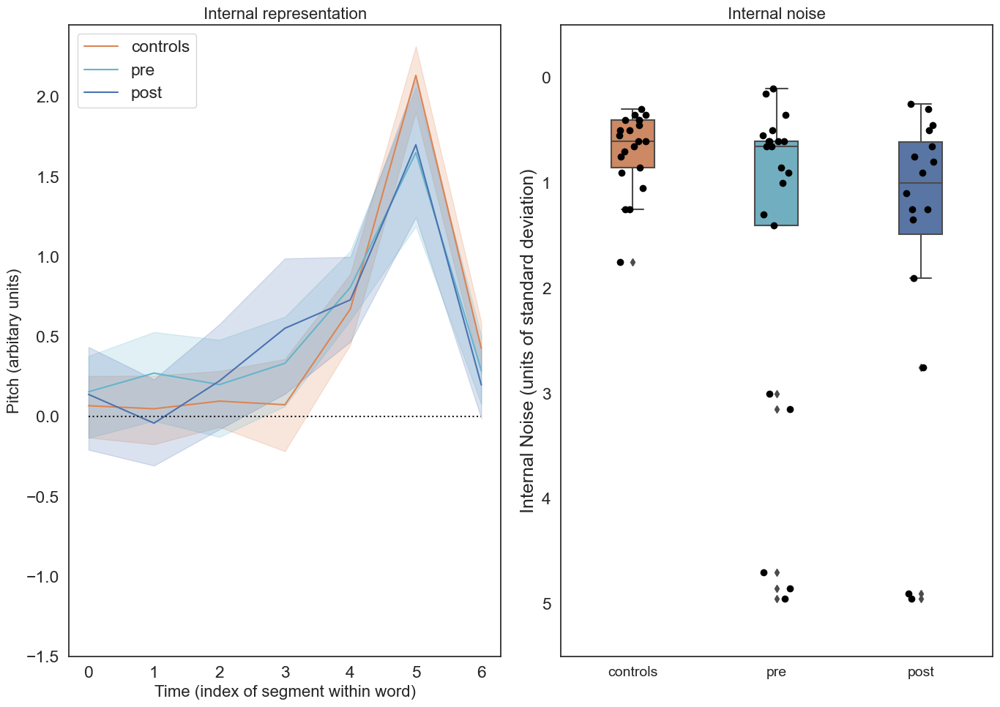

In [130]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "pre", "post"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="type",
             data=kernels,
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "pre", "post"]

sns.boxplot(data=revcor_measures,
            x="type",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures,
              x="type",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


(-0.2, 2.459759625623513)

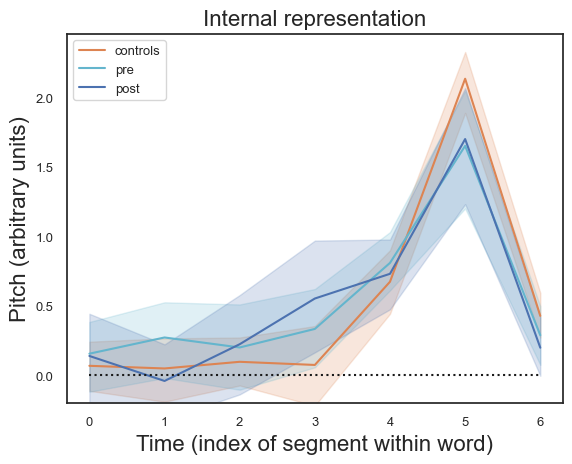

In [55]:
my_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}

orders = ["controls", "pre", "post"]
palette = my_palette  # Define your color palette here

# Create the line plot directly with seaborn
lineplot = sns.lineplot(x="segment", 
                        y="kernel_value",
                        hue="type",
                        data=kernels,
                        ci=95,
                        hue_order=orders,
                        palette=palette)

# Set labels, title, legend, and line styles using plt (matplotlib)
plt.xlabel("Time (index of segment within word)", fontsize=16)
plt.ylabel("Pitch (arbitrary units)", fontsize=16)
plt.title("Internal representation", fontsize=16)
plt.plot([0, 6], [0, 0], color='k', linestyle=':')  # Adding a reference line
plt.legend(title=None)
plt.ylim(-0.2, None)

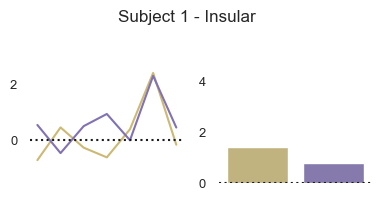

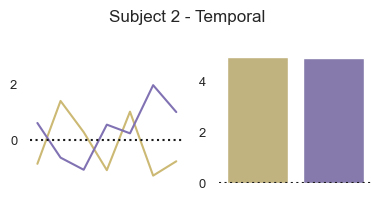

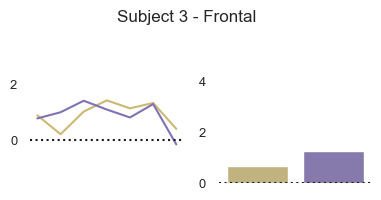

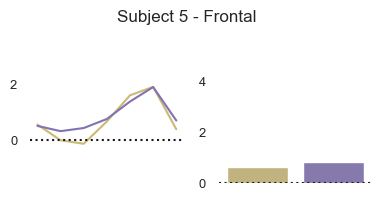

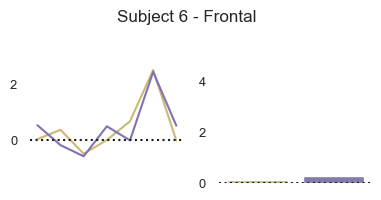

...

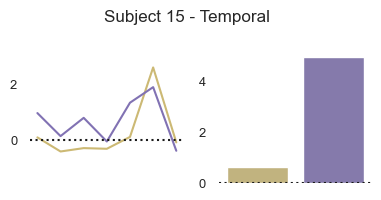

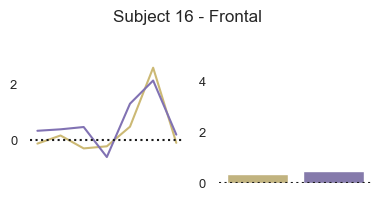

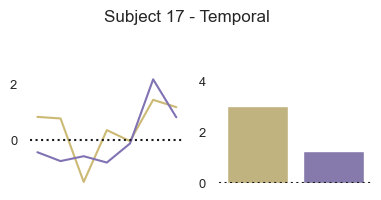

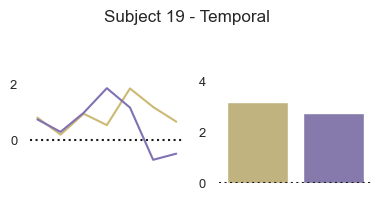

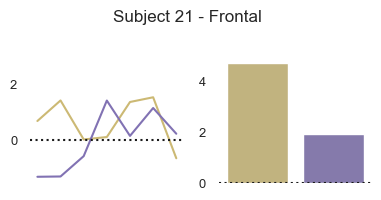

In [161]:
sns.set(font_scale=0.85, style="white")
my_palette = {"pre": sns.color_palette()[8], "post": sns.color_palette()[4]}
orders = ["pre", "post"]

# Assuming 'revcor_measures' and 'kernels' are your DataFrames

# Filter out 'controls' and ensure subjects have both 'pre' and 'post' entries
filtered_revcor = revcor_measures[revcor_measures['type'] != 'controls']
valid_subjects_revcor = filtered_revcor.groupby('subject').filter(lambda x: set(['pre', 'post']).issubset(x['type'].unique()))

filtered_kernels = kernels[kernels['type'] != 'controls']
valid_subjects_kernels = filtered_kernels.groupby('subject').filter(lambda x: set(['pre', 'post']).issubset(x['type'].unique()))

# Plotting for each valid subject in revcor_measures (assuming similar subjects are in kernels)
for subject in valid_subjects_revcor['subject'].unique():
    subject_data_revcor = valid_subjects_revcor[valid_subjects_revcor['subject'] == subject]
    subject_data_kernels = valid_subjects_kernels[valid_subjects_kernels['subject'] == subject]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(4, 2))  # Adjust figsize to fit your display

    # Line plot for kernel typicality from 'kernels' DataFrame
    sns.lineplot(x="segment", 
                 y="kernel_value",
                 hue="type",
                 data=subject_data_kernels,
                 ci=95,
                 hue_order=orders,
                 ax=ax1,
                 palette=my_palette)
    #ax1.set_title(f"Subject {subject}")
    ax1.axhline(0, color='k', linestyle=':')
    ax1.set_ylabel("")  
    ax1.set_xlabel("") 
    ax1.grid(False) 
    ax1.get_legend().remove() 
    ax1.set_facecolor('white')
    ax1.set_ylim(-1.5, 3)
    #ax1.set_yticks([])
    ax1.set_xticks([])
    for spine in ax1.spines.values():
        spine.set_visible(False)
   


    # Bar plot for internal noise from 'revcor_measures' DataFrame
    sns.barplot(data=subject_data_revcor,
                x="type",
                y="internal_noise_with_criteria",
                ax=ax2,
                palette=my_palette,
                order=["pre", "post"],
                ci=None)  # ci=None to not show error bars
    #ax2.set_title(f"Subject {subject}")
    ax2.axhline(0, color='k', linestyle=':')
    ax2.set_ylabel("")  
    ax2.set_xlabel("") 
    ax2.grid(False) 
    ax2.set_ylim(0, 5)
    ax2.set_facecolor('white')
    #ax2.invert_yaxis()
    ax2.set_xticks([])
    #ax2.set_yticks([])
    for spine in ax2.spines.values():
        spine.set_visible(False)
    lateralization_value = subject_data_revcor['lateralization'].iloc[0]
    fig.suptitle(f"Subject {int(subject)} - {lateralization_value}")
    fig.tight_layout()
    plt.show()

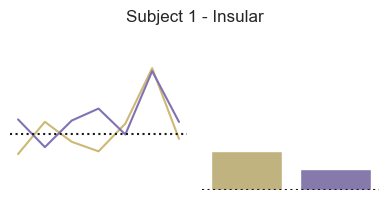

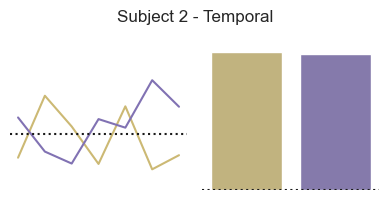

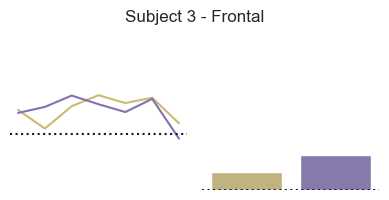

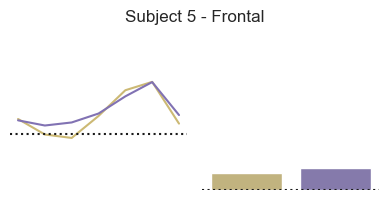

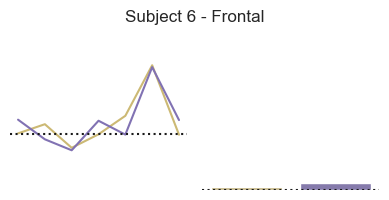

...

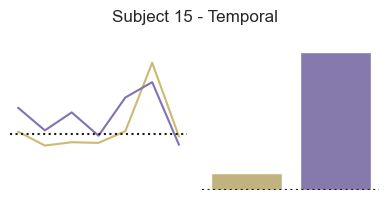

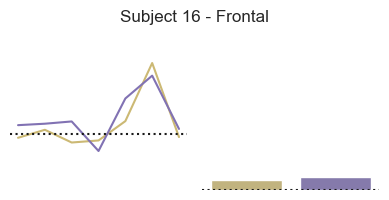

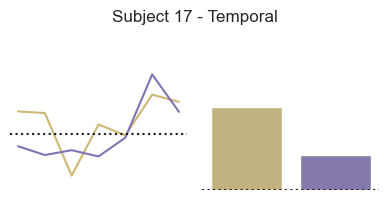

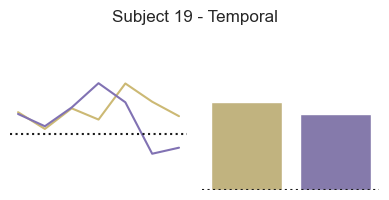

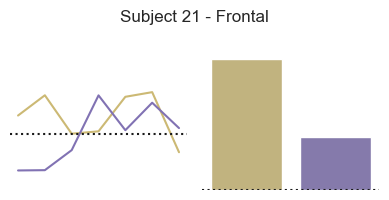

In [159]:
sns.set(font_scale=0.85, style="white")
my_palette = {"pre": sns.color_palette()[8], "post": sns.color_palette()[4]}
orders = ["pre", "post"]

# Assuming 'revcor_measures' and 'kernels' are your DataFrames

# Filter out 'controls' and ensure subjects have both 'pre' and 'post' entries
filtered_revcor = revcor_measures[revcor_measures['type'] != 'controls']
valid_subjects_revcor = filtered_revcor.groupby('subject').filter(lambda x: set(['pre', 'post']).issubset(x['type'].unique()))

filtered_kernels = kernels[kernels['type'] != 'controls']
valid_subjects_kernels = filtered_kernels.groupby('subject').filter(lambda x: set(['pre', 'post']).issubset(x['type'].unique()))

# Plotting for each valid subject in revcor_measures (assuming similar subjects are in kernels)
for subject in valid_subjects_revcor['subject'].unique():
    subject_data_revcor = valid_subjects_revcor[valid_subjects_revcor['subject'] == subject]
    subject_data_kernels = valid_subjects_kernels[valid_subjects_kernels['subject'] == subject]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(4, 2))  # Adjust figsize to fit your display

    # Line plot for kernel typicality from 'kernels' DataFrame
    sns.lineplot(x="segment", 
                 y="kernel_value",
                 hue="type",
                 data=subject_data_kernels,
                 ci=95,
                 hue_order=orders,
                 ax=ax1,
                 palette=my_palette)
    #ax1.set_title(f"Subject {subject}")
    ax1.axhline(0, color='k', linestyle=':')
    ax1.set_ylabel("")  
    ax1.set_xlabel("") 
    ax1.grid(False) 
    ax1.get_legend().remove() 
    ax1.set_facecolor('white')
    ax1.set_ylim(-2, 3)
    ax1.set_yticks([])
    ax1.set_xticks([])
    for spine in ax1.spines.values():
        spine.set_visible(False)
   


    # Bar plot for internal noise from 'revcor_measures' DataFrame
    sns.barplot(data=subject_data_revcor,
                x="type",
                y="internal_noise_with_criteria",
                ax=ax2,
                palette=my_palette,
                order=["pre", "post"],
                ci=None)  # ci=None to not show error bars
    #ax2.set_title(f"Subject {subject}")
    ax2.axhline(0, color='k', linestyle=':')
    ax2.set_ylabel("")  
    ax2.set_xlabel("") 
    ax2.grid(False) 
    ax2.set_ylim(0, 5)
    ax2.set_facecolor('white')
    #ax2.invert_yaxis()
    ax2.set_xticks([])
    ax2.set_yticks([])
    for spine in ax2.spines.values():
        spine.set_visible(False)
    lateralization_value = subject_data_revcor['lateralization'].iloc[0]
    fig.suptitle(f"Subject {int(subject)} - {lateralization_value}")
    fig.tight_layout()
    plt.show()

<Figure size 4000x1000 with 0 Axes>

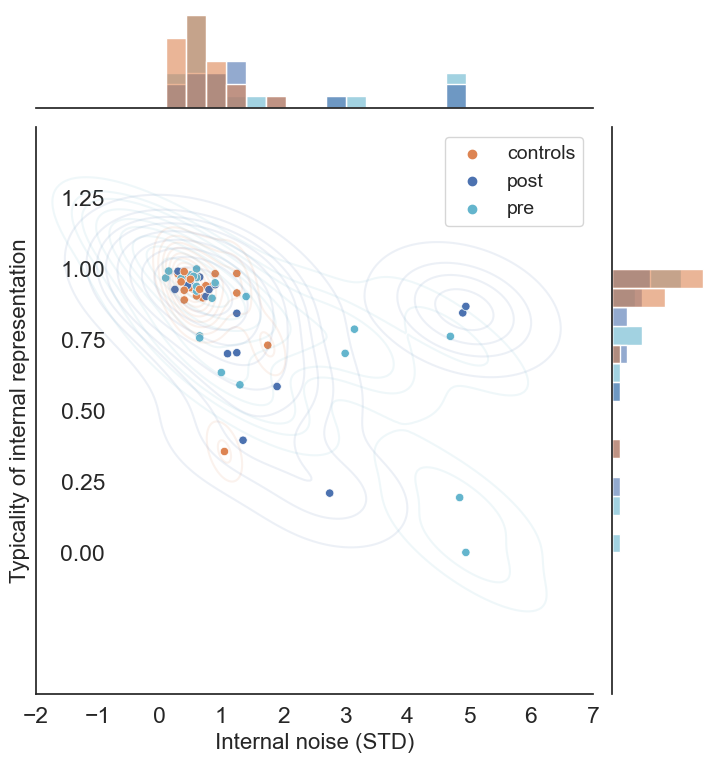

In [131]:
def plot_clusters_kde_x(data, x, y, hue, x_range, color='blue', linewidth=2, save_path=None):
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}
    g = sns.JointGrid(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, height=8)
    
    # Customize the KDE plot color and linewidth within the sns.kdeplot function
    g.plot_joint(sns.kdeplot, fill=False, common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth)
    
    # Create histogram marginals
    g.plot_marginals(sns.histplot, color="#03051A", alpha=0.6, bins=15)
    
    g.set_axis_labels(xlabel='Internal noise (STD)', ylabel='Typicality of internal representation', fontsize=16)
    g.ax_joint.set_facecolor('white')
    g.ax_joint.set_ylim([-0.5, 1.5])
    g.ax_joint.set_yticks([ 0,0.25,0.50,0.75,1.00,1.25])
    
    g.ax_joint.tick_params(axis='y', direction='in', length=0)
    g.ax_joint.yaxis.set_tick_params(pad=-50)
    g.ax_joint.set_xlim([x_range[0], x_range[1]])  # Separate x-axis limits
    g.ax_joint.set_xticks([x_range[0]-2,x_range[0]-1,x_range[0],x_range[0]+1,x_range[0]+2,x_range[0]+3,x_range[0]+4,x_range[1]-1,x_range[1] ,x_range[1]+1])  # Adjust the x-axis ticks as needed

    sns.scatterplot(data=filtered_data, x=x, y=y, hue=hue,palette=custom_palette ,ax=g.ax_joint)
    g.ax_joint.legend(title=None, fontsize=14)
    
    
    plt.show()  # Show the plot

# Create the first plot
plt.figure(figsize=(40, 10))  # Create a new figure
plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(0, 6), color='blue', linewidth=2)



In [148]:
for name, group in revcor_measures.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Insulaire' 'Temporal' 'Fronto-temporal' 'Frontal' 'Fronto-pariétal'
 'Temporo-insulaire' 'Pariétal']
G ['Frontal' 'Temporal' 'Pariétal' 'Temporo-insulaire' 'Fronto-calleux']


### Statistics

In [132]:
custom_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}
def explore_distribution(data, group, measures):
    
    for measure in measures:
        plt.figure(figsize=(22,10))
        plt.suptitle(measure.capitalize(), fontsize=12, y=1.05)

        plt.subplot(1, 3, 1)
        sns.histplot(x=data[measure], kde=True, hue=data[group], multiple='stack', palette=custom_palette)
        plt.xlabel(measure.capitalize())

        plt.subplot(1, 3, 2)
        probplot(data[measure], plot=plt)

        plt.subplot(1, 3, 3)
        sns.boxplot(x=group, y=measure, data=data, palette=custom_palette)
        plt.xlabel(group.capitalize())
        plt.ylabel(measure.capitalize())
        plt.tight_layout()

        plt.show()

In [133]:
def display_group_comparisons_stat(data, group, measures):
    
    fig = plt.figure(figsize=(20,5))
    num_plots = len(measures)
    
    for num_measure, measure in enumerate(measures):
        
        data = data.dropna(subset=[measure, group])
        
        group1 = data[data[group]==data[group].unique()[0]][measure]
        group2 = data[data[group]==data[group].unique()[1]][measure]
        U_stat, p_val = mannwhitneyu(group1, group2, alternative='two-sided')
        r = 1 - (2*U_stat)/(len(group1)*len(group2))
        mean1 = group1.mean()
        mean2 = group2.mean()

        median1 = group1.median()
        median2 = group2.median()

        # Bootstrapping for confidence interval of median difference
        n_bootstraps = 10000
        boot_median_differences = []
        boot_mean_differences = []
        
        for i in range(n_bootstraps):
            
            boot_group1 = group1.sample(len(group1), replace=True)
            boot_group2 = group2.sample(len(group2), replace=True)
            # bootstrap mean
            boot_mean_difference = boot_group1.mean() - boot_group2.mean()
            boot_mean_differences.append(boot_mean_difference)
            # bootstrap median
            boot_median_difference = boot_group1.median() - boot_group2.median()
            boot_median_differences.append(boot_median_difference)
        # CI on mean
        boot_mean_differences.sort()
        mean_CI_low = boot_mean_differences[int(n_bootstraps*0.025)]
        mean_CI_high = boot_mean_differences[int(n_bootstraps*0.975)]
        # CI on median
        boot_median_differences.sort()
        median_CI_low = boot_median_differences[int(n_bootstraps*0.025)]
        median_CI_high = boot_median_differences[int(n_bootstraps*0.975)]

        # report the result
        print('------------------------------------')
        print('Mann-Whitney U Test for', measure.upper(), 'and', group.upper())
        print(f"Med = {median1-median2:.2f} [{median_CI_low:.2f} - {median_CI_high:.2f}]")
        print(f"M = {mean1-mean2:.2f} [{mean_CI_low:.2f} - {mean_CI_high:.2f}], U={U_stat:.2f}, r={r:.2f}, p={p_val:.3f}")

#### Reverse correlation measures differentiate patients and controls 

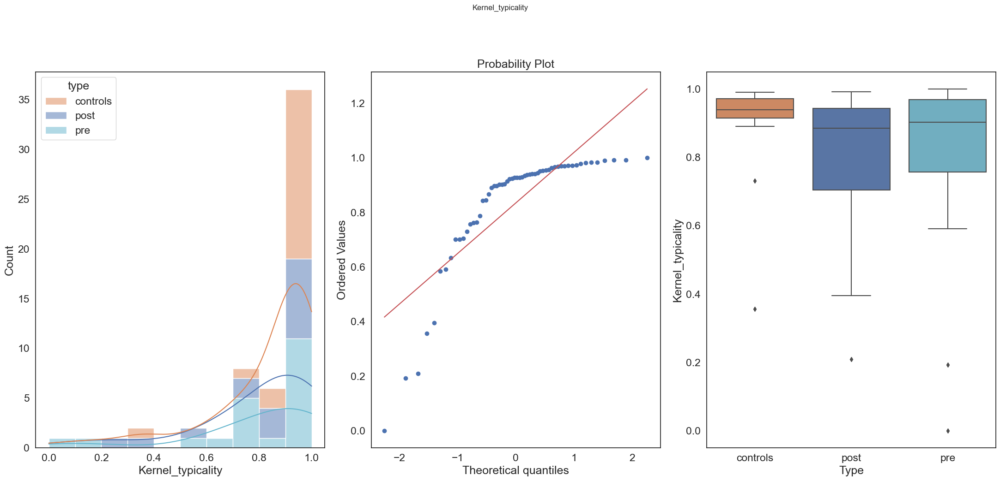

In [134]:
explore_distribution(data=revcor_measures, group='type', measures = ['kernel_typicality'])

In [135]:
from scipy.stats import shapiro
df=revcor_measures
pre = df[df['type'] == 'pre']['kernel_typicality']
controls = df[df['type'] == 'controls']['kernel_typicality']
post = df[df['type'] == 'post']['kernel_typicality']
print("pre normality:", shapiro(pre))
print("controls normality:", shapiro(controls))
print("post normality:", shapiro(post))

pre normality: ShapiroResult(statistic=0.7374241352081299, pvalue=8.37223487906158e-05)
controls normality: ShapiroResult(statistic=0.5230183005332947, pvalue=3.3395571108485456e-07)
post normality: ShapiroResult(statistic=0.7885473966598511, pvalue=0.0019265927840024233)


In [136]:
pre = df[df['type'] == 'pre']['internal_noise_with_criteria']
controls = df[df['type'] == 'controls']['internal_noise_with_criteria']
post = df[df['type'] == 'post']['internal_noise_with_criteria']
print("pre normality:", shapiro(pre))
print("controls normality:", shapiro(controls))
print("post normality:", shapiro(post))

pre normality: ShapiroResult(statistic=0.7272429466247559, pvalue=6.137538002803922e-05)
controls normality: ShapiroResult(statistic=0.8574202060699463, pvalue=0.0057168989442288876)
post normality: ShapiroResult(statistic=0.7406967282295227, pvalue=0.0004918966442346573)


In [54]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], 
                               group='type', 
                               measures = ['kernel_typicality'])

------------------------------------
Mann-Whitney U Test for KERNEL_TYPICALITY and TYPE
Med = 0.04 [-0.03 - 0.19]
M = 0.11 [-0.01 - 0.25], U=274.00, r=-0.24, p=0.182


<Figure size 2000x500 with 0 Axes>

In [55]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], 
                               group='type', 
                               measures = ['internal_noise_with_criteria'])

------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_WITH_CRITERIA and TYPE
Med = -0.05 [-0.75 - 0.10]
M = -0.80 [-1.53 - -0.18], U=158.50, r=0.28, p=0.121


<Figure size 2000x500 with 0 Axes>

In [66]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], 
                               group='type', 
                               measures = ['kernel_typicality'])

------------------------------------
Mann-Whitney U Test for KERNEL_TYPICALITY and TYPE
Med = 0.05 [-0.01 - 0.23]
M = 0.11 [-0.01 - 0.24], U=233.00, r=-0.39, p=0.048


<Figure size 2000x500 with 0 Axes>

In [56]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], 
                               group='type', 
                               measures = ['internal_noise_with_criteria'])

------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_WITH_CRITERIA and TYPE
Med = -0.40 [-0.92 - 0.00]
M = -0.81 [-1.59 - -0.16], U=102.50, r=0.39, p=0.046


<Figure size 2000x500 with 0 Axes>

In [57]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','pre'])], 
                               group='type', 
                               measures = ['internal_noise_with_criteria'])

------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_WITH_CRITERIA and TYPE
Med = 0.35 [-0.40 - 0.75]
M = 0.01 [-0.94 - 1.00], U=184.50, r=-0.10, p=0.623


<Figure size 2000x500 with 0 Axes>

In [58]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','pre'])], 
                               group='type', 
                               measures = ['kernel_typicality'])

------------------------------------
Mann-Whitney U Test for KERNEL_TYPICALITY and TYPE
Med = -0.02 [-0.19 - 0.16]
M = 0.00 [-0.15 - 0.16], U=153.00, r=0.09, p=0.657


<Figure size 2000x500 with 0 Axes>

In [258]:
df=revcor_measures
groups = kernels['type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['type'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['type'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls   post        233.0  0.047999     21     16
1  controls    pre        274.0  0.182448     21     21
2      post    pre        153.0  0.656662     16     21
Found significant differences between some pairs for kernel typicality


In [60]:
df=revcor_measures
groups = df['type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['type'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['type'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls   post        102.5  0.045971     21     16
1  controls    pre        158.5  0.121013     21     21
2      post    pre        184.5  0.623401     16     21
Found significant differences between some pairs for internal noise


#### Reverse correlation measures differentiate pre and post operation patients

In [61]:
df=revcor_measures[revcor_measures.type.isin(['pre','post'])]
df=df[~df.subject.isin([4,9,12,18,20])]
types  = df['type'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['type'] == types[0]]['internal_noise_with_criteria'].values
    data2 = df[df['type'] == types[1]]['internal_noise_with_criteria'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for internal noise between pre and post operation: {stat}, P-value: {pvalue}, Size1 : {len(data1)}, Size2 : {len(data2)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for internal noise between pre and post operation: 49.0, P-value: 0.5319644366832486, Size1 : 16, Size2 : 16


In [62]:
df=revcor_measures[revcor_measures.type.isin(['pre','post'])]
df=df[~df.subject.isin([4,9,12,18,20])]
types  = df['type'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['type'] == types[0]]['kernel_typicality'].values
    data2 = df[df['type'] == types[1]]['kernel_typicality'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for kernel typicality between pre and post operation: {stat}, P-value: {pvalue}, Size1 : {len(data1)}, Size2 : {len(data2)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for kernel typicality between pre and post operation: 44.0, P-value: 0.231201171875, Size1 : 16, Size2 : 16


#### Localization differentiate patients and controls 

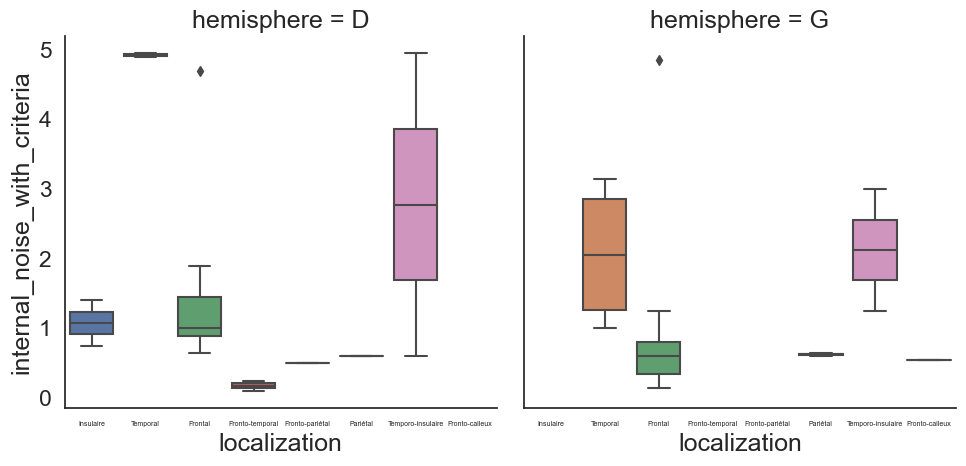

In [63]:
g = sns.catplot(
    data=revcor_measures, 
    x='localization', 
    y='internal_noise_with_criteria',
    col='hemisphere', 
    kind='box', 
    col_wrap=2
)

# Set xtick labels with a smaller font size
g.set_xticklabels(fontsize=5)

# Adjust the layout so labels and titles don't overlap
g.fig.tight_layout()

# Show the plot
plt.show()

In [64]:
for name, group in clinical_data.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Insulaire' 'Temporal' 'Pariétal' 'Fronto-temporal' 'Frontal'
 'Fronto-pariétal' 'Temporo-insulaire']
G ['Frontal' 'Temporal' 'Pariétal' 'Temporo-insulaire' 'Fronto-calleux']


In [68]:
revcor_measures.groupby(['hemisphere','type']).agg({'kernel_typicality':['mean','std'],
                                                                'internal_noise_with_criteria':['mean','std','max']})

kernel_typicality           internal_noise_with_criteria  \
                                 mean       std                         mean   
hemisphere type                                                                
D          post              0.841436  0.131638                     1.906250   
           pre               0.779502  0.302226                     1.565000   
G          post              0.748133  0.293822                     1.100000   
           pre               0.790613  0.245848                     1.490000   
controls   controls          0.906971  0.137763                     0.692857   

                                     
                          std   max  
hemisphere type                      
D          post      1.925290  4.95  
           pre       1.759901  4.95  
G          post      0.773212  2.75  
           pre       1.592831  4.85  
controls   controls  0.371243  1.75

In [266]:
df=revcor_measures[(revcor_measures.lateralization=='Frontal')&(revcor_measures.hemisphere=='Right')]
df=df[~df.subject.isin([4,9,12,18,20])]
groups = df['type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['type'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['type'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right and left hemisphere) ")
else:
    print("No significant differences for internal representation found between any pairs.")

  Group1 Group2  U-statistic   P-value  Size1  Size2
0   post    pre         14.5  0.753298      5      5
No significant differences for internal representation found between any pairs.


## Analysis of neuropsy data (i-mel, pseudo)

In [65]:
def display_regressions_assumptions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)

    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome, x=predictor, data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)

        #print('------------------------------------')
        formula = ' + '.join(['%s ~ %s' % (outcome, predictor)] + ['%s' % control for control in controls])
        with capture_output() as c:
            model = ols(formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        print(formula.upper())
        #print(model.summary())

        # Normality test of residuals
        print("\nNormality Test of Residuals for %s" % outcome)
        print("------------------------------------")
        stat, p_ks = kstest_fit(model.resid)
        stat, p_ad = normal_ad(model.resid)
        print(f"p-value for normality: AD {p_ad:.4f} KS {p_ks:.4f}")
        
        # Homoscedasticity test of residuals
        print("\nHomoscedasticity Test of Residuals for %s" % outcome)
        print("------------------------------------")
        stat, p, _, _ = het_breuschpagan(model.resid, model.model.exog)
        print(f"p-value for homoscedasticity: {p:.4f}")

    plt.tight_layout()
    plt.tight_layout()

In [66]:
import seaborn as sns
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt

def display_regressions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome,
                    x=predictor,
                    data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)
        
        print('------------------------------------')
        formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Apply the Bonferroni correction
        p_vals_corrected = model.pvalues * num_plots
        # Ensure that the corrected p-values do not exceed 1
        p_vals_corrected = p_vals_corrected.apply(lambda x: min(x, 1))
        
        # Print the formula and results with corrected p-values
        print(formula.upper())
        print(model.summary())
        print("\nCorrected p-values for multiple testing:")
        print(p_vals_corrected)
    
    plt.tight_layout()

# Note: This code assumes you have a function or package `Lm` that behaves like `statsmodels.formula.api.ols`.
# If Lm is part of a custom package, you'll need to adjust the code to apply the p-value correction correctly.


In [73]:
from scipy.stats import mannwhitneyu
import numpy as np
import matplotlib.pyplot as plt

def display_group_comparisons_stat(data, group, measures):
    # Initialize a figure for plotting
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(measures)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_measure, measure in enumerate(measures):
        # Drop missing values for the current measure and group
        data_subset = data.dropna(subset=[measure, group])
        
        # Split data into two groups based on the unique values in the group column
        group1 = data_subset[data_subset[group] == data_subset[group].unique()[0]][measure]
        group2 = data_subset[data_subset[group] == data_subset[group].unique()[1]][measure]
        
        # Perform the Mann-Whitney U test
        U_stat, p_val_uncorrected = mannwhitneyu(group1, group2, alternative='two-sided')
        
        # Apply the Bonferroni correction
        p_val_corrected = p_val_uncorrected * num_plots
        # Ensure that the corrected p-value does not exceed 1
        p_val_corrected = min(p_val_corrected, 1)
        
        # Calculate effect size (r), mean, and median for the groups
        r = 1 - (2 * U_stat) / (len(group1) * len(group2))
        mean1 = group1.mean()
        mean2 = group2.mean()
        median1 = group1.median()
        median2 = group2.median()

        # Bootstrapping for confidence interval of median difference
        n_bootstraps = 10000
        boot_median_differences = []
        boot_mean_differences = []
        for i in range(n_bootstraps):
            boot_group1 = group1.sample(len(group1), replace=True)
            boot_group2 = group2.sample(len(group2), replace=True)
            # Bootstrap mean and median
            boot_mean_difference = boot_group1.mean() - boot_group2.mean()
            boot_mean_differences.append(boot_mean_difference)
            boot_median_difference = boot_group1.median() - boot_group2.median()
            boot_median_differences.append(boot_median_difference)
        
        # Confidence intervals on mean and median
        boot_mean_differences.sort()
        mean_CI_low = boot_mean_differences[int(n_bootstraps * 0.025)]
        mean_CI_high = boot_mean_differences[int(n_bootstraps * 0.975)]
        boot_median_differences.sort()
        median_CI_low = boot_median_differences[int(n_bootstraps * 0.025)]
        median_CI_high = boot_median_differences[int(n_bootstraps * 0.975)]

        # Report the results with corrected p-value
        print('------------------------------------')
        print('Mann-Whitney U Test for', measure.upper(), 'and', group.upper())
        print(f"Med = {median1 - median2:.2f} [{median_CI_low:.2f} - {median_CI_high:.2f}]")
        print(f"M = {mean1 - mean2:.2f} [{mean_CI_low:.2f} - {mean_CI_high:.2f}], U={U_stat:.2f}, r={r:.2f}, p (uncorrected)={p_val_uncorrected:.3f}, p (Bonferroni corrected)={p_val_corrected:.3f}")


In [149]:
def display_multiple_spearman_correlation(data, group, var_list1, var_list2):
    num_vars1 = len(var_list1)
    num_vars2 = len(var_list2)
    fig, axes = plt.subplots(num_vars1, num_vars2, figsize=(5 * num_vars2, 5 * num_vars1))

    if num_vars1 == 1:
        axes = [axes]
    if num_vars2 == 1:
        axes = [[ax] for ax in axes]

    correlations = []

    for i, var1 in enumerate(var_list1):
        for j, var2 in enumerate(var_list2):
            ax = axes[i][j]
            time_points = data[group].unique()

            for time_point in time_points:
                # Filter data for the current time point
                data_subset = data[data[group] == time_point]

                # Calculate Spearman rank correlation
                correlation, p_value = spearmanr(data_subset[var1], data_subset[var2])
                correlations.append((var1, var2, time_point, correlation, p_value))

                # Plot the data
                sns.scatterplot(x=var1, y=var2, data=data_subset, ax=ax, label=f'{time_point}')
                sns.regplot(x=var1, y=var2, data=data_subset, ax=ax, scatter=True)

            ax.set_title(f'{var1} vs {var2}\n')
            ax.set_xlabel(var1)
            ax.set_ylabel(var2)
            ax.legend(title='Time Point')

    plt.tight_layout()
    plt.show()

    # Print out the correlation results
    for var1, var2, time_point, correlation, p_value in correlations:
        print(f'Spearman rank correlation for {var1} and {var2} ({time_point}):')
        print(f'r = {correlation:.2f}, p = {p_value:.3f}')
        print('------------------------------------')

In [167]:
my_palette = {"Pre": sns.color_palette()[8], "Post": sns.color_palette()[4]}

def display_multiple_spearman_correlation(data, group, var_list1, var_list2, palette):
    num_vars1 = len(var_list1)
    num_vars2 = len(var_list2)
    fig, axes = plt.subplots(num_vars1, num_vars2, figsize=(5 * num_vars2, 5 * num_vars1))

    if num_vars1 == 1:
        axes = [axes]
    if num_vars2 == 1:
        axes = [[ax] for ax in axes]

    correlations = []

    for i, var1 in enumerate(var_list1):
        for j, var2 in enumerate(var_list2):
            ax = axes[i][j]
            time_points = data[group].unique()

            for time_point in time_points:
                # Filter data for the current time point
                data_subset = data[data[group] == time_point]

                # Calculate Spearman rank correlation
                correlation, p_value = spearmanr(data_subset[var1], data_subset[var2])
                correlations.append((var1, var2, time_point, correlation, p_value))

                # Plot the data
                color = palette[time_point.capitalize()]  # Use the palette for colors
                sns.scatterplot(x=var1, y=var2, data=data_subset, ax=ax, color=color)
                sns.regplot(x=var1, y=var2, data=data_subset, ax=ax, scatter=False, color=color)

            ax.set_title(f'{var1} vs {var2}\n')
            ax.set_xlabel(var1)
            ax.set_ylabel(var2)
            ax.legend().remove()  # Remove the legend

    plt.tight_layout()
    plt.show()

    # Print out the correlation results
    for var1, var2, time_point, correlation, p_value in correlations:
        print(f'Spearman rank correlation for {var1} and {var2} ({time_point}):')
        print(f'r = {correlation:.2f}, p = {p_value:.3f}')
        print('------------------------------------')

In [165]:
data = revcor_measures[revcor_measures.type.isin(['pre','post'])]
#df=df[~df.subject.isin([4,9,12,18,20])]

In [180]:
def display_regressions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome,
                    x=predictor,
                    data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)
        
        print('------------------------------------')
        formula = ' + '.join([f'{outcome} ~ {predictor}'] + [f'{control}' for control in controls])
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Apply the Bonferroni correction
        p_vals_corrected = model.pvalues * num_plots
        # Ensure that the corrected p-values do not exceed 1
        p_vals_corrected = p_vals_corrected.apply(lambda x: min(x, 1))
        
        # Print the formula and results with corrected p-values
        print(formula.upper())
        print(model.summary())
        print("\nCorrected p-values for multiple testing:")
        print(p_vals_corrected)
    
    plt.tight_layout()

In [186]:
def display_regressions(data, predictor, outcomes, controls=[]):
    fig = plt.figure(figsize=(20, 5))
    num_plots = len(outcomes)
    # Bonferroni corrected alpha level
    alpha = 0.05 / num_plots
    
    for num_outcome, outcome in enumerate(outcomes):
        plt.subplot(1, num_plots, num_outcome + 1)
        sns.regplot(y=outcome, x=predictor, data=data)
        plt.ylabel(outcome.capitalize())
        plt.xlabel(predictor.capitalize())
        plt.title(outcome.capitalize(), size=8)
        
        print('------------------------------------')
        formula = f'{outcome} ~ {predictor}'
        if controls:
            formula += ' + ' + ' + '.join(controls) + ' - 1'  # Adding ' - 1' to remove intercept
        
        model = smf.ols(formula=formula, data=data.dropna(subset=[predictor, outcome] + controls)).fit()
        
        # Apply the Bonferroni correction
        p_vals_corrected = model.pvalues * num_plots
        # Ensure that the corrected p-values do not exceed 1
        p_vals_corrected = p_vals_corrected.apply(lambda x: min(x, 1))
        
        # Print the formula and results with corrected p-values
        print(formula.upper())
        print(model.summary())
        print("\nCorrected p-values for multiple testing:")
        print(p_vals_corrected)
    
    plt.tight_layout()

In [313]:
'internal_noise_with_criteria'

Index(['experimentor', 'type', 'subject', 'session', 'kernel_distance',
       'kernel_typicality', 'p_int1', 'pc_agree', 'criteria',
       'internal_noise_with_criteria', 'hemisphere', 'localization', 'Grade',
       'Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain', 'ProEmo',
       'ProEmo2', 'ProLing', 'ProLing2', 'Pseudo', 'accuracy',
       'lateralization'],
      dtype='object')

In [397]:
#df=revcor_measures[revcor_measures.hemisphere.isin(['Left','controls'])]
df=revcor_measures
df=df[df.type.isin(['pre','controls'])]
#df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")


     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls  Right        144.0  0.266600     21     11
1  controls   Left        130.0  0.300522     21     10
2     Right   Left         55.0  1.000000     11     10
No significant differences for internal noise found between any pairs.


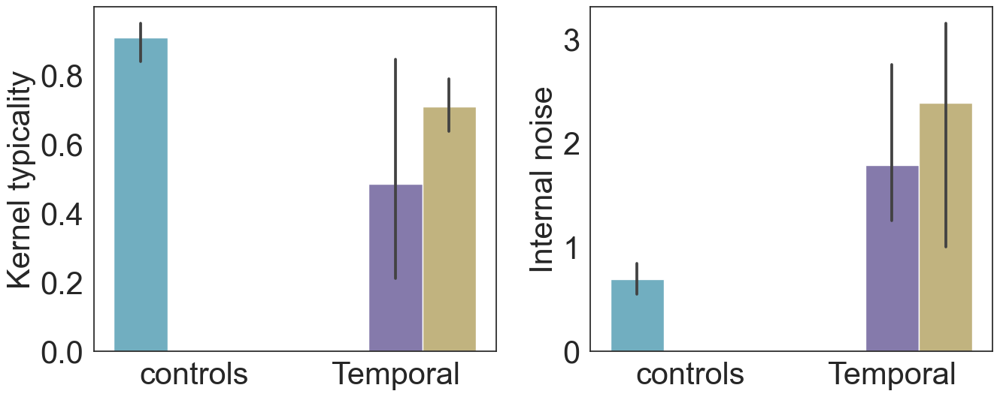

In [353]:
df=revcor_measures[revcor_measures.hemisphere.isin(['Left','controls'])]
#df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
my_palette = {"pre": sns.color_palette()[8],"post": sns.color_palette()[4], "controls": sns.color_palette()[9]}

# Set global font size for labels and ticks
plt.rcParams.update({'font.size': 30})

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Create the first bar plot for kernel typicality
sns.barplot(x='lateralization', y='kernel_typicality', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[0])

# Set plot labels and title for the first plot
axes[0].legend([],[], frameon=False)
axes[0].set_xlabel('', fontsize=30)
axes[0].set_ylabel('Kernel typicality', fontsize=30)
axes[0].set_title('', fontsize=25)

# Increase tick label size for the first plot
axes[0].tick_params(axis='both', which='major', labelsize=30)

# Create the second bar plot for internal noise
sns.barplot(x='lateralization', y='internal_noise_with_criteria', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[1])

# Set plot labels and title for the second plot
axes[1].legend([],[], frameon=False)
axes[1].set_xlabel('', fontsize=30)
axes[1].set_ylabel('Internal noise', fontsize=30)
axes[1].set_title('', fontsize=22)

# Increase tick label size for the second plot
axes[1].tick_params(axis='both', which='major', labelsize=30)

# Show the plots
plt.tight_layout()
plt.show()

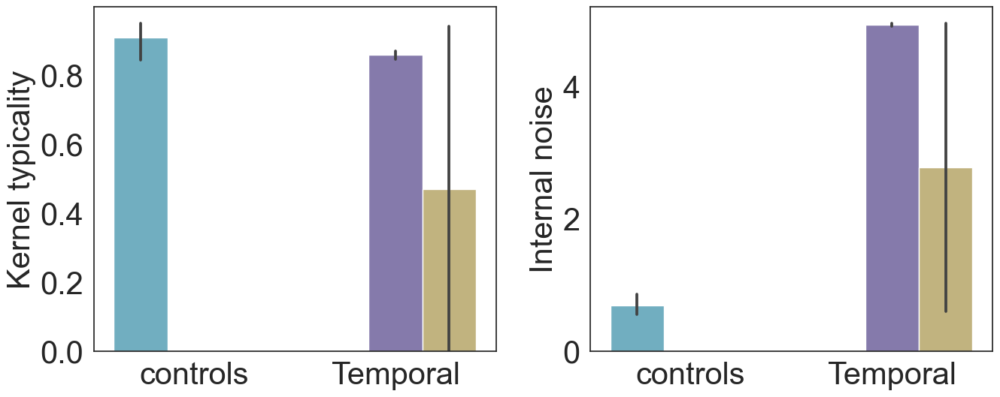

In [354]:
df=revcor_measures[revcor_measures.hemisphere.isin(['Right','controls'])]
#df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
my_palette = {"pre": sns.color_palette()[8],"post": sns.color_palette()[4], "controls": sns.color_palette()[9]}

# Set global font size for labels and ticks
plt.rcParams.update({'font.size': 30})

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Create the first bar plot for kernel typicality
sns.barplot(x='lateralization', y='kernel_typicality', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[0])

# Set plot labels and title for the first plot
axes[0].legend([],[], frameon=False)
axes[0].set_xlabel('', fontsize=30)
axes[0].set_ylabel('Kernel typicality', fontsize=30)
axes[0].set_title('', fontsize=30)

# Increase tick label size for the first plot
axes[0].tick_params(axis='both', which='major', labelsize=30)

# Create the second bar plot for internal noise
sns.barplot(x='lateralization', y='internal_noise_with_criteria', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[1])

# Set plot labels and title for the second plot
axes[1].legend([],[], frameon=False)
axes[1].set_xlabel('', fontsize=30)
axes[1].set_ylabel('Internal noise', fontsize=30)
axes[1].set_title('', fontsize=18)

# Increase tick label size for the second plot
axes[1].tick_params(axis='both', which='major', labelsize=30)

# Show the plots
plt.tight_layout()
plt.show()

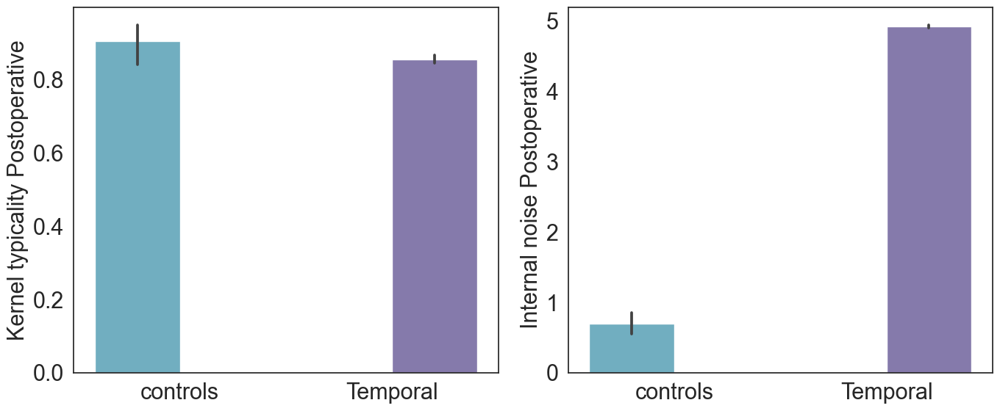

In [350]:
# Define the custom palette
my_palette = {"controls": sns.color_palette()[9], "Temporal": sns.color_palette()[4]}
df=revcor_measures[revcor_measures.hemisphere.isin(['Right','controls'])]
df=df[df.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
# Set global font size for labels and ticks
plt.rcParams.update({'font.size': 20})

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Create the first bar plot for kernel typicality
sns.barplot(x='lateralization', y='kernel_typicality', hue='lateralization', 
            data=df, 
            palette=my_palette, ax=axes[0])

# Set plot labels and title for the first plot
axes[0].legend([],[], frameon=False)
axes[0].set_xlabel('', fontsize=22)
axes[0].set_ylabel('Kernel typicality Postoperative', fontsize=22)
axes[0].set_title('', fontsize=18)

# Increase tick label size for the first plot
axes[0].tick_params(axis='both', which='major', labelsize=22)

# Create the second bar plot for internal noise
sns.barplot(x='lateralization', y='internal_noise_with_criteria', hue='lateralization', 
            data=df, 
            palette=my_palette, ax=axes[1])

# Set plot labels and title for the second plot
axes[1].legend([],[], frameon=False)
axes[1].set_xlabel('', fontsize=22)
axes[1].set_ylabel('Internal noise Postoperative', fontsize=22)
axes[1].set_title('', fontsize=18)

# Increase tick label size for the second plot
axes[1].tick_params(axis='both', which='major', labelsize=22)

# Show the plots
plt.tight_layout()
plt.show()

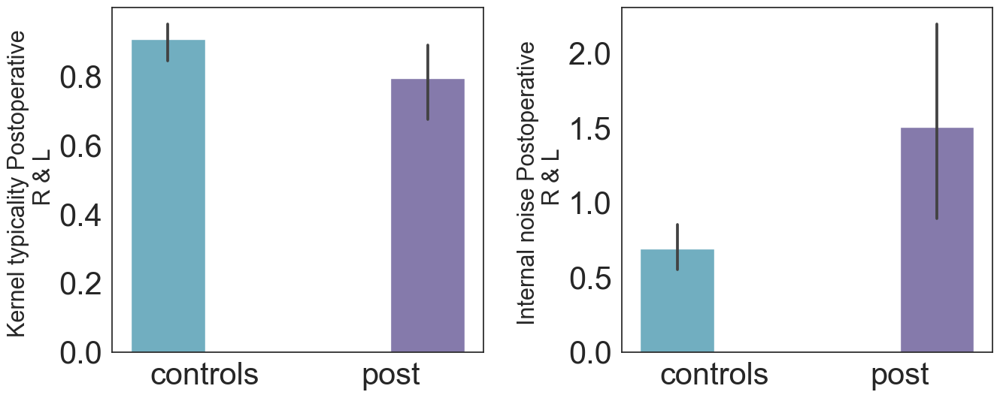

In [377]:
# Define the custom palette
my_palette = {"controls": sns.color_palette()[9], "post": sns.color_palette()[4]}
df=revcor_measures
#df=revcor_measures[revcor_measures.hemisphere.isin(['Right','controls'])]
df=df[df.type.isin(['post','controls'])]
#df=df[df.lateralization.isin(['Temporal','controls'])]
# Set global font size for labels and ticks

plt.rcParams.update({'font.size': 30})

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Create the first bar plot for kernel typicality
sns.barplot(x='type', y='kernel_typicality', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[0])

# Set plot labels and title for the first plot
axes[0].legend([],[], frameon=False)
axes[0].set_xlabel('', fontsize=30)
axes[0].set_ylabel('Kernel typicality Postoperative \n R & L', fontsize=22)
axes[0].set_title('', fontsize=30)

# Increase tick label size for the first plot
axes[0].tick_params(axis='both', which='major', labelsize=30)

# Create the second bar plot for internal noise
sns.barplot(x='type', y='internal_noise_with_criteria', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[1])

# Set plot labels and title for the second plot
axes[1].legend([],[], frameon=False)
axes[1].set_xlabel('', fontsize=30)
axes[1].set_ylabel('Internal noise Postoperative \n R & L', fontsize=22)
axes[1].set_title('', fontsize=18)

# Increase tick label size for the second plot
axes[1].tick_params(axis='both', which='major', labelsize=30)

# Show the plots
plt.tight_layout()
plt.show()

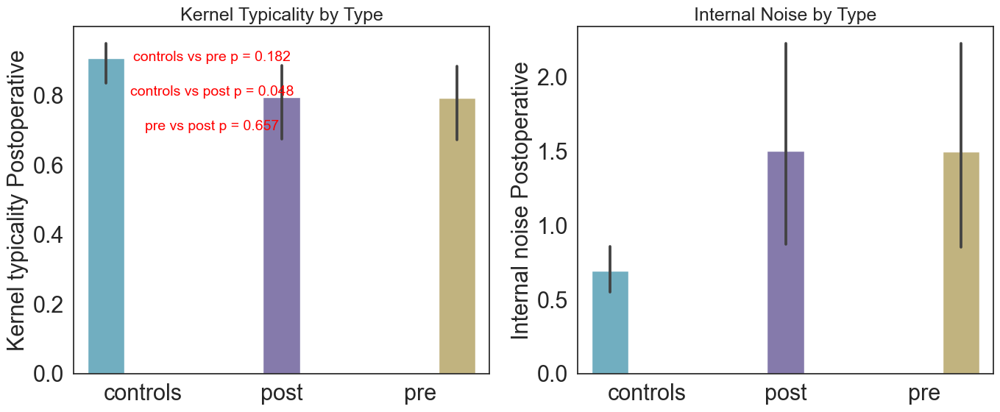

In [361]:
my_palette = {"controls": sns.color_palette()[9], "post": sns.color_palette()[4] ,"pre": sns.color_palette()[8]}
df = revcor_measures

# Set global font size for labels and ticks
plt.rcParams.update({'font.size': 20})

# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Define a function to perform Mann-Whitney U tests and annotate plots
def add_mannwhitney_annotations(ax, data, y, group_col='type', comparisons=[('controls', 'pre'), ('controls', 'post'), ('pre', 'post')]):
    max_y = data[y].max()
    for i, (group1, group2) in enumerate(comparisons):
        group1_data = data[data[group_col] == group1][y]
        group2_data = data[data[group_col] == group2][y]
        stat, p_val = mannwhitneyu(group1_data, group2_data)
        ax.annotate(f'{group1} vs {group2} p = {p_val:.3f}', 
                    xy=(0.5, max_y * (0.9 - 0.1 * i)), 
                    ha='center', fontsize=14, color='red')

# Create the first bar plot for kernel typicality
sns.barplot(x='type', y='kernel_typicality', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[0])

# Annotate the first plot with Mann-Whitney U test p-values
add_mannwhitney_annotations(axes[0], df, 'kernel_typicality')

# Set plot labels and title for the first plot
axes[0].legend([],[], frameon=False)
axes[0].set_xlabel('', fontsize=22)
axes[0].set_ylabel('Kernel typicality Postoperative', fontsize=22)
axes[0].set_title('Kernel Typicality by Type', fontsize=18)

# Increase tick label size for the first plot
axes[0].tick_params(axis='both', which='major', labelsize=22)

# Create the second bar plot for internal noise
sns.barplot(x='type', y='internal_noise_with_criteria', hue='type', 
            data=df, 
            palette=my_palette, ax=axes[1])

# Annotate the second plot with Mann-Whitney U test p-values
add_mannwhitney_annotations(axes[1], df, 'internal_noise_with_criteria')

# Set plot labels and title for the second plot
axes[1].legend([],[], frameon=False)
axes[1].set_xlabel('', fontsize=22)
axes[1].set_ylabel('Internal noise Postoperative', fontsize=22)
axes[1].set_title('Internal Noise by Type', fontsize=18)

# Increase tick label size for the second plot
axes[1].tick_params(axis='both', which='major', labelsize=22)

# Show the plots
plt.tight_layout()
plt.show()

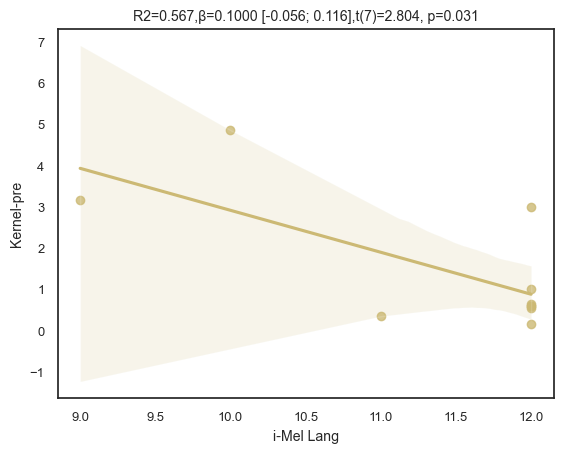

In [378]:
# Set the color palette
color = sns.color_palette()[8]

# Create the regression plot
sns.regplot(x='ProLing', y='internal_noise_with_criteria', data=data[(data.type=='pre')&(data.hemisphere=='Left')], color=color)

# Set plot labels and title
plt.xlabel('i-Mel Lang')
plt.ylabel('Kernel-pre')
plt.title('R2=0.567,β=0.1000 [-0.056; 0.116],t(7)=2.804, p=0.031')

# Show the plot
plt.show()

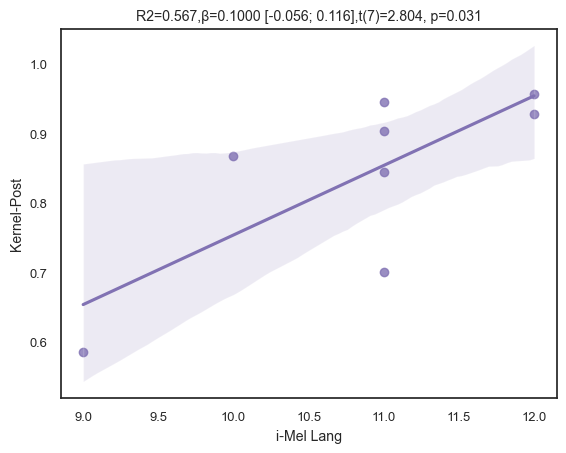

In [345]:
# Set the color palette
color = sns.color_palette()[4]

# Create the regression plot
sns.regplot(x='ProLing', y='kernel_typicality', data=data[(data.type=='post')&(data.hemisphere=='Right')], color=color)

# Set plot labels and title
plt.xlabel('i-Mel Lang')
plt.ylabel('Kernel-Post')
plt.title('R2=0.567,β=0.1000 [-0.056; 0.116],t(7)=2.804, p=0.031')

# Show the plot
plt.show()

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.495
Method:                 Least Squares   F-statistic:                     7.864
Date:                Wed, 15 May 2024   Prob (F-statistic):             0.0310
Time:                        12:48:51   Log-Likelihood:                 8.7543
No. Observations:                   8   AIC:                            -13.51
Df Residuals:                       6   BIC:                            -13.35
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

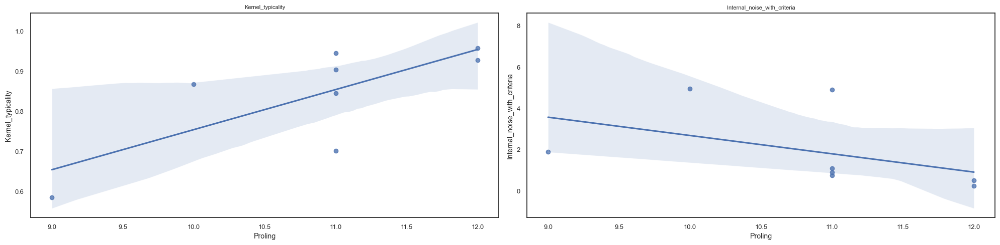

In [284]:
display_regressions(data[(data.type=='post')&(data.hemisphere=='Right')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.567
Model:                            OLS   Adj. R-squared:                  0.495
Method:                 Least Squares   F-statistic:                     7.864
Date:                Wed, 15 May 2024   Prob (F-statistic):             0.0310
Time:                        11:22:12   Log-Likelihood:                 8.7543
No. Observations:                   8   AIC:                            -13.51
Df Residuals:                       6   BIC:                            -13.35
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

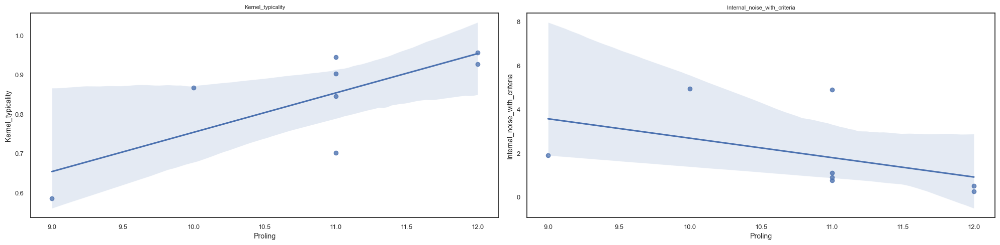

In [236]:
display_regressions(data[(data.hemisphere=='Right')&(data.type=='post')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING + TYPE - 1
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.043
Method:                 Least Squares   F-statistic:                    0.2519
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.779
Time:                        01:21:36   Log-Likelihood:                0.38319
No. Observations:                  37   AIC:                             5.234
Df Residuals:                      34   BIC:                             10.07
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

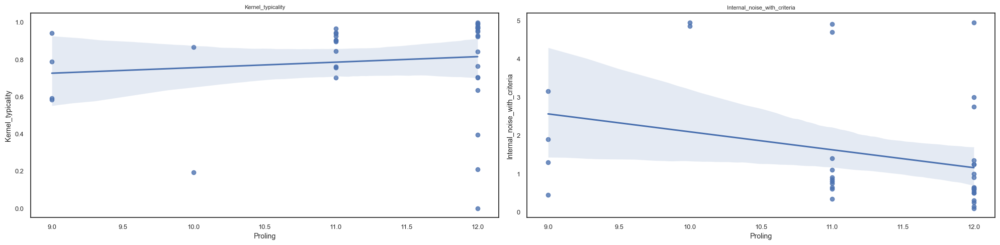

In [192]:
display_regressions(data, predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'], controls=['type'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.187
Model:                            OLS   Adj. R-squared:                  0.085
Method:                 Least Squares   F-statistic:                     1.836
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.212
Time:                        01:32:09   Log-Likelihood:                 1.4007
No. Observations:                  10   AIC:                             1.199
Df Residuals:                       8   BIC:                             1.804
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

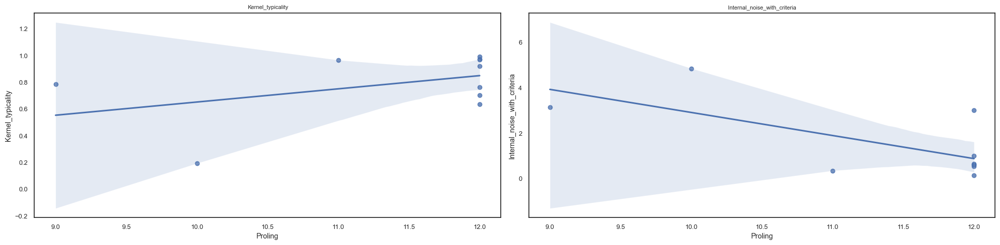

In [201]:
display_regressions(data[(data.hemisphere=='Left')&(data.type=='pre')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.119
Model:                            OLS   Adj. R-squared:                 -0.027
Method:                 Least Squares   F-statistic:                    0.8130
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.402
Time:                        01:46:38   Log-Likelihood:               -0.51082
No. Observations:                   8   AIC:                             5.022
Df Residuals:                       6   BIC:                             5.181
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

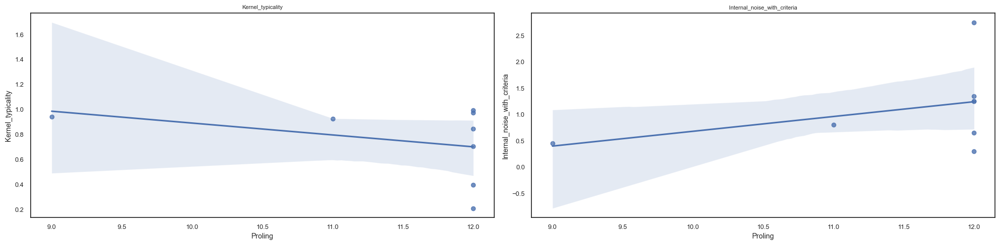

In [231]:
display_regressions(data[(data.hemisphere=='Left')&(data.type=='post')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.133
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.074
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.335
Time:                        01:30:10   Log-Likelihood:                 5.6232
No. Observations:                   9   AIC:                            -7.246
Df Residuals:                       7   BIC:                            -6.852
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

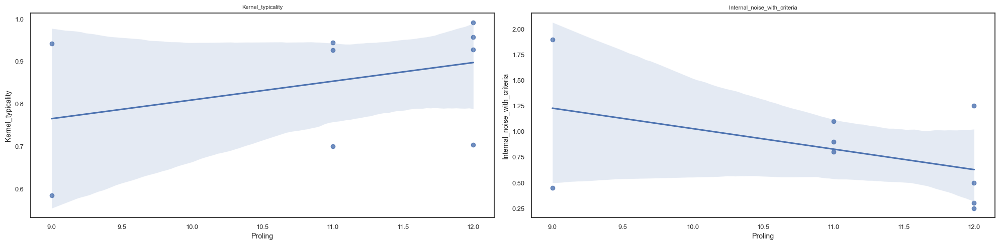

In [197]:
display_regressions(data[(data.lateralization=='Frontal')&(data.type=='post')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                 -0.061
Method:                 Least Squares   F-statistic:                    0.7710
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.445
Time:                        01:30:43   Log-Likelihood:               -0.86717
No. Observations:                   5   AIC:                             5.734
Df Residuals:                       3   BIC:                             4.953
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

g:\utilisateurs\aynaz.adlzarrabi\appdata\local\programs\python\python38\lib\site-packages\statsmodels\stats\stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "
g:\utilisateurs\aynaz.adlzarrabi\appdata\local\programs\python\python38\lib\site-packages\statsmodels\stats\stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


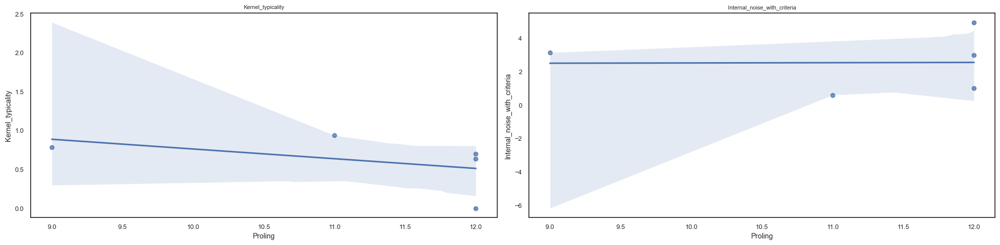

In [198]:
display_regressions(data[(data.lateralization=='Temporal')&(data.type=='pre')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.384
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     1.873
Date:                Wed, 15 May 2024   Prob (F-statistic):              0.265
Time:                        01:31:07   Log-Likelihood:                0.55839
No. Observations:                   5   AIC:                             2.883
Df Residuals:                       3   BIC:                             2.102
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

g:\utilisateurs\aynaz.adlzarrabi\appdata\local\programs\python\python38\lib\site-packages\statsmodels\stats\stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "
g:\utilisateurs\aynaz.adlzarrabi\appdata\local\programs\python\python38\lib\site-packages\statsmodels\stats\stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 5 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


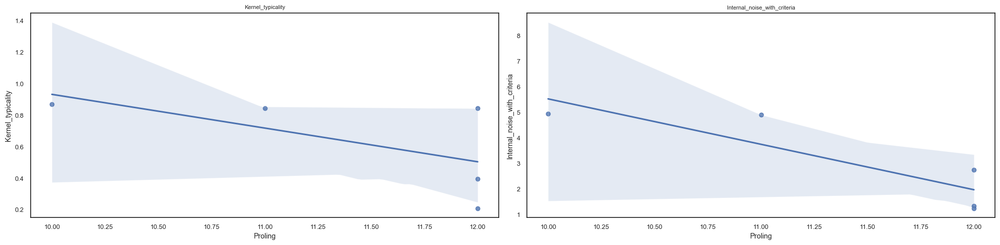

In [199]:
display_regressions(data[(data.lateralization=='Temporal')&(data.type=='post')], predictor='ProLing', outcomes = ['kernel_typicality','internal_noise_with_criteria'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


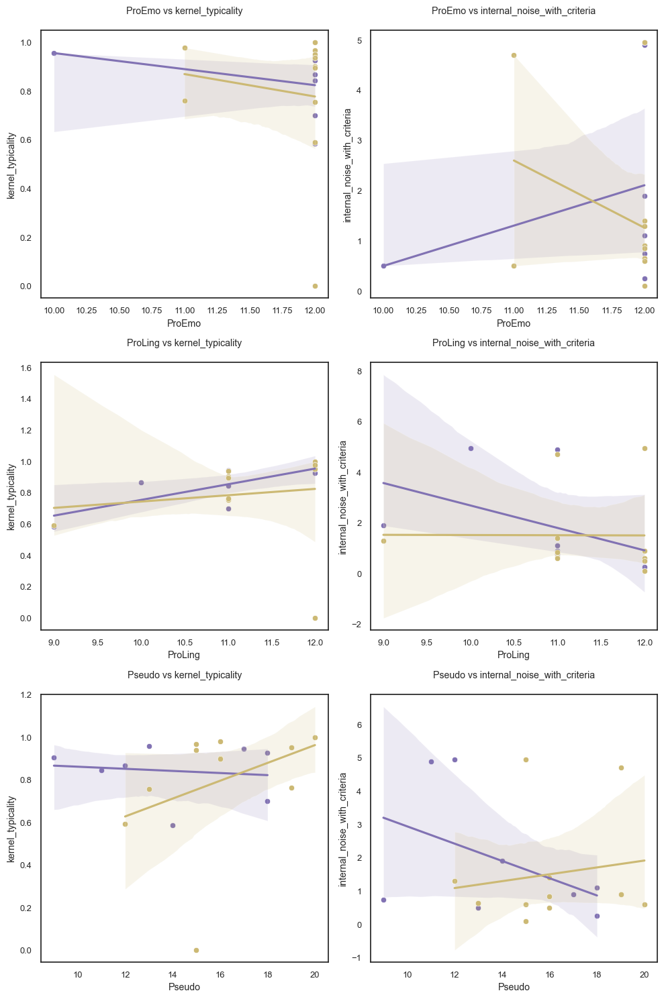

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = -0.58, p = 0.134
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = -0.15, p = 0.662
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = 0.41, p = 0.310
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = 0.00, p = 1.000
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = 0.73, p = 0.041
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = 0.57, p = 0.065
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = -0.82, p = 0.013
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = -0.34, p = 0.3

In [169]:
display_multiple_spearman_correlation(data[data.hemisphere=='Right'], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


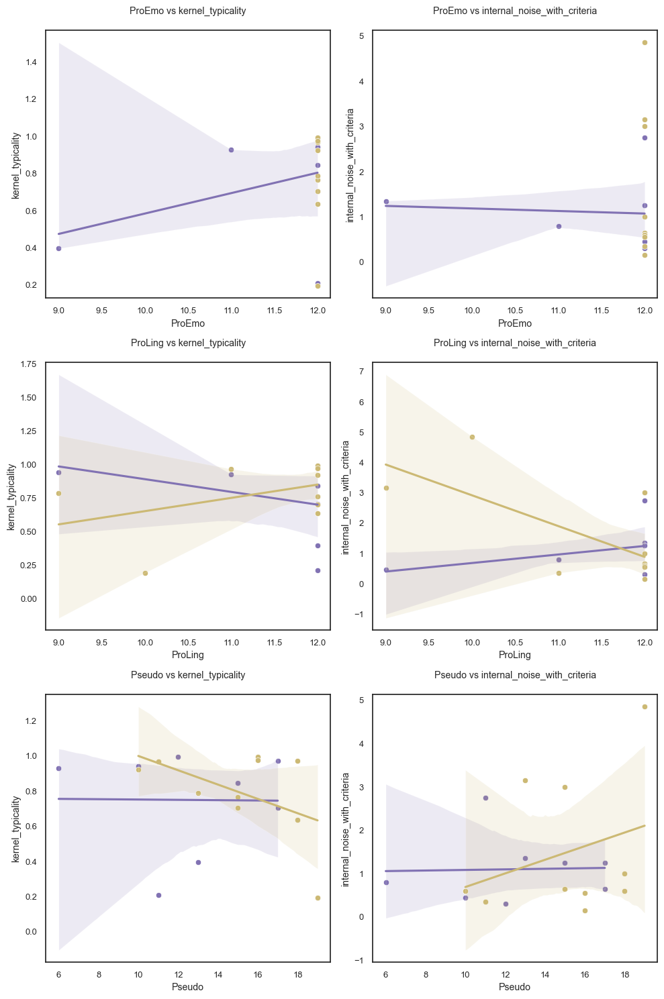

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = 0.30, p = 0.476
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = -0.30, p = 0.474
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = -0.26, p = 0.526
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = 0.29, p = 0.415
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = 0.41, p = 0.316
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = -0.44, p = 0.202
----

In [170]:
display_multiple_spearman_correlation(data[data.hemisphere=='Left'], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


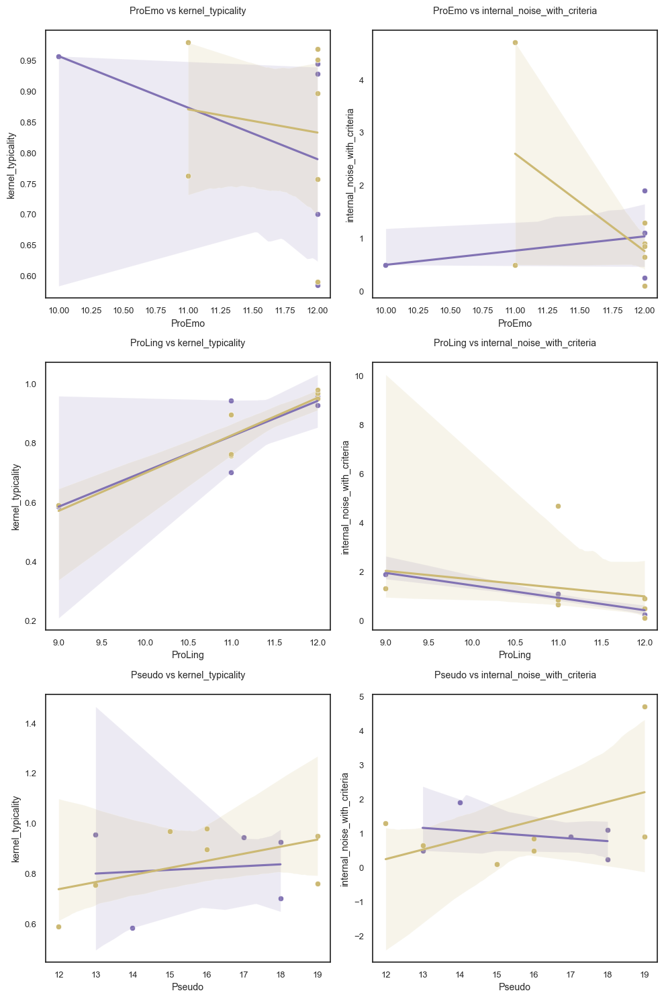

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = -0.71, p = 0.182
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = -0.32, p = 0.490
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = 0.35, p = 0.559
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = -0.16, p = 0.735
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = 0.74, p = 0.155
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = 0.93, p = 0.003
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = -0.95, p = 0.014
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = -0.62, p = 0.

In [171]:
display_multiple_spearman_correlation(data[(data.hemisphere=='Right')&(data.lateralization=='Frontal')], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


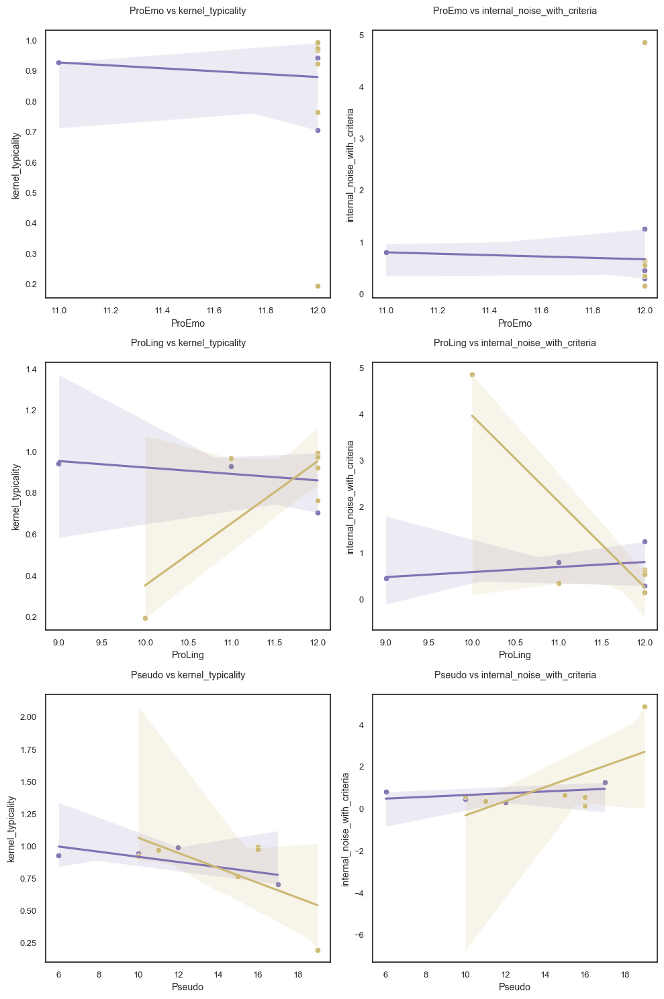

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = 0.26, p = 0.742
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = -0.26, p = 0.742
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = -0.11, p = 0.895
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = 0.51, p = 0.305
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = 0.11, p = 0.895
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = -0.34, p = 0.512
----

In [172]:
display_multiple_spearman_correlation(data[(data.hemisphere=='Left')&(data.lateralization=='Frontal')], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

In [125]:
data[['type','hemisphere','lateralization']]

,type,hemisphere,lateralization
14,post,Right,Insular
15,post,Right,Temporal
16,post,Left,Frontal
17,post,Left,Frontal
18,post,Right,Frontal
19,post,Left,Temporal
20,post,Right,Frontal
21,post,Right,Frontal
22,post,Left,Parietal
23,post,Left,Frontal


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


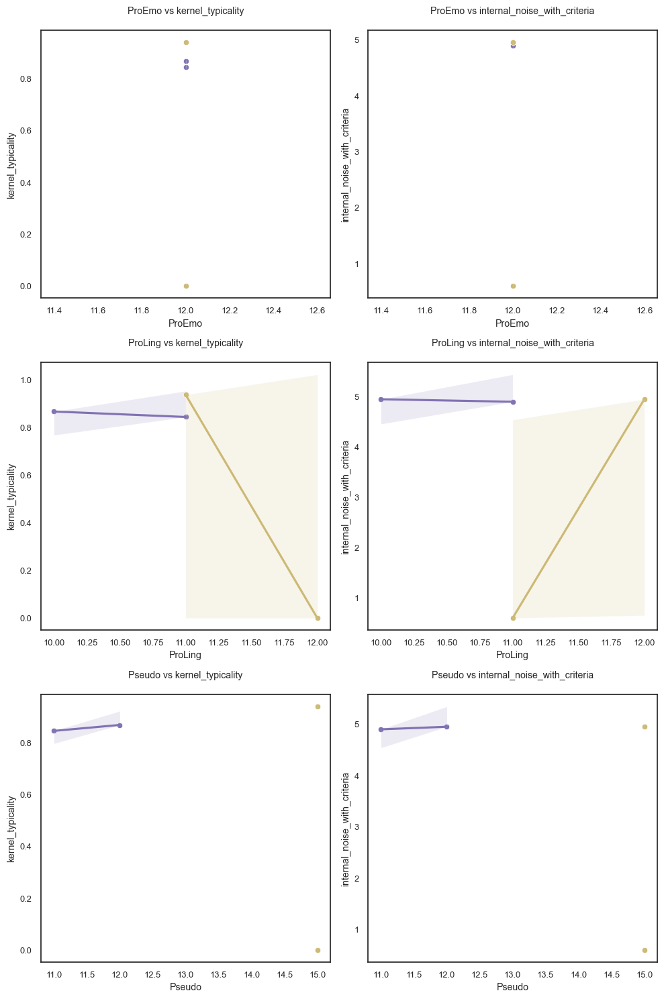

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = -1.00, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = -1.00, p = nan
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = -1.00, p = nan
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = 1.00, p = nan
------------------

In [173]:
display_multiple_spearman_correlation(data[(data.hemisphere=='Right')&(data.lateralization=='Temporal')], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


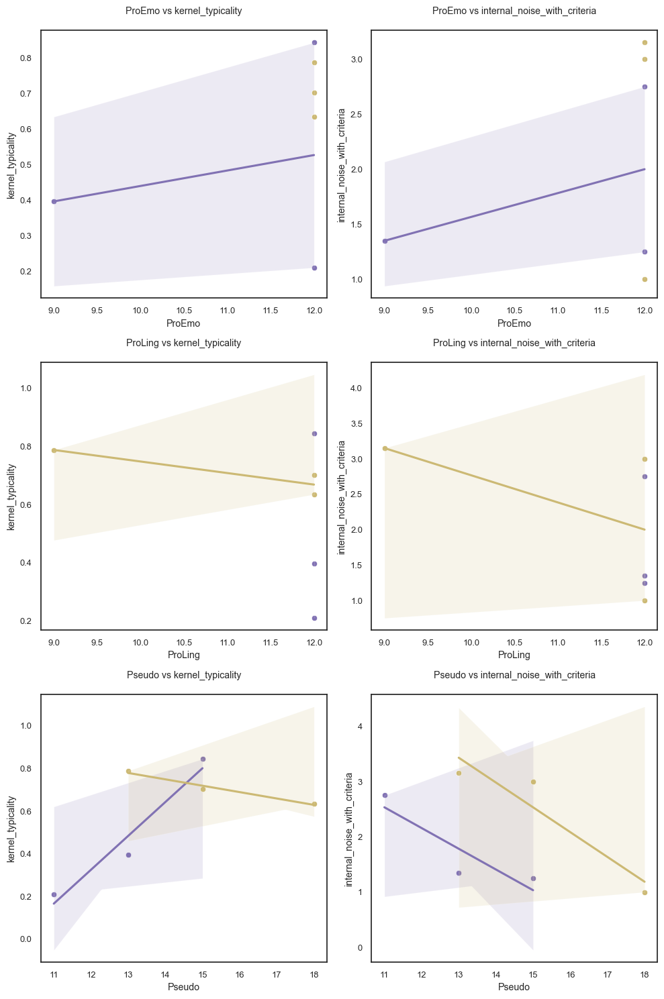

Spearman rank correlation for ProEmo and kernel_typicality (post):
r = 0.00, p = 1.000
------------------------------------
Spearman rank correlation for ProEmo and kernel_typicality (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (post):
r = 0.00, p = 1.000
------------------------------------
Spearman rank correlation for ProEmo and internal_noise_with_criteria (pre):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (post):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and kernel_typicality (pre):
r = -0.87, p = 0.333
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (post):
r = nan, p = nan
------------------------------------
Spearman rank correlation for ProLing and internal_noise_with_criteria (pre):
r = -0.87, p = 0.333
-----------

In [175]:
display_multiple_spearman_correlation(data[(data.hemisphere=='Left')&(data.lateralization=='Temporal')], 'type', ['ProEmo', 'ProLing', 'Pseudo'], ['kernel_typicality', 'internal_noise_with_criteria'], my_palette)

KERNEL_TYPICALITY ~ PROLING

Normality Test of Residuals for kernel_typicality
------------------------------------
p-value for normality: AD 0.0000 KS 0.0010

Homoscedasticity Test of Residuals for kernel_typicality
------------------------------------
p-value for homoscedasticity: 0.5326
INTERNAL_NOISE_WITH_CRITERIA ~ PROLING

Normality Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for normality: AD 0.0000 KS 0.0010

Homoscedasticity Test of Residuals for internal_noise_with_criteria
------------------------------------
p-value for homoscedasticity: 0.2528


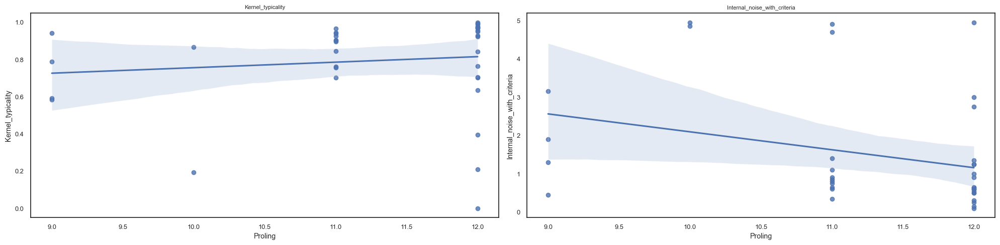

In [71]:
display_regressions_assumptions(data, predictor='ProLing', outcomes = ['kernel_typicality',
                                                                           'internal_noise_with_criteria'])

------------------------------------
KERNEL_TYPICALITY ~ PROLING
                            OLS Regression Results                            
Dep. Variable:      kernel_typicality   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                 -0.014
Method:                 Least Squares   F-statistic:                    0.5128
Date:                Tue, 14 May 2024   Prob (F-statistic):              0.479
Time:                        16:38:20   Log-Likelihood:                0.38018
No. Observations:                  37   AIC:                             3.240
Df Residuals:                      35   BIC:                             6.461
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------

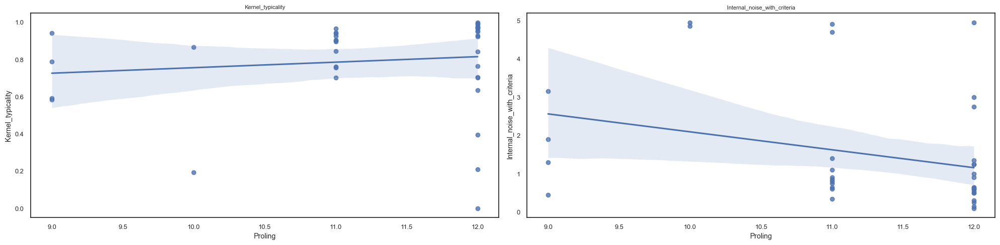

In [72]:
display_regressions(data, predictor='ProLing', outcomes = ['kernel_typicality',
                                                                           'internal_noise_with_criteria'])

In [59]:
grouped_corr=revcor_measures[revcor_measures.type.isin(['pre','post'])].groupby(['type'])[['kernel_typicality','internal_noise_with_criteria', 'ProEmo','ProLing', 'Pseudo']].corr()
grouped_corr

kernel_typicality  \
type                                                   
post kernel_typicality                      1.000000   
     internal_noise_with_criteria          -0.284218   
     ProEmo                                 0.247783   
     ProLing                               -0.086281   
     Pseudo                                 0.002411   
pre  kernel_typicality                      1.000000   
     internal_noise_with_criteria          -0.788149   
     ProEmo                                -0.097688   
     ProLing                                0.265748   
     Pseudo                                -0.046816   

                                   internal_noise_with_criteria    ProEmo  \
type                                                                        
post kernel_typicality                                -0.284218  0.247783   
     internal_noise_with_criteria                      1.000000  0.161577   
     ProEmo                                            0.161577  1.000000   
     ProLing                                          -0.252607 -0.278827   
     Pseudo                                           -0.201076  0.190130   
pre  kernel_typicality                                -0.788149 -0.097688   
     internal_noise_with_criteria                      1.000000 -0.229254   
     ProEmo                                           -0.229254  1.000000   
     ProLing                                          -0.344249 -0.057354   
     Pseudo                                            0.221148 -0.236382   

                                    ProLing    Pseudo  
type                                                   
post kernel_typicality            -0.086281  0.002411  
     internal_noise_with_criteria -0.252607 -0.201076  
     ProEmo                       -0.278827  0.190130  
     ProLing                       1.000000  0.290935  
     Pseudo                        0.290935  1.000000  
pre  kernel_typicality             0.265748 -0.046816  
     internal_noise_with_criteria -0.344249  0.221148  
     ProEmo                       -0.057354 -0.236382  
     ProLing                       1.000000  0.286212  
     Pseudo                        0.286212  1.000000

In [60]:
grouped_corr=revcor_measures[revcor_measures.type.isin(['pre','post'])].groupby(['hemisphere','type'])[['kernel_typicality','internal_noise_with_criteria', 'ProEmo','ProLing', 'Pseudo']].corr()
grouped_corr

kernel_typicality  \
hemisphere type                                                   
Left       post kernel_typicality                      1.000000   
                internal_noise_with_criteria          -0.908292   
                ProEmo                                 0.399383   
                ProLing                               -0.345448   
                Pseudo                                -0.011635   
           pre  kernel_typicality                      1.000000   
                internal_noise_with_criteria          -0.841456   
                ProEmo                                      NaN   
                ProLing                                0.432015   
                Pseudo                                -0.495896   
Right      post kernel_typicality                      1.000000   
                internal_noise_with_criteria          -0.154687   
                ProEmo                                -0.354195   
                ProLing                                0.753139   
                Pseudo                                -0.126820   
           pre  kernel_typicality                      1.000000   
                internal_noise_with_criteria          -0.752141   
                ProEmo                                -0.127968   
                ProLing                                0.125417   
                Pseudo                                 0.358164   

                                              internal_noise_with_criteria  \
hemisphere type                                                              
Left       post kernel_typicality                                -0.908292   
                internal_noise_with_criteria                      1.000000   
                ProEmo                                           -0.077771   
                ProLing                                           0.388857   
                Pseudo                                            0.032117   
           pre  kernel_typicality                                -0.841456   
                internal_noise_with_criteria                      1.000000   
                ProEmo                                                 NaN   
                ProLing                                          -0.685261   
                Pseudo                                            0.295720   
Right      post kernel_typicality                                -0.154687   
                internal_noise_with_criteria                      1.000000   
                ProEmo                                            0.295130   
                ProLing                                          -0.456250   
                Pseudo                                           -0.455437   
           pre  kernel_typicality                                -0.752141   
                internal_noise_with_criteria                      1.000000   
                ProEmo                                           -0.322081   
                ProLing                                          -0.004184   
                Pseudo                                            0.152850   

                                                ProEmo   ProLing    Pseudo  
hemisphere type                                                             
Left       post kernel_typicality             0.399383 -0.345448 -0.011635  
                internal_noise_with_criteria -0.077771  0.388857  0.032117  
                ProEmo                        1.000000 -0.125000  0.196554  
                ProLing                      -0.125000  1.000000  0.518188  
                Pseudo                        0.196554  0.518188  1.000000  
           pre  kernel_typicality                  NaN  0.432015 -0.495896  
                internal_noise_with_criteria       NaN -0.685261  0.295720  
                ProEmo                             NaN       NaN       NaN  
                ProLing                            NaN  1.000000  0.089636  
       

In [61]:
grouped_corr = revcor_measures[(revcor_measures.type.isin(['pre','post']))&(revcor_measures.lateralization=='Frontal')].groupby(['hemisphere','type','lateralization'])[['kernel_typicality','internal_noise_with_criteria', 'ProEmo','ProLing', 'Pseudo']].corr()
grouped_corr

kernel_typicality  \
hemisphere type lateralization                                                   
Left       post Frontal        kernel_typicality                      1.000000   
                               internal_noise_with_criteria          -0.940356   
                               ProEmo                                -0.187076   
                               ProLing                               -0.345449   
                               Pseudo                                -0.713834   
           pre  Frontal        kernel_typicality                      1.000000   
                               internal_noise_with_criteria          -0.976718   
                               ProEmo                                      NaN   
                               ProLing                                0.812866   
                               Pseudo                                -0.634473   
Right      post Frontal        kernel_typicality                      1.000000   
                               internal_noise_with_criteria          -0.889511   
                               ProEmo                                -0.440847   
                               ProLing                                0.859531   
                               Pseudo                                 0.101402   
           pre  Frontal        kernel_typicality                      1.000000   
                               internal_noise_with_criteria          -0.404081   
                               ProEmo                                -0.126981   
                               ProLing                                0.938059   
                               Pseudo                                 0.523008   

                                                             internal_noise_with_criteria  \
hemisphere type lateralization                                                              
Left       post Frontal        kernel_typicality                                -0.940356   
                               internal_noise_with_criteria                      1.000000   
                               ProEmo                                           -0.157867   
                               ProLing                                           0.362795   
                               Pseudo                                            0.457364   
           pre  Frontal        kernel_typicality                                -0.976718   
                               internal_noise_with_criteria                      1.000000   
                               ProEmo                                                 NaN   
                               ProLing                                          -0.859050   
                               Pseudo                                            0.630919   
Right      post Frontal        kernel_typicality                                -0.889511   
                               internal_noise_with_criteria                      1.000000   
                               ProEmo                                            0.377950   
                               ProLing                                          -0.978892   
                               Pseudo                                           -0.284937   
           pre  Frontal        kernel_typicality                                -0.404081   
                               internal_noise_with_criteria                      1.000000   
                               ProEmo                                           -0.579072   
                               ProLing                                          -0.239889   
                               Pseudo                                            0.484317   

                                                                   ProEmo  \
hemisphere type lateralization                                              
Left       post Frontal        kernel_typicality       

In [62]:
grouped_corr = revcor_measures[(revcor_measures.type.isin(['pre','post']))&(revcor_measures.lateralization=='Frontal')].groupby(['hemisphere','type','lateralization','Grade'])[['kernel_typicality','internal_noise_with_criteria', 'ProEmo','ProLing', 'Pseudo']].corr()
grouped_corr

kernel_typicality  \
hemisphere type lateralization Grade                                                          
Left       post Frontal        2            kernel_typicality                           NaN   
                                            internal_noise_with_criteria                NaN   
                                            ProEmo                                      NaN   
                                            ProLing                                     NaN   
                                            Pseudo                                      NaN   
                               3            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -0.999858   
                                            ProEmo                                      NaN   
                                            ProLing                               -0.351658   
                                            Pseudo                                -0.902485   
           pre  Frontal        2            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -1.000000   
                                            ProEmo                                      NaN   
                                            ProLing                                     NaN   
                                            Pseudo                                 1.000000   
                               3            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -0.953793   
                                            ProEmo                                      NaN   
                                            ProLing                               -0.407889   
                                            Pseudo                                -0.227993   
Right      post Frontal        2            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -1.000000   
                                            ProEmo                                -1.000000   
                                            ProLing                                1.000000   
                                            Pseudo                                -1.000000   
                               3            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -1.000000   
                                            ProEmo                                      NaN   
                                            ProLing                                1.000000   
                                            Pseudo                                 1.000000   
                               4            kernel_typicality                           NaN   
                                            internal_noise_with_criteria                NaN   
                                            ProEmo                                      NaN   
                                            ProLing                                     NaN   
                                            Pseudo                                      NaN   
           pre  Frontal        2            kernel_typicality                      1.000000   
                                            internal_noise_with_criteria          -0.969096   
                                            ProEmo                                -0.663807   
                                            ProLing                                0.991409   
                                            Pseudo                                 0.979607   
                               3            kernel_typicality                      1

In [63]:
grouped_corr = revcor_measures[(revcor_measures.type.isin(['pre','post']))&(revcor_measures.lateralization=='Temporal')].groupby(['hemisphere','type','lateralization'])[['kernel_typicality','internal_noise_with_criteria', 'ProEmo','ProLing', 'Pseudo']].corr()
grouped_corr_cleaned

kernel_typicality  \
type                                                   
post internal_noise_with_criteria          -0.284218   
     ProEmo                                 0.247783   
     ProLing                               -0.086281   
     Pseudo                                 0.002411   
pre  kernel_typicality                      1.000000   
     internal_noise_with_criteria          -0.788149   
     ProEmo                                -0.097688   
     ProLing                                0.265748   
     Pseudo                                -0.046816   

                                   internal_noise_with_criteria    ProEmo  \
type                                                                        
post internal_noise_with_criteria                           NaN       NaN   
     ProEmo                                            0.161577       NaN   
     ProLing                                          -0.252607 -0.278827   
     Pseudo                                           -0.201076  0.190130   
pre  kernel_typicality                                -0.788149 -0.097688   
     internal_noise_with_criteria                      1.000000 -0.229254   
     ProEmo                                           -0.229254  1.000000   
     ProLing                                          -0.344249 -0.057354   
     Pseudo                                            0.221148 -0.236382   

                                    ProLing    Pseudo  
type                                                   
post internal_noise_with_criteria       NaN       NaN  
     ProEmo                             NaN       NaN  
     ProLing                            NaN       NaN  
     Pseudo                        0.290935       NaN  
pre  kernel_typicality             0.265748 -0.046816  
     internal_noise_with_criteria -0.344249  0.221148  
     ProEmo                       -0.057354 -0.236382  
     ProLing                       1.000000  0.286212  
     Pseudo                        0.286212  1.000000

## Analysis for superset of localization

In [80]:
revcor_measures.groupby(['hemisphere','lateralization','type']).agg({'subject':'count',
                                                                'kernel_typicality':['mean','std',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))],
                                                                'internal_noise_with_criteria':['mean','std','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_typicality            \
                                     count              mean       std   
hemisphere lateralization type                                           
D          Frontal        post           5          0.823067  0.169616   
                          pre            7          0.843561  0.144965   
           Insulaire      post           1          0.903254       NaN   
                          pre            1          0.902697       NaN   
           Pariétal       pre            1          1.000000       NaN   
           Temporal       post           2          0.856449  0.016182   
                          pre            2          0.469230  0.663592   
G          Frontal        post           4          0.891299  0.127519   
                          pre            6          0.802069  0.309536   
           Pariétal       post           1          0.971368       NaN   
                          pre            1          0.969396       NaN   
           Temporal       post           3          0.482834  0.326010   
                          pre            3          0.708107  0.076595   
controls   controls       controls      21          0.906971  0.137763   

                                                                  \
                                      median        Q1        Q3   
hemisphere lateralization type                                     
D          Frontal        post      0.927716  0.701087  0.944543   
                          pre       0.896726  0.759468  0.959649   
           Insulaire      post      0.903254  0.903254  0.903254   
                          pre       0.902697  0.902697  0.902697   
           Pariétal       pre       1.000000  1.000000  1.000000   
           Temporal       post      0.856449  0.850728  0.862171   
                          pre       0.469230  0.234615  0.703846   
G          Frontal        post      0.934376  0.871462  0.954213   
                          pre       0.944331  0.803372  0.972119   
           Pariétal       post      0.971368  0.971368  0.971368   
                          pre       0.969396  0.969396  0.969396   
           Temporal       post      0.395767  0.302482  0.619653   
                          pre       0.702173  0.668413  0.744835   
controls   controls       controls  0.939521  0.915212  0.970918   

                                   internal_noise_with_criteria            \
                                                           mean       std   
hemisphere lateralization type                                              
D          Frontal        post                         0.930000  0.636003   
                          pre                          1.285714  1.550461   
           Insulaire      post                         0.750000       NaN   
                          pre                          1.400000       NaN   
           Pariétal       pre                          0.600000       NaN   
           Temporal       post                         4.925000  0.035355   
                          pre                          2.775000  3.075914   
G          Frontal        post                         0.700000  0.422295   
                          pre                          1.191667  1.801782   
           Pariétal       post                         0.650000       NaN   
                          pre                          0.600000       NaN   
           Temporal       post                         1.783333  0.838650   
                          pre                          2.383333  1.200347   
controls   controls       controls                     0.692857  0.371243   

                                                                 
                                     max median      Q1      Q3  
hemisphere lateralization type                                   
D          Frontal        post      1.90  0.900  0.5000  1.1000  
                          pre       4.70  0.8

In [81]:
revcor_measures[revcor_measures.lateralization.isin(['Frontal','Temporal','controls'])].groupby(['hemisphere','lateralization','type']).agg({'subject':'count',
                                                                'kernel_typicality':['mean','std',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))],
                                                                'internal_noise_with_criteria':['mean','std','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_typicality            \
                                     count              mean       std   
hemisphere lateralization type                                           
D          Frontal        post           5          0.823067  0.169616   
                          pre            7          0.843561  0.144965   
           Temporal       post           2          0.856449  0.016182   
                          pre            2          0.469230  0.663592   
G          Frontal        post           4          0.891299  0.127519   
                          pre            6          0.802069  0.309536   
           Temporal       post           3          0.482834  0.326010   
                          pre            3          0.708107  0.076595   
controls   controls       controls      21          0.906971  0.137763   

                                                                  \
                                      median        Q1        Q3   
hemisphere lateralization type                                     
D          Frontal        post      0.927716  0.701087  0.944543   
                          pre       0.896726  0.759468  0.959649   
           Temporal       post      0.856449  0.850728  0.862171   
                          pre       0.469230  0.234615  0.703846   
G          Frontal        post      0.934376  0.871462  0.954213   
                          pre       0.944331  0.803372  0.972119   
           Temporal       post      0.395767  0.302482  0.619653   
                          pre       0.702173  0.668413  0.744835   
controls   controls       controls  0.939521  0.915212  0.970918   

                                   internal_noise_with_criteria            \
                                                           mean       std   
hemisphere lateralization type                                              
D          Frontal        post                         0.930000  0.636003   
                          pre                          1.285714  1.550461   
           Temporal       post                         4.925000  0.035355   
                          pre                          2.775000  3.075914   
G          Frontal        post                         0.700000  0.422295   
                          pre                          1.191667  1.801782   
           Temporal       post                         1.783333  0.838650   
                          pre                          2.383333  1.200347   
controls   controls       controls                     0.692857  0.371243   

                                                                 
                                     max median      Q1      Q3  
hemisphere lateralization type                                   
D          Frontal        post      1.90  0.900  0.5000  1.1000  
                          pre       4.70  0.850  0.5750  1.1000  
           Temporal       post      4.95  4.925  4.9125  4.9375  
                          pre       4.95  2.775  1.6875  3.8625  
G          Frontal        post      1.25  0.625  0.4125  0.9125  
                          pre       4.85  0.575  0.4000  0.6375  
           Temporal       post      2.75  1.350  1.3000  2.0500  
                          pre       3.15  3.000  2.0000  3.0750  
controls   controls       controls  1.75  0.600  0.4000  0.8500

### Reverse correlation measures differentiate different localization of tumors from controls 

In [83]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right and left hemisphere) ")
else:
    print("No significant differences for internal representation found between any pairs.")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire         17.0  0.454545     21      1
1   controls   Temporal         91.0  0.009851     21      5
2   controls    Frontal        160.0  0.415023     21     13
3   controls   Pariétal          6.0  0.126482     21      2
4  Insulaire   Temporal          4.0  0.666667      1      5
5  Insulaire    Frontal          6.0  1.000000      1     13
6  Insulaire   Pariétal          0.0  0.666667      1      2
7   Temporal    Frontal         16.0  0.117180      5     13
8   Temporal   Pariétal          0.0  0.095238      5      2
9    Frontal   Pariétal          3.0  0.114286     13      2
Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right and left hemisphere) 


In [84]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery-controls (Right hemisphere and controls).")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire         17.0  0.454545     21      1
1   controls   Temporal         32.0  0.284585     21      2
2   controls    Frontal         95.0  0.272117     21      7
3   controls   Pariétal          0.0  0.090909     21      1
4  Insulaire   Temporal          1.0  1.000000      1      2
5  Insulaire    Frontal          4.0  1.000000      1      7
6  Insulaire   Pariétal          0.0  1.000000      1      1
7   Temporal    Frontal          4.0  0.500000      2      7
8   Temporal   Pariétal          0.0  0.666667      2      1
9    Frontal   Pariétal          0.0  0.250000      7      1
No significant differences for internal representation found between any pairs for pre surgery-controls (Right hemisphere and controls).


In [85]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (left hemisphere and controls)")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery-controls (left hemisphere and controls).")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         65.0  0.932137     21      6
1  controls  Temporal         59.0  0.010870     21      3
2  controls  Pariétal          6.0  0.636364     21      1
3   Frontal  Temporal         14.0  0.261905      6      3
4   Frontal  Pariétal          2.0  0.857143      6      1
5  Temporal  Pariétal          0.0  0.500000      3      1
Found significant differences between some pairs for kernel typicality between pre surgery-controls (left hemisphere and controls)


In [86]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (Right and left hemisphere)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (Right and left hemisphere)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          1.0  0.155080     21      1
1   controls   Temporal         14.0  0.013251     21      5
2   controls    Frontal        123.5  0.657190     21     13
3   controls   Pariétal         20.0  0.956310     21      2
4  Insulaire   Temporal          2.0  1.000000      1      5
5  Insulaire    Frontal         11.0  0.320530      1     13
6  Insulaire   Pariétal          2.0  0.479500      1      2
7   Temporal    Frontal         50.5  0.084202      5     13
8   Temporal   Pariétal          9.0  0.159512      5      2
9    Frontal   Pariétal         15.0  0.798022     13      2
Found significant differences between some pairs for internal noise between pre surgery-controls (Right and left hemisphere)


In [87]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (Right hemisphere and controls)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          1.0  0.155080     21      1
1   controls   Temporal         10.0  0.250651     21      2
2   controls    Frontal         53.5  0.299934     21      7
3   controls   Pariétal         10.0  1.000000     21      1
4  Insulaire   Temporal          1.0  1.000000      1      2
5  Insulaire    Frontal          6.0  0.500000      1      7
6  Insulaire   Pariétal          1.0  1.000000      1      1
7   Temporal    Frontal          9.0  0.666667      2      7
8   Temporal   Pariétal          1.5  1.000000      2      1
9    Frontal   Pariétal          5.0  0.750000      7      1
No significant differences for internal noise found between any pairs for pre surgery-controls (Right hemisphere and controls)


In [88]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['post','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between post surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for post surgery-controls (Right hemisphere and controls)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          6.5  0.580206     21      1
1   controls   Temporal          0.0  0.025015     21      2
2   controls    Frontal         41.5  0.493637     21      5
3  Insulaire   Temporal          0.0  0.666667      1      2
4  Insulaire    Frontal          2.0  1.000000      1      5
5   Temporal    Frontal         10.0  0.095238      2      5
Found significant differences between some pairs for internal noise between post surgery-controls (Right hemisphere and controls)


In [89]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (left hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (left hemisphere and controls)")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         70.0  0.703933     21      6
1  controls  Temporal          4.0  0.018232     21      3
2  controls  Pariétal         10.0  1.000000     21      1
3   Frontal  Temporal          3.0  0.166667      6      3
4   Frontal  Pariétal          2.5  1.000000      6      1
5  Temporal  Pariétal          3.0  0.500000      3      1
Found significant differences between some pairs for internal noise between pre surgery-controls (left hemisphere and controls)


### Reverse correlation measures differentiate right lateralized frontal tumors from controls 

In [93]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery frontal right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery frontal right hemisphere and controls.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         95.0  0.272117     21      7
No significant differences for internal representation found between any pairs for pre surgery frontal right hemisphere and controls.


In [94]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery temporal right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery temporal right hemisphere and controls.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         32.0  0.284585     21      2
No significant differences for internal representation found between any pairs for pre surgery temporal right hemisphere and controls.


In [95]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         70.0  0.278352     21      5
No significant differences for internal representation found between any pairs.


In [96]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery frontal right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery frontal right hemisphere and controls.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         53.5  0.299934     21      7
No significant differences for internal noise found between any pairs for pre surgery frontal right hemisphere and controls.


In [97]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery temporal right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery temporal right hemisphere and controls.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         10.0  0.250651     21      2
No significant differences for internal noise found between any pairs for pre surgery temporal right hemisphere and controls.


In [98]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         41.5  0.493637     21      5
No significant differences for internal representation found between any pairs.


### Reverse correlation measures differentiate right lateralized localization of tumors from controls 

In [99]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery right hemisphere and controls.")

     Group1 Group2  U-statistic  P-value  Size1  Size2
0  controls      D        144.0   0.2666     21     11
No significant differences for internal representation found between any pairs for pre surgery right hemisphere and controls.


In [100]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery left hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery left hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G        130.0  0.300522     21     10
No significant differences for internal representation found between any pairs for pre surgery left hemisphere and controls.


In [101]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','D'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery left and right hemisphere")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery left and right hemisphere.")

  Group1 Group2  U-statistic  P-value  Size1  Size2
0      D      G         55.0      1.0     11     10
No significant differences for internal representation found between any pairs for pre surgery left and right hemisphere.


In [102]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic  P-value  Size1  Size2
0  controls      D        125.0  0.04657     21      8
Found significant differences between some pairs for kernel typicality


In [103]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G        108.0  0.257353     21      8
No significant differences for internal representation found between any pairs.


In [104]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery right hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         74.5  0.107338     21     11
No significant differences for internal noise found between any pairs for pre surgery right hemisphere and controls.


In [105]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery left hemisphere and controls")
else:
    print("No significant differences for internal noise found for any pairs between pre surgery left hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G         84.0  0.385279     21     10
No significant differences for internal noise found for any pairs between pre surgery left hemisphere and controls.


In [106]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','D'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery left and right hemisphere")
else:
    print("No significant differences for internal noise found for any pairs between pre surgery left and right hemisphere.")

  Group1 Group2  U-statistic   P-value  Size1  Size2
0      D      G         60.5  0.723823     11     10
No significant differences for internal noise found for any pairs between pre surgery left and right hemisphere.


In [107]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise ")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic  P-value  Size1  Size2
0  controls      D         48.0  0.08274     21      8
No significant differences for internal noise found between any pairs.


In [108]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G         54.5  0.156029     21      8
No significant differences for internal noise found between any pairs.


### Figure 

In [109]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         74.5  0.107338     21     11
1  controls      G         84.0  0.385279     21     10
2         D      G         60.5  0.723823     11     10
No significant differences for internal noise found between any pairs.


In [323]:
revcor_measures.groupby(['type','hemisphere'])['internal_noise_with_criteria'].mean()

type      hemisphere
controls  controls      0.692857
post      Left          1.100000
          Right         1.906250
pre       Left          1.490000
          Right         1.504545
Name: internal_noise_with_criteria, dtype: float64

In [321]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls  Right         48.0  0.082740     21      8
1  controls   Left         54.5  0.156029     21      8
2     Right   Left         36.0  0.712989      8      8
No significant differences for internal representation found between any pairs.


In [324]:
from scipy.stats import ttest_ind
df = revcor_measures[revcor_measures.type.isin(['post', 'controls'])]

# Get unique hemisphere names
groups = df['hemisphere'].unique()

# Perform pairwise t-tests
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = ttest_ind(group1_data, group2_data, equal_var=False)  # Assuming unequal variances
        results.append({'Group1': groups[i], 'Group2': groups[j], 't-statistic': stat, 'P-value': pvalue,
                        'Size1': len(group1_data), 'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise with criteria")
else:
    print("No significant differences for internal noise with criteria found between any pairs.")

     Group1 Group2  t-statistic   P-value  Size1  Size2
0  controls  Right    -1.770093  0.118838     21      8
1  controls   Left    -1.427956  0.189997     21      8
2     Right   Left     1.099128  0.299639      8      8
No significant differences for internal noise with criteria found between any pairs.


In [110]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D        144.0  0.266600     21     11
1  controls      G        130.0  0.300522     21     10
2         D      G         55.0  1.000000     11     10
No significant differences for internal representation found between any pairs.


In [111]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D        125.0  0.046570     21      8
1  controls      G        108.0  0.257353     21      8
2         D      G         33.0  0.959130      8      8
Found significant differences between some pairs for internal representation


In [317]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls  Right         48.0  0.082740     21      8
1  controls   Left         54.5  0.156029     21      8
2     Right   Left         36.0  0.712989      8      8
No significant differences for internal representation found between any pairs.


In [271]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         10.0  0.250651     21      2
1  controls   Frontal         53.5  0.299934     21      7
2  Temporal   Frontal          9.0  0.666667      2      7
No significant differences for internal noise found between any pairs.


In [272]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal          0.0  0.025015     21      2
1  controls   Frontal         41.5  0.493637     21      5
2  Temporal   Frontal         10.0  0.095238      2      5
Found significant differences between some pairs for internal noise


In [273]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         32.0  0.284585     21      2
1  controls   Frontal         95.0  0.272117     21      7
2  Temporal   Frontal          4.0  0.500000      2      7
No significant differences for internal representation found between any pairs.


In [380]:
df=revcor_measures[revcor_measures.hemisphere.isin(['Left','controls'])]
df=df[df.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         43.0  0.971383     21      4
1  controls  Temporal         60.0  0.006917     21      3
2   Frontal  Temporal         11.0  0.114286      4      3
Found significant differences between some pairs for internal representation


In [275]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         70.0  0.703933     21      6
1  controls  Temporal          4.0  0.018232     21      3
2   Frontal  Temporal          3.0  0.166667      6      3
Found significant differences between some pairs for internal noise


In [276]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         43.0  0.970361     21      4
1  controls  Temporal          3.0  0.014289     21      3
2   Frontal  Temporal          0.5  0.074462      4      3
Found significant differences between some pairs for internal noise


In [277]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         65.0  0.932137     21      6
1  controls  Temporal         59.0  0.010870     21      3
2   Frontal  Temporal         14.0  0.261905      6      3
Found significant differences between some pairs for internal representation


In [318]:
df=revcor_measures[revcor_measures.hemisphere.isin(['Left','controls'])]
df=df[df.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         43.0  0.971383     21      4
1  controls  Temporal         60.0  0.006917     21      3
2   Frontal  Temporal         11.0  0.114286      4      3
Found significant differences between some pairs for internal representation


In [115]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         48.0  0.082740     21      8
1  controls      G         54.5  0.156029     21      8
2         D      G         36.0  0.712989      8      8
No significant differences for internal noise found between any pairs.


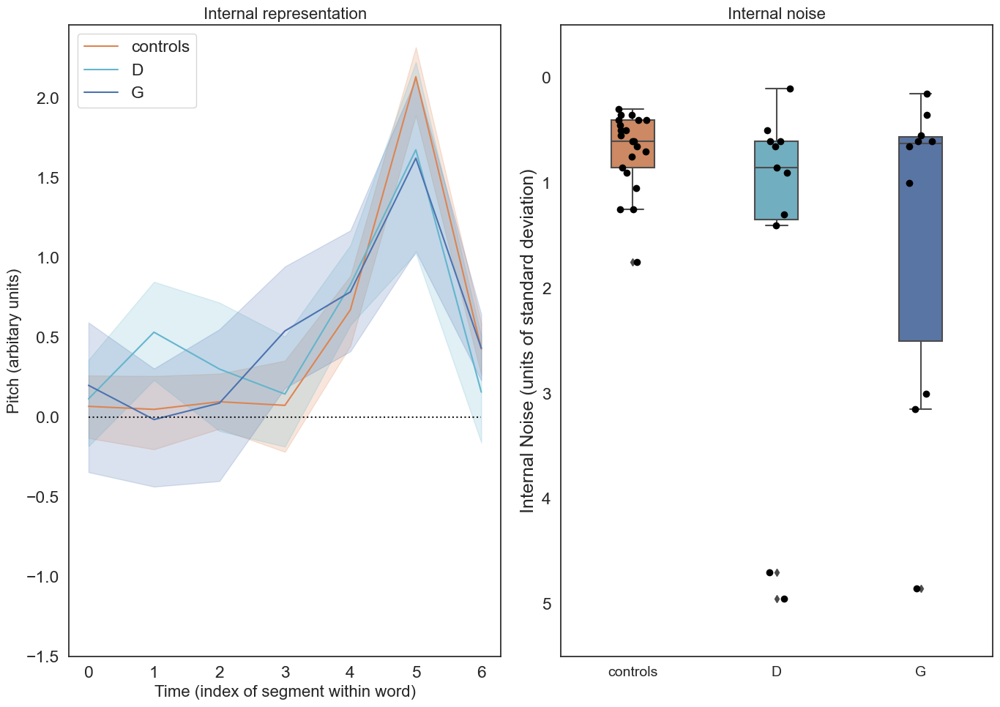

In [116]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[9], "G": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "D", "G"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="hemisphere",
             data=kernels[kernels.type.isin(['pre','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "D", "G"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
            x="hemisphere",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
              x="hemisphere",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


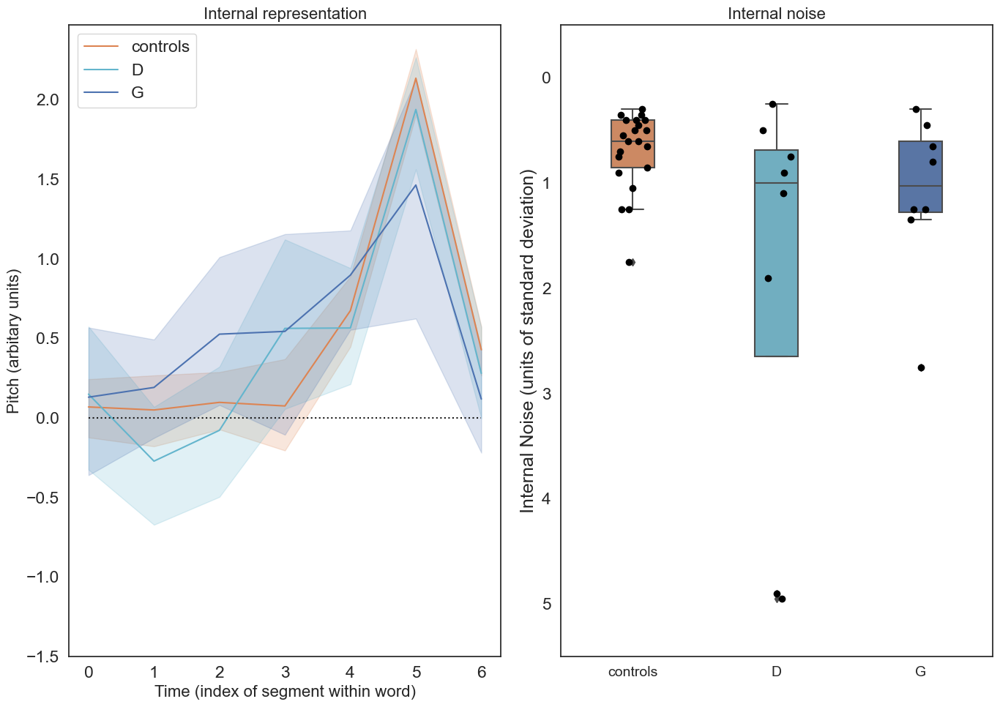

In [283]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[9], "G": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "D", "G"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="hemisphere",
             data=kernels[kernels.type.isin(['post','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "D", "G"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
            x="hemisphere",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
              x="hemisphere",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


In [119]:
kernels['lateralization'] = kernels['localization'].apply(classify_localization)

for name, group in kernels.groupby('hemisphere'):
    print(name, group['lateralization'].unique())

D ['Insulaire' 'Temporal' 'Frontal' 'Pariétal']
G ['Frontal' 'Temporal' 'Pariétal']
controls ['controls']


In [285]:
kernels_right=kernels[kernels.hemisphere.isin(['D','controls'])]
revcor_measures_right=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
kernels_left=kernels[kernels.hemisphere.isin(['G','controls'])]
revcor_measures_left=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]

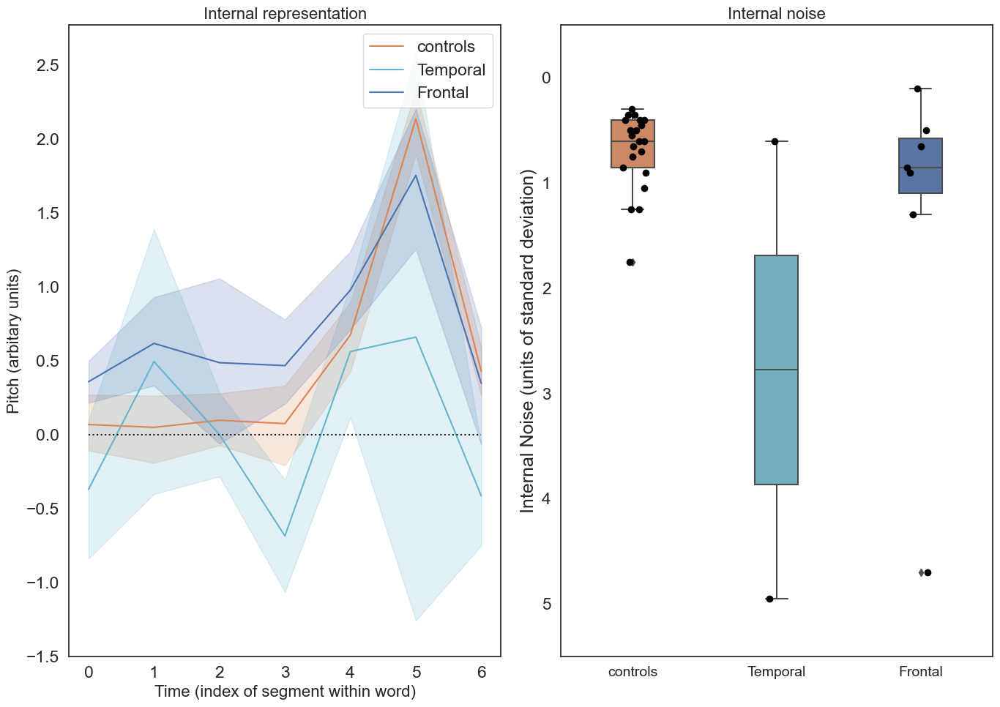

In [286]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels_right[kernels_right.type.isin(['pre','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures_right[revcor_measures_right.type.isin(['pre','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures_right[revcor_measures_right.type.isin(['pre','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


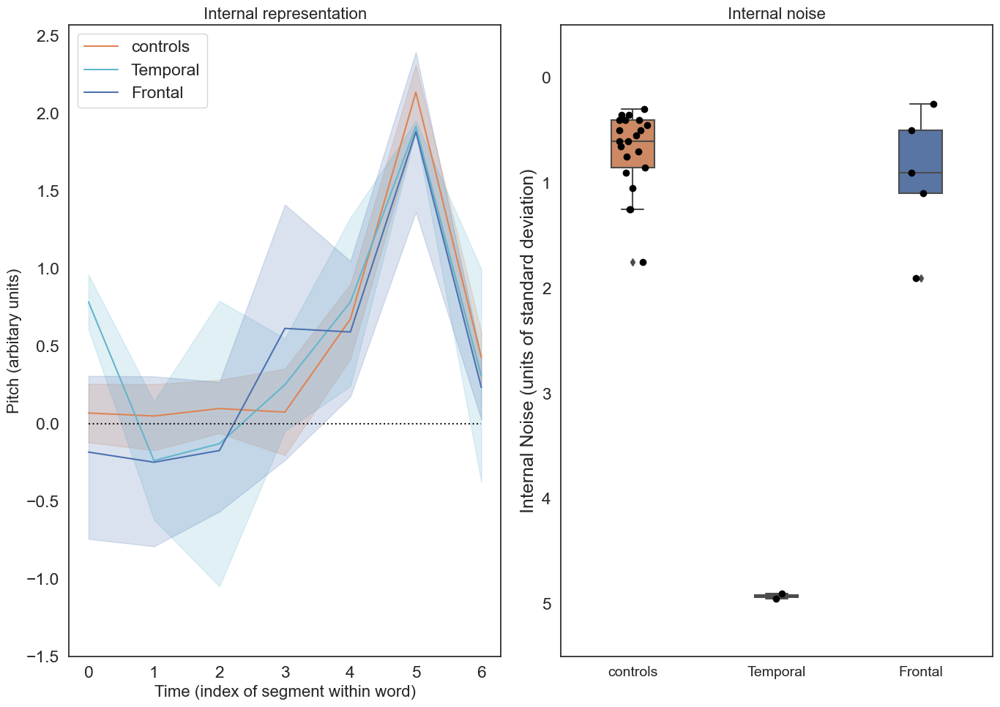

In [287]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels_right[kernels_right.type.isin(['post','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures_right[revcor_measures_right.type.isin(['post','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures_right[revcor_measures_right.type.isin(['post','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


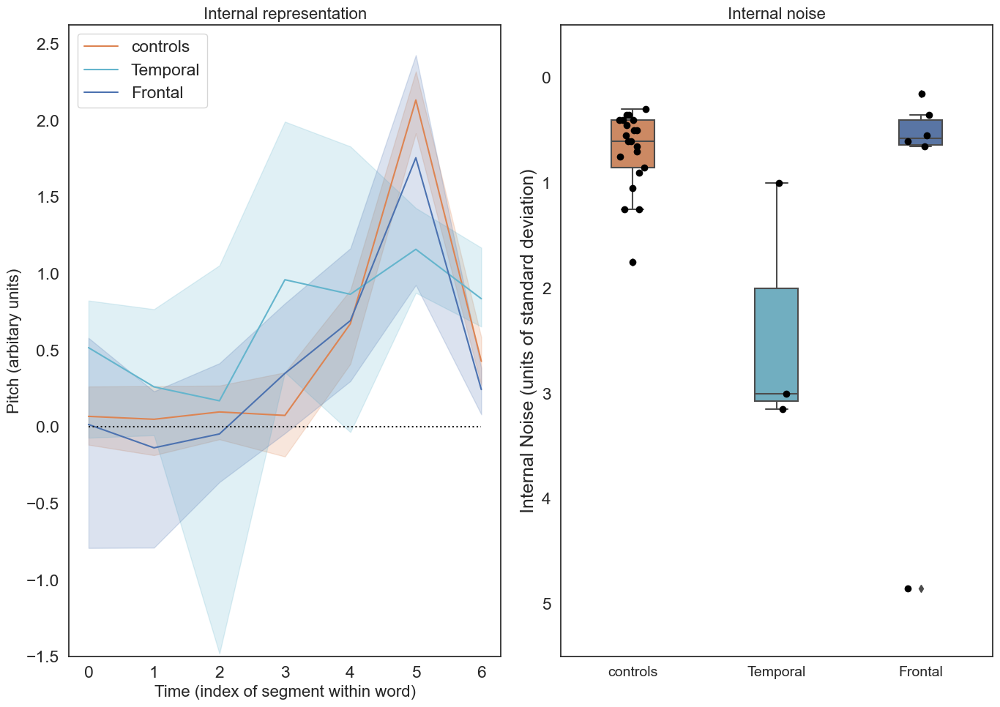

In [289]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels_left[kernels_left.type.isin(['pre','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures_left[revcor_measures_left.type.isin(['pre','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures_left[revcor_measures_left.type.isin(['pre','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


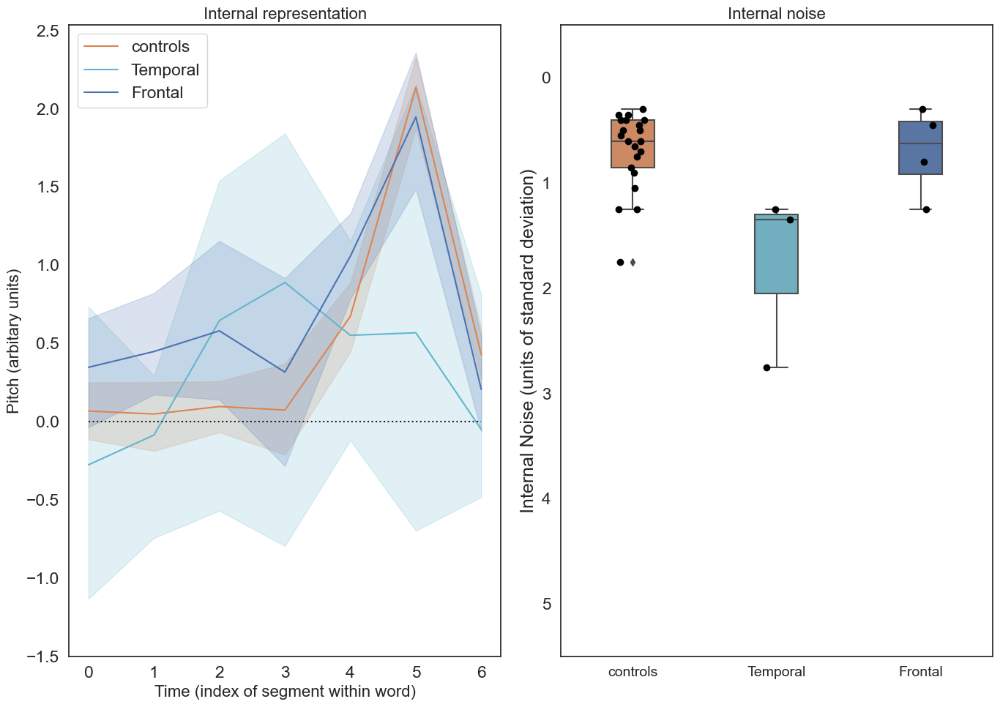

In [288]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels_left[kernels_left.type.isin(['post','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures_left[revcor_measures_left.type.isin(['post','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures_left[revcor_measures_left.type.isin(['post','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


In [164]:
df=revcor_measures[revcor_measures.type=='pre']
df=df[~df.subject.isin([4,9,12,18,20])]
types  = df['hemisphere'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['hemisphere'] == types[0]]['internal_noise_with_criteria'].values
    data2 = df[df['hemisphere'] == types[1]]['internal_noise_with_criteria'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for internal noise between right and left hemisphere: {stat}, P-value: {pvalue},Size1: {len(group1_data)}, Size2: {len(group2_data)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for internal noise between right and left hemisphere: 12.0, P-value: 0.4609375,Size1: 8, Size2: 8


In [163]:
df=revcor_measures[revcor_measures.type=='pre']
df=df[~df.subject.isin([4,9,12,18,20])]
types  = df['hemisphere'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['hemisphere'] == types[0]]['kernel_typicality'].values
    data2 = df[df['hemisphere'] == types[1]]['kernel_typicality'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for kernel typicality between right and left hemisphere: {stat}, P-value: {pvalue},Size1: {len(group1_data)}, Size2: {len(group2_data)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for kernel typicality between right and left hemisphere: 17.0, P-value: 0.9453125,Size1: 8, Size2: 8


### Participant's table

In [137]:
from tableone import TableOne

In [156]:
unique_revcor_data = merge_data.drop_duplicates(subset=['subject', 'experimentor','sex', 'age'], keep='first')
revcor_measures_updated = pd.merge(revcor_measures, unique_revcor_data[['subject','experimentor','sex', 'age']], on=['subject','experimentor'], how='right')

In [157]:
revcor_measures_updated.head(60)
unique_subjects_df = revcor_measures_updated.drop_duplicates(subset=['subject', 'experimentor','session','type'], keep='first').reset_index(drop=True)

In [158]:
revcor_measures_updated.groupby(['type']).sex.unique()

type
controls    [m, f]
post        [m, f]
pre         [m, f]
Name: sex, dtype: object

In [159]:
revcor_measures_updated.describe()

,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,accuracy,age
count,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,32.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,37.000000,58.000000,58.000000
mean,10.758621,1.275862,0.427280,0.834744,0.455061,0.722535,0.456897,1.207759,30.625000,11.351351,0.432432,11.783784,0.135135,11.270270,0.459459,14.594595,0.687160,47.103448
std,6.238844,0.450851,0.520051,0.217831,0.099358,0.124696,0.460306,1.293228,18.578083,0.919427,0.502247,0.629600,0.346583,0.990192,0.505228,3.244307,0.101804,12.844126
min,0.000000,1.000000,0.032747,-0.000000,0.160000,0.450980,0.000000,0.100000,3.000000,9.000000,0.000000,9.000000,0.000000,9.000000,0.000000,6.000000,0.467532,24.000000
25%,5.250000,1.000000,0.114305,0.769731,0.402500,0.630588,0.150000,0.500000,17.000000,11.000000,0.000000,12.000000,0.000000,11.000000,0.000000,12.000000,0.616883,37.000000
50%,11.000000,1.000000,0.206074,0.927399,0.455490,0.745098,0.350000,0.675000,30.500000,12.000000,0.000000,12.000000,0.000000,12.000000,0.000000,15.000000,0.697403,47.500000
75%,16.000000,2.000000,0.582493,0.965838,0.514706,0.803922,0.550000,1.250000,44.000000,12.000000,1.000000,12.000000,0.000000,12.000000,1.000000,17.000000,0.759935,53.000000
max,21.000000,2.000000,2.420154,1.000000,0.760000,0.960000,2.050000,4.950000,61.000000,12.000000,1.000000,12.000000,1.000000,12.000000,1.000000,20.000000,0.870130,82.000000


In [160]:
# Columns to set to NaN if type is 'controls'
columns_to_modify = ['Grade','Délai-postop' ,'Résultats-bruts-i-MEL ', 'Patho-sain','ProEmo', 'ProLing', 'Pseudo']


# Function to apply across the specified columns
def replace_controls(row):
    if 'controls' in row.values:
        return [np.nan] * len(row)
    else:
        return row

# Apply the function
revcor_measures_updated[columns_to_modify] = revcor_measures_updated[columns_to_modify].apply(replace_controls, axis=1)


In [161]:
revcor_measures_updated.columns

Index(['experimentor', 'type', 'subject', 'session', 'kernel_distance',
       'kernel_typicality', 'p_int1', 'pc_agree', 'criteria',
       'internal_noise_with_criteria', 'hemisphere', 'localization', 'Grade',
       'Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain', 'ProEmo',
       'ProEmo2', 'ProLing', 'ProLing2', 'Pseudo', 'accuracy',
       'lateralization', 'sex', 'age'],
      dtype='object')

In [162]:
columns=['sex','age','hemisphere', 'lateralization', 'Grade',
       'Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain','ProEmo', 'ProLing', 'Pseudo']
categorical = ['sex','hemisphere', 'lateralization','Grade']
groupby = ['type']
nonnormal = ['age','Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain','ProEmo', 'ProLing', 'Pseudo']
mytable = TableOne(revcor_measures_updated, columns=columns, nonnormal=nonnormal,categorical=categorical, groupby=groupby, pval=False)
mytable

Grouped by type                                                                        
                                                            Missing           Overall          controls              post               pre
n                                                                                  58                21                16                21
sex, n (%)                             f                          0         25 (43.1)          8 (38.1)          8 (50.0)          9 (42.9)
                                       m                                    33 (56.9)         13 (61.9)          8 (50.0)         12 (57.1)
age, median [Q1,Q3]                                               0  47.5 [37.0,53.0]  58.0 [52.0,64.0]  38.5 [34.8,47.5]  37.0 [35.0,47.0]
hemisphere, n (%)                      Left                      21         18 (48.6)                            8 (50.0)         10 (47.6)
                                       Right                                19 (51.4)                            8 (50.0)         11 (52.4)
lateralization, n (%)                  controls                   0         21 (36.2)        21 (100.0)                                    
                                       Frontal                              22 (37.9)                            9 (56.2)         13 (61.9)
                                       Insular                                2 (3.4)                             1 (6.2)           1 (4.8)
                                       Parietal                               3 (5.2)                             1 (6.2)           2 (9.5)
                                       Temporal                             10 (17.2)                            5 (31.2)          5 (23.8)
Grade, n (%)                           2                         22         18 (50.0)                            8 (50.0)         10 (50.0)
                                       3                                    15 (41.7)                            7 (43.8)          8 (40.0)
                                       4                                      2 (5.6)                             1 (6.2)           1 (5.0)
                                       Glioblastome                           1 (2.8)                                               1 (5.0)
Délai-postop, median [Q1,Q3]                                     26  30.5 [17.0,44.0]     nan [nan,nan]  30.5 [17.0,44.0]  30.5 [17.0,44.0]
Résultats-bruts-i-MEL , median [Q1,Q3]                           21  12.0 [11.0,12.0]     nan [nan,nan]  12.0 [11.0,12.0]  12.0 [11.0,12.0]
Patho-sain, median [Q1,Q3]                                       21     0.0 [0.0,1.0]     nan [nan,nan]     0.0 [0.0,1.0]     0.0 [0.0,1.0]
ProEmo, median [Q1,Q3]                                           21  12.0 [12.0,12.0]     nan [nan,nan]  12.0 [12.0,12.0]  12.0 [12.0,12.0]
ProLing, median [Q1,Q3]                                          21  12.0 [11.0,12.0]     nan [nan,nan]  11.5 [11.0,12.0]  12.0 [11.0,12.0]
Pseudo, median [Q1,Q3]                                           21  15.0 [12.0,17.0]     nan [nan,nan]  13.0 [11.0,17.0]  16.0 [15.0,18.0]

In [167]:
revcor_measures_patients=revcor_measures[revcor_measures.type.isin(['pre','post'])]
revcor_measures_patients

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralization
14,celia_aude,post,1.0,2.0,0.263718,0.903254,0.343137,0.745098,0.70,0.75,D,Insulaire,2,61.0,12.0,0.0,0.688312,Insulaire
15,celia_aude,post,2.0,2.0,0.402779,0.845007,0.441176,0.470588,0.90,4.90,D,Temporal,2,3.0,11.0,1.0,0.558442,Temporal
16,celia_aude,post,3.0,2.0,0.737988,0.704600,0.519608,0.627451,0.10,1.25,G,Frontal,3,11.0,12.0,0.0,0.616883,Frontal
17,celia_aude,post,5.0,2.0,0.206831,0.927083,0.372549,0.725490,0.60,0.80,G,Frontal,2,33.0,11.0,1.0,0.766234,Frontal
18,celia_aude,post,6.0,2.0,0.205318,0.927716,0.382353,0.901961,0.45,0.25,D,Fronto-temporal,4,28.0,12.0,0.0,0.753247,Frontal
19,celia_aude,post,7.0,2.0,1.475296,0.395767,0.578431,0.627451,0.50,1.35,G,Temporal,2,61.0,12.0,0.0,0.558442,Temporal
20,celia_aude,post,8.0,2.0,0.746373,0.701087,0.284314,0.705882,1.20,1.10,D,Frontal,3,52.0,11.0,1.0,0.590909,Frontal
21,celia_aude,post,10.0,2.0,0.135816,0.956828,0.411765,0.803922,0.35,0.50,D,Fronto-pariétal,2,28.0,12.0,0.0,0.746753,Frontal
22,celia_aude,post,11.0,2.0,0.101104,0.971368,0.441176,0.745098,0.25,0.65,G,Pariétal,2,43.0,12.0,0.0,0.798701,Pariétal
23,celia_aude,post,13.0,2.0,0.052219,0.991844,0.500000,0.862745,0.00,0.30,G,Frontal,3,5.0,12.0,0.0,0.863636,Frontal


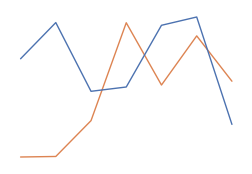

In [225]:
my_palette = {"pre": sns.color_palette()[0], "post": sns.color_palette()[1]}

kernels_patients=kernels[kernels.type.isin(['pre','post'])]
plt.figure(figsize=(3, 2))  
sns.set(font_scale=1.5)  
sns.lineplot(x="segment", 
                  y="kernel_value",
                  data=kernels_patients[kernels_patients.subject==21],hue='type',
                  ci=None,color='black',linewidth=1,palette=my_palette
 )
plt.title("")
plt.xlabel("")
plt.ylabel("")
plt.yticks([])
plt.xticks([])
sns.despine(left=True, bottom=True)
plt.gca().set_facecolor('white')
plt.legend().remove()
plt.grid(False)
plt.show()

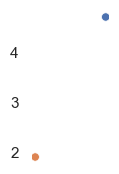

In [224]:
my_palette = {"pre": sns.color_palette()[0], "post": sns.color_palette()[1]}
plt.figure(figsize=(1, 2))  
sns.set(font_scale=1)  

sns.scatterplot(data=revcor_measures_patients[revcor_measures_patients.subject==21],
                x="type", y="internal_noise_with_criteria",hue='type',linewidth=0.5,palette=my_palette)
plt.title("")
plt.xlabel("")
plt.ylabel("")
plt.yticks(visible=True)
plt.xticks([])
sns.despine(left=True, bottom=True)
plt.gca().set_facecolor('white')
plt.legend().remove()
plt.grid(False)
plt.show()

In [ ]:
sns.scatterplot(data=revcor_measures_patients[revcor_measures_patients.subject==21],
                x="type", y="internal_noise_with_criteria",hue='type',linewidth=0.5,palette=my_palette)
plt.title("")
plt.xlabel("")
plt.ylabel("")
plt.yticks(visible=True)
plt.xticks([])
sns.despine(left=True, bottom=True)
plt.gca().set_facecolor('white')
plt.legend().remove()
plt.grid(False)

## without Glioblastoma patient

In [6]:
directory = r'G:\Utilisateurs\aynaz.adlzarrabi\Documents\WORK\DO\2022\gliome\experiment\data'

# List all CSV files that start with 'results_subj'
file_list = [os.path.join(directory, filename) 
             for filename in os.listdir(directory) 
             if filename.startswith('results_subj') and filename.endswith('.csv')]

# Create an empty list to store the DataFrames
dataframes = []

# Read each CSV file into a DataFrame and append it to the list
for file in file_list:
    df = pd.read_csv(file, sep=';')  # Assuming the separator is semicolon based on your previous file
    dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
combined_dataframe = pd.concat(dataframes, ignore_index=True)
combined_dataframe=combined_dataframe[combined_dataframe.subj!=9]
# Now, you have a single DataFrame, "combined_dataframe," that contains data from all 5 CSV files.


In [7]:
combined_dataframe

,subj,session,trial,block,sex,age,date,stim,stim_order,filter,filter_freq,filter_gain,response,rt
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,0.000000,9.896041,False,9.447
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,0.071043,101.528400,False,9.447
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,0.142086,-68.097850,False,9.447
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,0.213129,-142.658303,False,9.447
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,0.284172,-120.248224,False,9.447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77611,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,2.0,0.142086,-18.773488,True,0.930
77612,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,3.0,0.213129,73.054230,True,0.930
77613,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,4.0,0.284172,-72.824646,True,0.930
77614,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,5.0,0.355215,140.895697,True,0.930


In [8]:
for name, group in combined_dataframe.groupby('session'):
    print(name, group['sex'].unique())

1.0 ['m' 'f' 'f ']
2.0 ['m' 'f' 'f ']


In [9]:
rename_sex = {'f ':'f','m':'m','f':'f'}
combined_dataframe['sex'] = combined_dataframe['sex'].str.lower().str.strip().map(rename_sex)
combined_dataframe

,subj,session,trial,block,sex,age,date,stim,stim_order,filter,filter_freq,filter_gain,response,rt
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,0.000000,9.896041,False,9.447
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,0.071043,101.528400,False,9.447
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,0.142086,-68.097850,False,9.447
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,0.213129,-142.658303,False,9.447
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,0.284172,-120.248224,False,9.447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77611,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,2.0,0.142086,-18.773488,True,0.930
77612,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,3.0,0.213129,73.054230,True,0.930
77613,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,4.0,0.284172,-72.824646,True,0.930
77614,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,5.0,0.355215,140.895697,True,0.930


Localization data of these 21 patients (where the tumor has placed)

In [10]:
clinical_data=pd.read_excel('..\experiment\data\clinical.xlsx')  
clinical_data.rename(columns={'subj': 'subject'}, inplace=True)
clinical_data['experimentor'] = 'celia_aude'
clinical_data['type'] = clinical_data['session'].apply(lambda x: 'pre' if x == 1 else 'post')
clinical_data=clinical_data[clinical_data.subject!=9]
clinical_data

,subject,session,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,experimentor,type
0,1,1,D,Insulaire,2,61.0,11,1,celia_aude,pre
1,1,2,D,Insulaire,2,61.0,12,0,celia_aude,post
2,2,1,D,Temporal,2,3.0,12,0,celia_aude,pre
3,2,2,D,Temporal,2,3.0,11,1,celia_aude,post
4,3,1,G,Frontal,3,11.0,12,0,celia_aude,pre
5,3,2,G,Frontal,3,11.0,12,0,celia_aude,post
6,4,1,D,Pariétal,3,NaN,12,0,celia_aude,pre
7,5,1,G,Frontal,2,33.0,12,0,celia_aude,pre
8,5,2,G,Frontal,2,33.0,11,1,celia_aude,post
9,6,1,D,Fronto-temporal,4,28.0,12,0,celia_aude,pre


In [11]:
clinical_data.subject.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21], dtype=int64)

In [15]:
combined_dataframe.groupby(['subj','session','sex']).agg({'age':'mean'})

age
subj session sex      
1.0  1.0     m    30.0
     2.0     m    30.0
2.0  1.0     f    52.0
     2.0     f    52.0
3.0  1.0     f    32.0
     2.0     f    32.0
4.0  1.0     m    42.0
5.0  1.0     m    44.0
     2.0     m    44.0
6.0  1.0     m    34.0
     2.0     m    34.0
7.0  1.0     f    37.0
     2.0     f    37.0
8.0  1.0     m    47.0
     2.0     m    47.0
10.0 1.0     m    49.0
     2.0     m    49.0
11.0 1.0     f    33.0
     2.0     f    33.0
12.0 1.0     f    24.0
13.0 1.0     m    40.0
     2.0     m    40.0
14.0 1.0     m    46.0
     2.0     m    46.0
15.0 1.0     f    37.0
     2.0     f    37.0
16.0 1.0     m    51.0
     2.0     m    51.0
17.0 1.0     f    49.0
     2.0     f    49.0
18.0 1.0     m    35.0
19.0 1.0     f    35.0
     2.0     f    35.0
20.0 1.0     m    37.0
21.0 1.0     f    37.0
     2.0     f    37.0

In [16]:
nouveaux_noms = {'filter': 'segment', 'filter_freq': 'segment_time', 'filter_gain': 'pitch'}
combined_dataframe = combined_dataframe.rename(columns=nouveaux_noms)
combined_dataframe

,subj,session,trial,block,sex,age,date,stim,stim_order,segment,segment_time,pitch,response,rt
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,0.000000,9.896041,False,9.447
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,0.071043,101.528400,False,9.447
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,0.142086,-68.097850,False,9.447
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,0.213129,-142.658303,False,9.447
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,0.284172,-120.248224,False,9.447
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77611,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,2.0,0.142086,-18.773488,True,0.930
77612,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,3.0,0.213129,73.054230,True,0.930
77613,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,4.0,0.284172,-72.824646,True,0.930
77614,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,5.0,0.355215,140.895697,True,0.930


In [17]:
combined_dataframe[combined_dataframe['response'].isna()]

,subj,session,trial,block,sex,age,date,stim,stim_order,segment,segment_time,pitch,response,rt
8624,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10781,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21563,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23720,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28033,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36658,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
38815,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47440,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
revcor_data_cleaned = combined_dataframe.dropna(subset=['response'])

In [19]:
revcor_data_cleaned.rename(columns={'subj': 'subject'}, inplace=True)

revcor_data_cleaned['experimentor'] = 'celia_aude'
revcor_controls=revcor_controls[['trial', 'block', 'date', 'stim', 'stim_order',
       'response', 'rt', 'age', 'sex', 'segment', 'segment_time', 'pitch',
       'subject', 'experimentor', 'type', 'session']]

In [20]:
revcor_data_cleaned['type'] = revcor_data_cleaned['session'].apply(lambda x: 'pre' if x == 1 else 'post')
revcor_data_cleaned

,subject,session,trial,block,sex,age,date,stim,stim_order,segment,segment_time,pitch,response,rt,experimentor,type
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,0.000000,9.896041,False,9.447,celia_aude,pre
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,0.071043,101.528400,False,9.447,celia_aude,pre
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,0.142086,-68.097850,False,9.447,celia_aude,pre
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,0.213129,-142.658303,False,9.447,celia_aude,pre
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,0.284172,-120.248224,False,9.447,celia_aude,pre
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77611,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,2.0,0.142086,-18.773488,True,0.930,celia_aude,post
77612,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,3.0,0.213129,73.054230,True,0.930,celia_aude,post
77613,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,4.0,0.284172,-72.824646,True,0.930,celia_aude,post
77614,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,5.0,0.355215,140.895697,True,0.930,celia_aude,post


In [21]:
revcor_data_cleaned = pd.merge(revcor_data_cleaned,clinical_data, on=["subject",'session','experimentor','type'])
revcor_data_cleaned

,subject,session,trial,block,sex,age,date,stim,stim_order,segment,...,response,rt,experimentor,type,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12,0
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12,0
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12,0
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12,0
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77597,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,2.0,...,True,0.930,celia_aude,post,D,Frontal,3,52.0,11,1
77598,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,3.0,...,True,0.930,celia_aude,post,D,Frontal,3,52.0,11,1
77599,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,4.0,...,True,0.930,celia_aude,post,D,Frontal,3,52.0,11,1
77600,8.0,2.0,153.0,3.0,m,47.0,2024-01-22 14:02:03.243710,male_vraiment_flat_108.wav,1.0,5.0,...,True,0.930,celia_aude,post,D,Frontal,3,52.0,11,1


In [19]:
revcor_data_cleaned.reset_index().to_csv('revcor_data.csv')

### Reverse-Correlation Analysis

In [22]:
merge_data = pd.concat([revcor_data_cleaned, revcor_controls], ignore_index=True)
merge_data

,subject,session,trial,block,sex,age,date,stim,stim_order,segment,...,response,rt,experimentor,type,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,...,False,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121697,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,2.0,...,False,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN
121698,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,3.0,...,False,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN
121699,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,4.0,...,False,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN
121700,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,5.0,...,False,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
merge_data.to_csv('data/revcor_patients_controls.csv')

#### Internal representation

In [23]:
trial_ids=['type','subject','session','experimentor']
kernels=classification_images.compute_kernel(merge_data,trial_ids,'segment','response','pitch')
kernels=kernels.merge(clinical_data, how='left',on= ['type','subject','experimentor','session'])
kernels

,type,subject,session,experimentor,segment,kernel_value,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain
0,controls,0.0,1.0,aynaz,0.0,0.021588,NaN,NaN,NaN,NaN,NaN,NaN
1,controls,0.0,1.0,aynaz,1.0,0.170469,NaN,NaN,NaN,NaN,NaN,NaN
2,controls,0.0,1.0,aynaz,2.0,-0.381605,NaN,NaN,NaN,NaN,NaN,NaN
3,controls,0.0,1.0,aynaz,3.0,-0.543959,NaN,NaN,NaN,NaN,NaN,NaN
4,controls,0.0,1.0,aynaz,4.0,0.367073,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
394,pre,21.0,1.0,celia_aude,2.0,0.024227,D,Frontal,3,5.0,11.0,1.0
395,pre,21.0,1.0,celia_aude,3.0,0.110843,D,Frontal,3,5.0,11.0,1.0
396,pre,21.0,1.0,celia_aude,4.0,1.352160,D,Frontal,3,5.0,11.0,1.0
397,pre,21.0,1.0,celia_aude,5.0,1.519100,D,Frontal,3,5.0,11.0,1.0


In [24]:
kernels.groupby(['experimentor']).session.nunique()

experimentor
aynaz         1
celia_aude    2
jeulin        1
Name: session, dtype: int64

In [25]:
# compute average kernel from all participants tagged as "controls"
control_kernels = kernels[kernels['type']=='controls'].groupby('segment')['kernel_value'].mean().reset_index()
# match each patient kernel, at each segment, with the corresponding gain in the control kernel 
distances = pd.merge(kernels,control_kernels, on=["segment"])
#compute squared difference between patient and control kernel gains at each segment
distances["kernel_distance"] = (distances["kernel_value_x"] - distances["kernel_value_y"])**2
# and average over segments, for each patient
distances = distances.groupby(['experimentor','type','subject','session'])['kernel_distance'].mean().reset_index()
# and rescale as a similarity value
distances['kernel_typicality'] = ( distances.kernel_distance - distances.kernel_distance.max() ) / ( distances.kernel_distance.min() - distances.kernel_distance.max() )   

In [26]:
kernels.groupby(['type']).subject.nunique()

type
controls    21
post        16
pre         20
Name: subject, dtype: int64

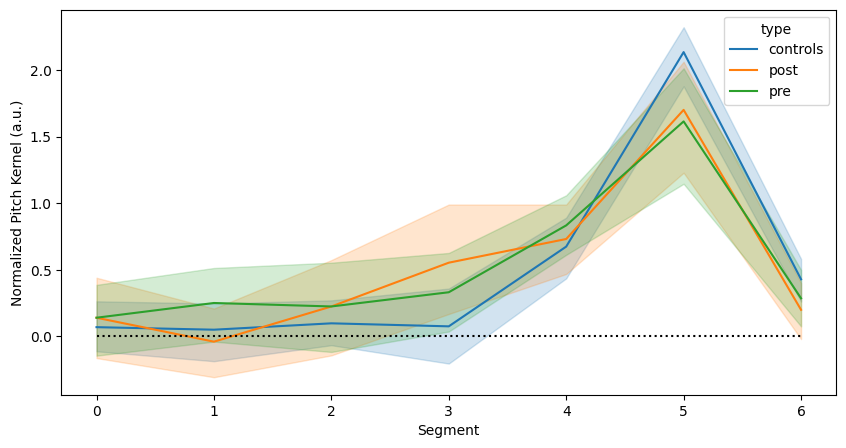

In [29]:
fig = plt.figure(figsize=(10,5))
sns.lineplot(x="segment", 
                  y="kernel_value",
                  hue ='type',
                  data=kernels,
                  ci=95)
plt.xlabel("Segment")
plt.ylabel("Normalized Pitch Kernel (a.u.)")
plt.plot([0,6],[0,0],color='k',linestyle = ':')
plt.savefig('kernels_avg.png')

#### Patients variability based on the controls' mean

In [27]:
grouped_stats = kernels.groupby(['subject', 'segment','type'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
grouped_stats

,subject,segment,type,median,quantile_25,quantile_75
0,0.0,0.0,controls,0.021588,0.021588,0.021588
1,0.0,1.0,controls,0.170469,0.170469,0.170469
2,0.0,2.0,controls,-0.381605,-0.381605,-0.381605
3,0.0,3.0,controls,-0.543959,-0.543959,-0.543959
4,0.0,4.0,controls,0.367073,0.367073,0.367073
...,...,...,...,...,...,...
394,21.0,5.0,post,1.139133,1.139133,1.139133
395,21.0,5.0,pre,1.519100,1.519100,1.519100
396,21.0,6.0,controls,0.240447,0.240447,0.240447
397,21.0,6.0,post,0.227082,0.227082,0.227082


In [190]:
 grouped_stats[grouped_stats.type=='controls'].groupby('segment')['median'].median().reset_index()

,segment,median
0,0.0,0.071561
1,1.0,0.145698
2,2.0,0.016718
3,3.0,-0.261910
4,4.0,0.672834
5,5.0,2.304103
6,6.0,0.374591


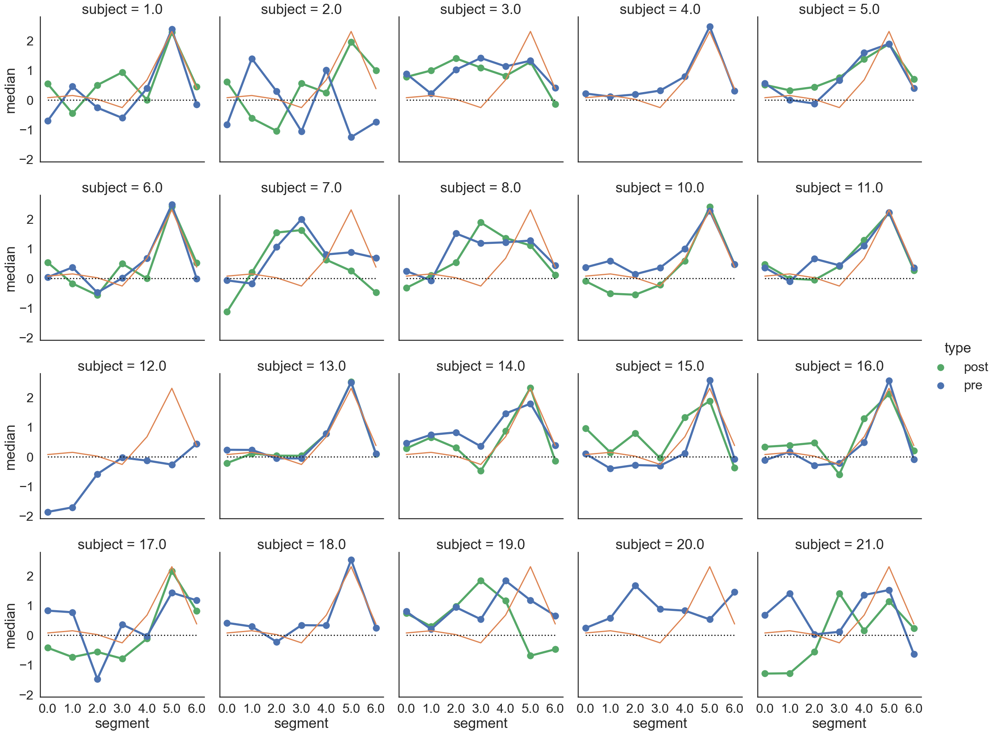

In [200]:
sns.set(style="white", font_scale=1.5)
my_palette = {"pre": sns.color_palette()[0], "post": sns.color_palette()[2]}

sns.set_context('talk', font_scale=1.5) 

g = sns.catplot(x="segment", 
                y="median",
                col = "subject",
                hue='type',
                col_wrap=5,
                data=grouped_stats[(grouped_stats.type!='controls')], 
                kind='point', palette=my_palette)

control_kernels = grouped_stats[grouped_stats.type=='controls'].groupby('segment')['median'].median().reset_index()
axes =  g.axes.flatten()
control_color =sns.color_palette()[1]
for axis in axes:
    axis.plot(control_kernels['segment'], control_kernels['median'], color=control_color)
    axis.plot([0,6],[0,0],color='k',linestyle = ':')

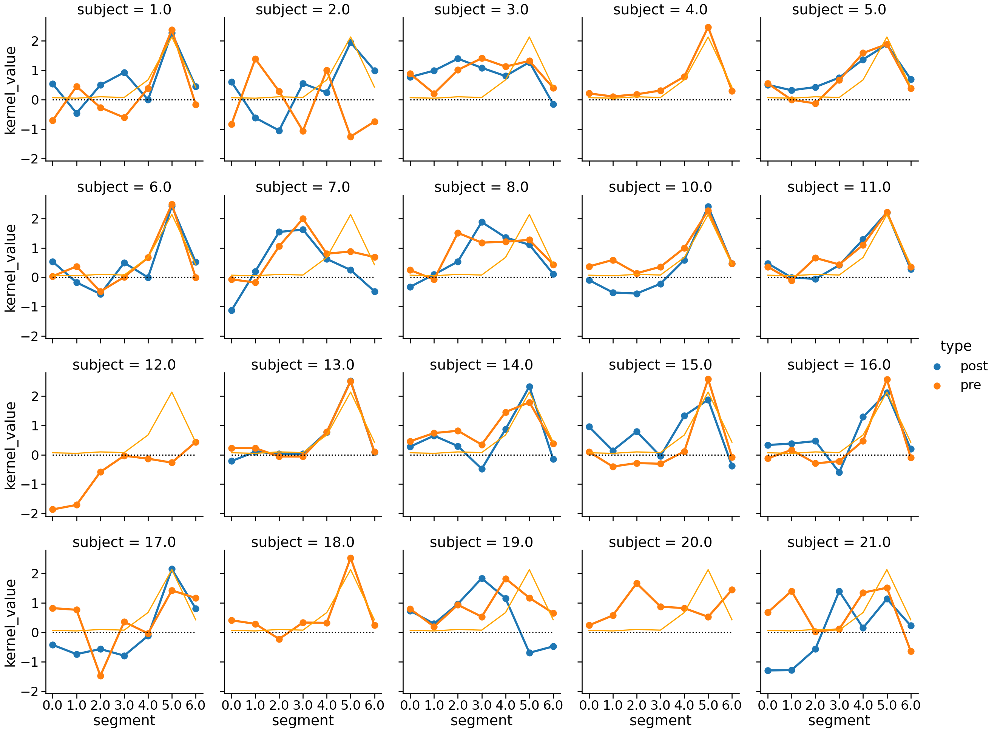

In [30]:
sns.set_context('talk', font_scale=1.5) 

g = sns.catplot(x="segment", 
                y="kernel_value",
                col = "subject",
                hue='type',
                col_wrap=5,
                data=kernels[(kernels.type!='controls')], 
                kind='point')

control_kernels = kernels[kernels.type=='controls'].groupby('segment')['kernel_value'].mean().reset_index()
axes =  g.axes.flatten()
for axis in axes:
    axis.plot(control_kernels['segment'], control_kernels['kernel_value'], color='orange')
    axis.plot([0,6],[0,0],color='k',linestyle = ':')
plt.savefig('subjects_kernels.png')


#### Internal noise measurements

In [28]:
double_pass = utils.index_double_pass_trials(merge_data, 
                               session_identifiers=['type','subject','session'],
                               trial_identifier='trial',
                               response_identifier='double_pass_id',
                               value_identifier='pitch')
double_pass

,subject,session,trial,block,sex,age,date,stim,stim_order,segment,...,rt,experimentor,type,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,double_pass_id
0,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,0.0,...,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0,0.0
1,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,1.0,...,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0,0.0
2,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,2.0,...,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0,0.0
3,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,3.0,...,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0,0.0
4,10.0,1.0,0.0,0.0,m,49.0,2023-12-12 12:23:48.041143,practice/male_vraiment_flat_0.wav,0.0,4.0,...,9.447,celia_aude,pre,D,Fronto-pariétal,2,28.0,12.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121697,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,2.0,...,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121698,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,3.0,...,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121699,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,4.0,...,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN,NaN
121700,21.0,1.0,150.0,3.0,f,52.0,2018-02-25 00:00:00,Sub35_Trial150_1.wav,1.0,5.0,...,1499.000,jeulin,controls,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
#revcor_data['response'] = pd.to_numeric(revcor_data['response'], errors='coerce')
prob_agreement = utils.compute_prob_agreement(double_pass,
                             session_identifiers=['type','subject','session'],
                             trial_identifier='trial',
                             response_identifier='response',
                             order_identifier='stim_order',
                             double_pass_identifier='double_pass_id')
prob_agreement = prob_agreement.dropna(subset=['double_pass_id']).groupby(trial_ids).pc_agree.mean()
prob_agreement

type      subject  session  experimentor
controls  0.0      1.0      aynaz           0.700000
          1.0      1.0      aynaz           0.780000
          2.0      1.0      aynaz           0.640000
          3.0      1.0      aynaz           0.580000
          4.0      1.0      aynaz           0.820000
          5.0      1.0      aynaz           0.720000
          7.0      1.0      aynaz           0.740000
          8.0      1.0      aynaz           0.740000
          9.0      1.0      aynaz           0.860000
          10.0     1.0      aynaz           0.760000
          11.0     1.0      aynaz           0.800000
          12.0     1.0      aynaz           0.800000
          13.0     1.0      aynaz           0.800000
          14.0     1.0      aynaz           0.880000
          15.0     1.0      jeulin          0.840000
          16.0     1.0      jeulin          0.800000
          17.0     1.0      jeulin          0.760000
          18.0     1.0      jeulin          0.840000
     

In [30]:
prob_int_1 = utils.compute_prob_interval1(double_pass,
                             session_identifiers=['subject', 'type','session','experimentor'],
                             trial_identifier='trial',
                             response_identifier='response',
                             order_identifier='stim_order',
                             double_pass_identifier='double_pass_id')
prob_int_1

,subject,type,session,experimentor,p_int1
0,0.0,controls,1.0,aynaz,0.470000
1,1.0,controls,1.0,aynaz,0.550000
2,1.0,post,2.0,celia_aude,0.343137
3,1.0,pre,1.0,celia_aude,0.529412
4,2.0,controls,1.0,aynaz,0.400000
5,2.0,post,2.0,celia_aude,0.441176
6,2.0,pre,1.0,celia_aude,0.480392
7,3.0,controls,1.0,aynaz,0.530000
8,3.0,post,2.0,celia_aude,0.519608
9,3.0,pre,1.0,celia_aude,0.441176


In [31]:
internal_noise_measures = prob_int_1.merge(prob_agreement, on=trial_ids)
internal_noise_measures

,subject,type,session,experimentor,p_int1,pc_agree
0,0.0,controls,1.0,aynaz,0.470000,0.700000
1,1.0,controls,1.0,aynaz,0.550000,0.780000
2,1.0,post,2.0,celia_aude,0.343137,0.745098
3,1.0,pre,1.0,celia_aude,0.529412,0.607843
4,2.0,controls,1.0,aynaz,0.400000,0.640000
5,2.0,post,2.0,celia_aude,0.441176,0.470588
6,2.0,pre,1.0,celia_aude,0.480392,0.470588
7,3.0,controls,1.0,aynaz,0.530000,0.580000
8,3.0,post,2.0,celia_aude,0.519608,0.627451
9,3.0,pre,1.0,celia_aude,0.441176,0.745098


In [32]:
# load precomputed model or recompute if doesn't exist
MODEL_FILE = 'data/model_with_criteria_5.csv'
if os.path.isfile(MODEL_FILE): 
    model_with_criteria = pd.read_csv(MODEL_FILE, index_col=0)
else:
    model_with_criteria = grid.estimate_model(internal_noise_bounds=[0,5,0.05],criteria_bounds=[-5,5,0.05],n_trials=10000)
    model_with_criteria.to_csv(MODEL_FILE)

In [33]:
internal_noise_measures['criteria'] = internal_noise_measures.apply(lambda row: grid.invert_model(model_with_criteria, 
                                                                                      row.pc_agree, 
                                                                                      row.p_int1)[0], axis=1)
internal_noise_measures['internal_noise_with_criteria'] = internal_noise_measures.apply(lambda row: grid.invert_model(model_with_criteria, 
                                                                                      row.pc_agree, 
                                                                                      row.p_int1)[1], axis=1)

In [34]:
internal_noise_measures.criteria = np.abs(internal_noise_measures.criteria)

In [35]:
internal_noise_measures=internal_noise_measures.merge(clinical_data, how='left',on= ['type','subject','experimentor','session'])
internal_noise_measures

,subject,type,session,experimentor,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain
0,0.0,controls,1.0,aynaz,0.470000,0.700000,0.15,0.85,NaN,NaN,NaN,NaN,NaN,NaN
1,1.0,controls,1.0,aynaz,0.550000,0.780000,0.20,0.55,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,post,2.0,celia_aude,0.343137,0.745098,0.70,0.75,D,Insulaire,2,61.0,12.0,0.0
3,1.0,pre,1.0,celia_aude,0.529412,0.607843,0.20,1.40,D,Insulaire,2,61.0,11.0,1.0
4,2.0,controls,1.0,aynaz,0.400000,0.640000,0.55,1.25,NaN,NaN,NaN,NaN,NaN,NaN
5,2.0,post,2.0,celia_aude,0.441176,0.470588,0.90,4.90,D,Temporal,2,3.0,11.0,1.0
6,2.0,pre,1.0,celia_aude,0.480392,0.470588,0.35,4.95,D,Temporal,2,3.0,12.0,0.0
7,3.0,controls,1.0,aynaz,0.530000,0.580000,0.20,1.75,NaN,NaN,NaN,NaN,NaN,NaN
8,3.0,post,2.0,celia_aude,0.519608,0.627451,0.10,1.25,G,Frontal,3,11.0,12.0,0.0
9,3.0,pre,1.0,celia_aude,0.441176,0.745098,0.25,0.65,G,Frontal,3,11.0,12.0,0.0


In [36]:
control_kernel = kernels[kernels.type=='controls'].groupby(['segment'], as_index=False).kernel_value.mean()

accuracy=classification_images.compute_accuracy(merge_data,
                                                control_kernel = list(control_kernel.kernel_value),
                                                session_identifiers = ['experimentor','type','subject','session'],
                                                trial_identifier = 'trial',
                                                stimulus_dimension='segment',
                                                stimulus_value = 'pitch',
                                                stimulus_response='response')

accuracy = accuracy.rename(columns={'hit':'accuracy'})

### Results

In [37]:
revcor_measures = distances.merge(internal_noise_measures, how='left',on= trial_ids).merge(accuracy, how='left', on=trial_ids )
revcor_measures

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy
0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,0.85,NaN,NaN,NaN,NaN,NaN,NaN,0.746667
1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,0.55,NaN,NaN,NaN,NaN,NaN,NaN,0.693333
2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,1.25,NaN,NaN,NaN,NaN,NaN,NaN,0.613333
3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,1.75,NaN,NaN,NaN,NaN,NaN,NaN,0.606667
4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,0.45,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,0.75,NaN,NaN,NaN,NaN,NaN,NaN,0.760000
6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,1.25,NaN,NaN,NaN,NaN,NaN,NaN,0.646667
7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,0.70,NaN,NaN,NaN,NaN,NaN,NaN,0.726667
8,aynaz,controls,9.0,1.0,0.142973,0.953830,0.410000,0.860000,0.35,0.35,NaN,NaN,NaN,NaN,NaN,NaN,0.820000
9,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,0.60,NaN,NaN,NaN,NaN,NaN,NaN,0.740000


<AxesSubplot: xlabel='type', ylabel='internal_noise_with_criteria'>

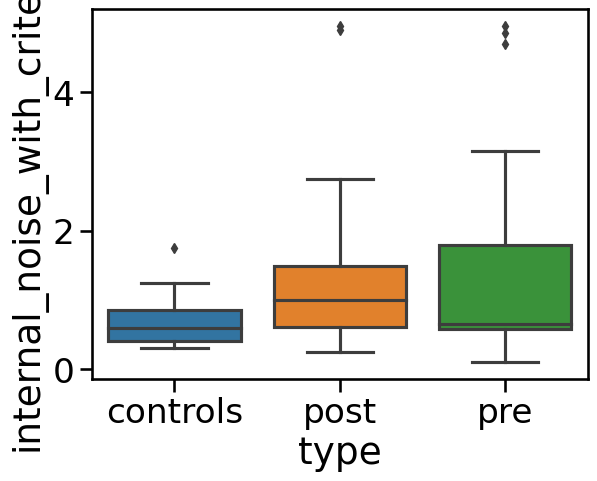

In [41]:
data = revcor_measures
sns.boxplot(data=data, x="type", y="internal_noise_with_criteria")

In [51]:
kernels.reset_index().to_csv('kernels.csv')

In [44]:
revcor_measures.reset_index().to_csv('revcor_measures.csv')

In [15]:
revcor_measures=pd.read_csv('revcor_measures_sans9.csv')  
revcor_measures=revcor_measures.drop(revcor_measures.columns[[0, 1]], axis=1)

In [9]:
revcor_measures_sans9.groupby(['type']).agg({'subject':'count',
                                                                'kernel_typicality':['mean','std','min','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))],
                                                                'internal_noise_with_criteria':['mean','std','min','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_typicality                                          \
           count              mean       std       min       max    median   
type                                                                         
controls      20          0.904628  0.140912  0.355997  0.990652  0.936710   
post          16          0.794785  0.225158  0.209197  0.991844  0.885573   
pre           20          0.785057  0.268196 -0.000000  1.000000  0.899711   

                             internal_noise_with_criteria                  \
                Q1        Q3                         mean       std   min   
type                                                                        
controls  0.912596  0.971063                     0.710000  0.372262  0.30   
post      0.703722  0.942388                     1.503125  1.477212  0.25   
pre       0.743096  0.968521                     1.527500  1.634132  0.10   

                                       
           max median      Q1      Q3  
type                                   
controls  1.75   0.60  0.4375  0.8625  
post      4.95   1.00  0.6125  1.4875  
pre       4.95   0.65  0.5875  1.8000

In [10]:
kernels=pd.read_csv('kernels.csv')  
kernels.groupby('type').subject.unique()

type
controls    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 7.0, 8.0, 9.0, ...
post        [1.0, 2.0, 3.0, 5.0, 6.0, 7.0, 8.0, 10.0, 11.0...
pre         [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, ...
Name: subject, dtype: object

In [11]:
filtered_kernels = kernels[~((kernels['type'] == 'pre') & (kernels['subject'] == 9))]
filtered_kernels.groupby('type').subject.unique()

type
controls    [0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 7.0, 8.0, 9.0, ...
post        [1.0, 2.0, 3.0, 5.0, 6.0, 7.0, 8.0, 10.0, 11.0...
pre         [1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 10.0,...
Name: subject, dtype: object

In [15]:
filtered_kernels.groupby(['type']).agg({'subject':'nunique',
                                                                'kernel_value':['mean','std','min','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_value                                          \
         nunique         mean       std       min       max    median   
type                                                                    
controls      21     0.503945  0.866689 -1.704187  2.550502  0.355916   
post          16     0.501026  0.869322 -1.297350  2.518288  0.456105   
pre           20     0.525379  0.853923 -1.861568  2.576207  0.387924   

                              
                Q1        Q3  
type                          
controls -0.040955  0.859618  
post     -0.067119  0.990228  
pre      -0.005683  0.998799

### Figure of mean kernels and mean internal noise

In [12]:
def classify_localization(localization):
    if pd.isna(localization):
        return 'controls'
    elif isinstance(localization, str):
        if localization.startswith('Front'):
            return 'Frontal'
        elif localization.startswith('Tempo'):
            return 'Temporal'
    return localization

#revcor_measures['lateralization'] = revcor_measures['localization'].apply(classify_localization)
#revcor_measures

In [13]:
kernels['localization'] =kernels['localization'].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels['hemisphere'] =kernels['hemisphere'].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels['lateralization'] = kernels['localization'].apply(classify_localization)
kernels['Délai-postop'] =kernels['Délai-postop'].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels['Résultats-bruts-i-MEL '] =kernels['Résultats-bruts-i-MEL '].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels['Patho-sain'] = kernels['Patho-sain'].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels['Grade'] = kernels['Grade'].apply(lambda x: 'controls' if pd.isna(x) else x)
kernels

,Unnamed: 0,index,type,subject,session,experimentor,segment,kernel_value,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,ProEmo,ProEmo2,ProLing,ProLing2,Pseudo,lateralization
0,0,0,controls,0.0,1.0,aynaz,0.0,0.021588,controls,controls,controls,controls,controls,controls,NaN,NaN,NaN,NaN,NaN,controls
1,1,1,controls,0.0,1.0,aynaz,1.0,0.170469,controls,controls,controls,controls,controls,controls,NaN,NaN,NaN,NaN,NaN,controls
2,2,2,controls,0.0,1.0,aynaz,2.0,-0.381605,controls,controls,controls,controls,controls,controls,NaN,NaN,NaN,NaN,NaN,controls
3,3,3,controls,0.0,1.0,aynaz,3.0,-0.543959,controls,controls,controls,controls,controls,controls,NaN,NaN,NaN,NaN,NaN,controls
4,4,4,controls,0.0,1.0,aynaz,4.0,0.367073,controls,controls,controls,controls,controls,controls,NaN,NaN,NaN,NaN,NaN,controls
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
401,401,401,pre,21.0,1.0,celia_aude,2.0,0.024227,D,Frontal,3,5.0,11.0,1.0,11.0,1.0,11.0,1.0,19.0,Frontal
402,402,402,pre,21.0,1.0,celia_aude,3.0,0.110843,D,Frontal,3,5.0,11.0,1.0,11.0,1.0,11.0,1.0,19.0,Frontal
403,403,403,pre,21.0,1.0,celia_aude,4.0,1.352160,D,Frontal,3,5.0,11.0,1.0,11.0,1.0,11.0,1.0,19.0,Frontal
404,404,404,pre,21.0,1.0,celia_aude,5.0,1.519100,D,Frontal,3,5.0,11.0,1.0,11.0,1.0,11.0,1.0,19.0,Frontal


In [17]:
grouped_stats = kernels.groupby(['type', 'segment'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
grouped_stats

,type,segment,median,quantile_25,quantile_75
0,controls,0.0,0.071561,-0.196493,0.318046
1,controls,1.0,0.145698,-0.051624,0.261644
2,controls,2.0,0.016718,-0.292415,0.410692
3,controls,3.0,-0.261910,-0.504553,0.571714
4,controls,4.0,0.672834,0.376034,1.035098
5,controls,5.0,2.304103,2.000412,2.416540
6,controls,6.0,0.374591,0.230236,0.701606
7,post,0.0,0.402125,-0.243330,0.555913
8,post,1.0,0.097721,-0.473259,0.299966
9,post,2.0,0.362996,-0.557860,0.597332


In [80]:
grouped_stats.reset_index().to_csv('kernel_quantile_par_type.csv')

In [16]:
revcor_measures['localization'] =revcor_measures['localization'].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures['hemisphere'] =revcor_measures['hemisphere'].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures['lateralization'] = revcor_measures['localization'].apply(classify_localization)
revcor_measures['Délai-postop'] =revcor_measures['Délai-postop'].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures['Résultats-bruts-i-MEL '] =revcor_measures['Résultats-bruts-i-MEL '].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures['Patho-sain'] = revcor_measures['Patho-sain'].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures['Grade'] = revcor_measures['Grade'].apply(lambda x: 'controls' if pd.isna(x) else x)
revcor_measures

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralization
0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,0.85,controls,controls,controls,controls,controls,controls,0.746667,controls
1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,0.55,controls,controls,controls,controls,controls,controls,0.693333,controls
2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,1.25,controls,controls,controls,controls,controls,controls,0.613333,controls
3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,1.75,controls,controls,controls,controls,controls,controls,0.606667,controls
4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,0.45,controls,controls,controls,controls,controls,controls,0.760000,controls
5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,0.75,controls,controls,controls,controls,controls,controls,0.760000,controls
6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,1.25,controls,controls,controls,controls,controls,controls,0.646667,controls
7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,0.70,controls,controls,controls,controls,controls,controls,0.726667,controls
8,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,0.60,controls,controls,controls,controls,controls,controls,0.740000,controls
9,aynaz,controls,11.0,1.0,0.260149,0.904750,0.280000,0.800000,0.95,0.60,controls,controls,controls,controls,controls,controls,0.653333,controls


KeyError: 'post'

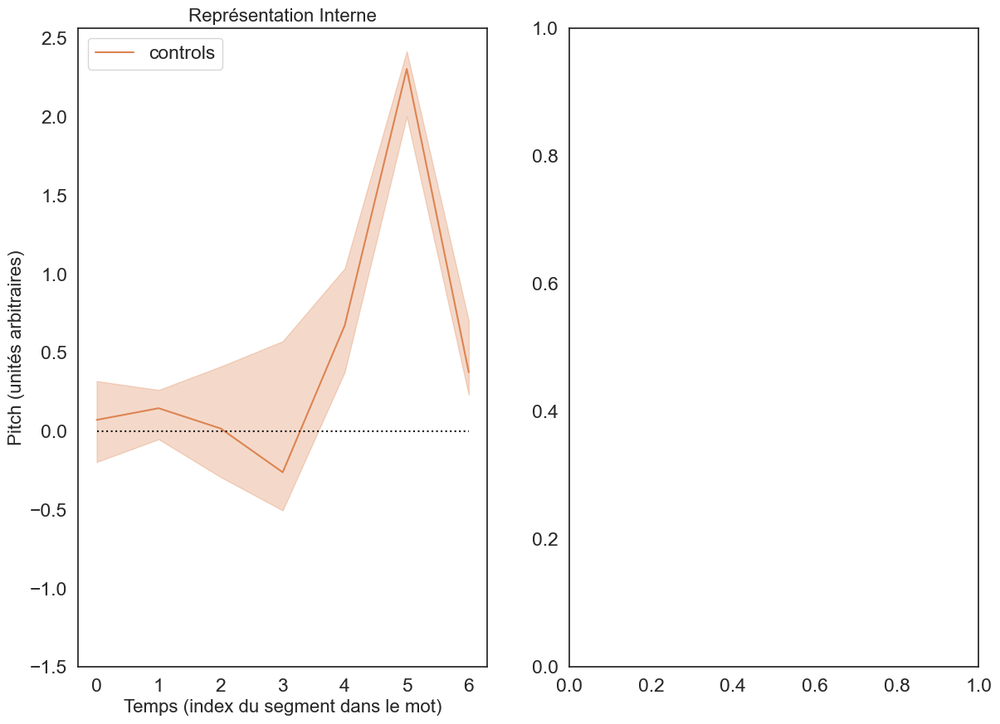

In [18]:
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls"]:
    group_data = grouped_stats[grouped_stats['type'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures, x="type", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "post", "pre"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures, x="type", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls", "post", "pre"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

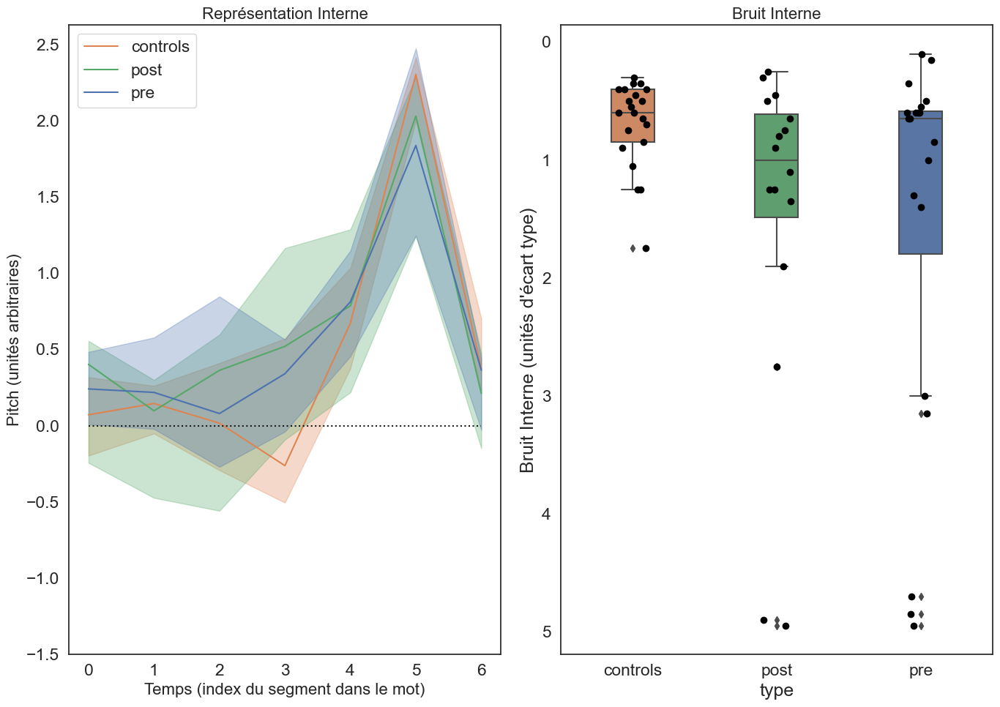

In [50]:
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[0], "post": sns.color_palette()[2]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls", "post", "pre"]:
    group_data = grouped_stats[grouped_stats['type'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures, x="type", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "post", "pre"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures, x="type", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls", "post", "pre"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

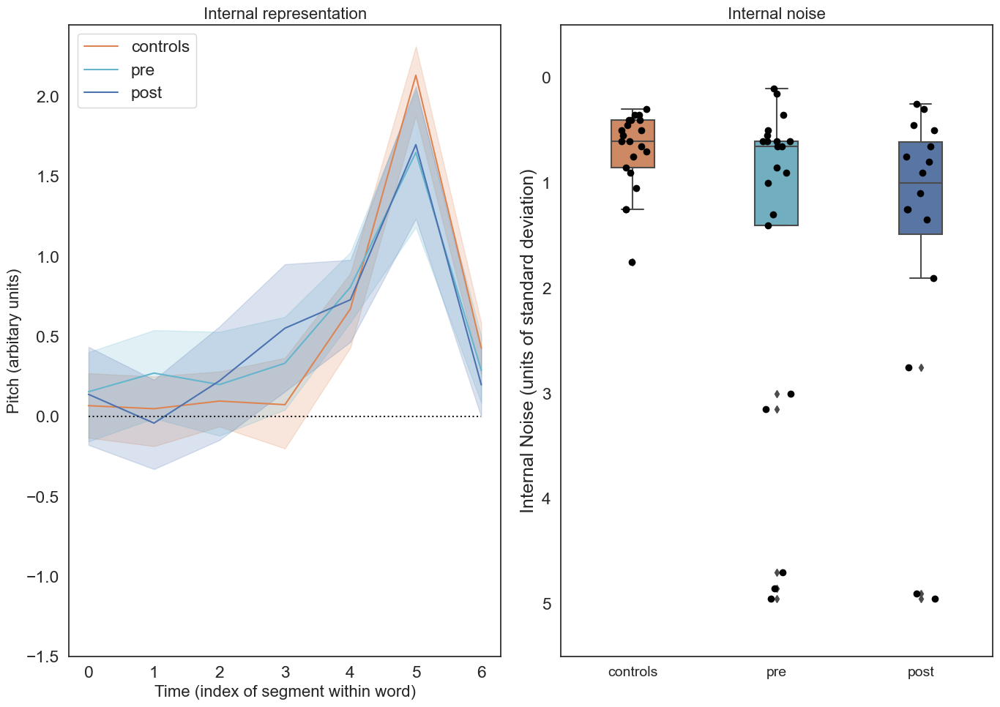

In [195]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "pre", "post"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="type",
             data=kernels,
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "pre", "post"]

sns.boxplot(data=revcor_measures,
            x="type",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures,
              x="type",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


<Figure size 4000x1000 with 0 Axes>

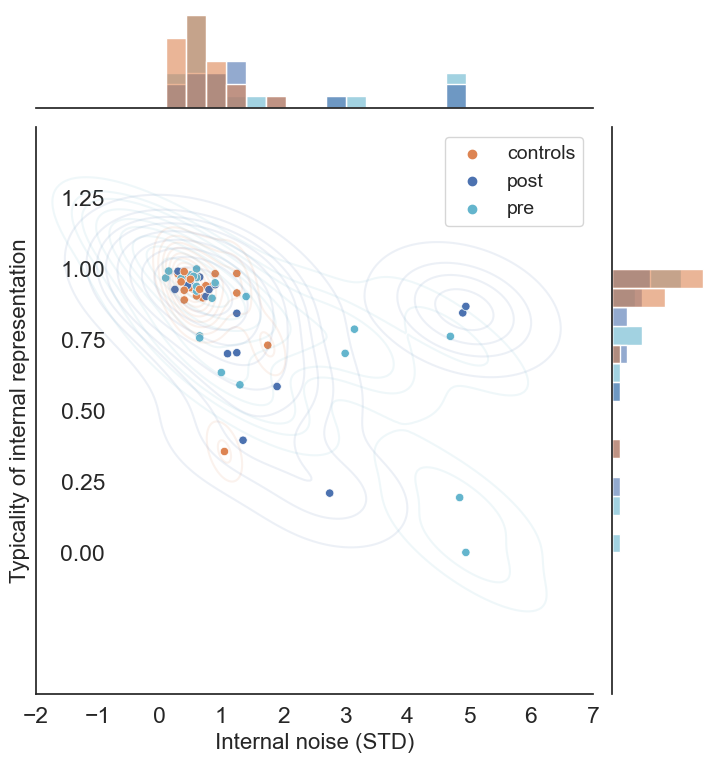

In [196]:
def plot_clusters_kde_x(data, x, y, hue, x_range, color='blue', linewidth=2, save_path=None):
    sns.set_style("white")
    filtered_data = data[(data[x] >= x_range[0]) & (data[x] <= x_range[1])]
    custom_palette = {"controls": sns.color_palette()[1], "pre": sns.color_palette()[9], "post": sns.color_palette()[0]}
    g = sns.JointGrid(data=filtered_data, x=x, y=y, hue=hue, palette=custom_palette, height=8)
    
    # Customize the KDE plot color and linewidth within the sns.kdeplot function
    g.plot_joint(sns.kdeplot, fill=False, common_norm=False, bw_adjust=0.85, alpha=0.1, color=color, linewidth=linewidth)
    
    # Create histogram marginals
    g.plot_marginals(sns.histplot, color="#03051A", alpha=0.6, bins=15)
    
    g.set_axis_labels(xlabel='Internal noise (STD)', ylabel='Typicality of internal representation', fontsize=16)
    g.ax_joint.set_facecolor('white')
    g.ax_joint.set_ylim([-0.5, 1.5])
    g.ax_joint.set_yticks([ 0,0.25,0.50,0.75,1.00,1.25])
    
    g.ax_joint.tick_params(axis='y', direction='in', length=0)
    g.ax_joint.yaxis.set_tick_params(pad=-50)
    g.ax_joint.set_xlim([x_range[0], x_range[1]])  # Separate x-axis limits
    g.ax_joint.set_xticks([x_range[0]-2,x_range[0]-1,x_range[0],x_range[0]+1,x_range[0]+2,x_range[0]+3,x_range[0]+4,x_range[1]-1,x_range[1] ,x_range[1]+1])  # Adjust the x-axis ticks as needed

    sns.scatterplot(data=filtered_data, x=x, y=y, hue=hue,palette=custom_palette ,ax=g.ax_joint)
    g.ax_joint.legend(title=None, fontsize=14)
    
    
    plt.show()  # Show the plot

# Create the first plot
plt.figure(figsize=(40, 10))  # Create a new figure
plot_clusters_kde_x(data=revcor_measures, x="internal_noise_with_criteria", y="kernel_typicality", hue='type', x_range=(0, 6), color='blue', linewidth=2)



### Statistics

In [41]:
def display_group_comparisons_stat(data, group, measures):
    
    fig = plt.figure(figsize=(20,5))
    num_plots = len(measures)
    
    for num_measure, measure in enumerate(measures):
        
        data = data.dropna(subset=[measure, group])
        
        group1 = data[data[group]==data[group].unique()[0]][measure]
        group2 = data[data[group]==data[group].unique()[1]][measure]
        U_stat, p_val = mannwhitneyu(group1, group2, alternative='two-sided')
        r = 1 - (2*U_stat)/(len(group1)*len(group2))
        mean1 = group1.mean()
        mean2 = group2.mean()

        median1 = group1.median()
        median2 = group2.median()

        # Bootstrapping for confidence interval of median difference
        n_bootstraps = 10000
        boot_median_differences = []
        boot_mean_differences = []
        
        for i in range(n_bootstraps):
            
            boot_group1 = group1.sample(len(group1), replace=True)
            boot_group2 = group2.sample(len(group2), replace=True)
            # bootstrap mean
            boot_mean_difference = boot_group1.mean() - boot_group2.mean()
            boot_mean_differences.append(boot_mean_difference)
            # bootstrap median
            boot_median_difference = boot_group1.median() - boot_group2.median()
            boot_median_differences.append(boot_median_difference)
        # CI on mean
        boot_mean_differences.sort()
        mean_CI_low = boot_mean_differences[int(n_bootstraps*0.025)]
        mean_CI_high = boot_mean_differences[int(n_bootstraps*0.975)]
        # CI on median
        boot_median_differences.sort()
        median_CI_low = boot_median_differences[int(n_bootstraps*0.025)]
        median_CI_high = boot_median_differences[int(n_bootstraps*0.975)]

        # report the result
        print('------------------------------------')
        print('Mann-Whitney U Test for', measure.upper(), 'and', group.upper())
        print(f"Med = {median1-median2:.2f} [{median_CI_low:.2f} - {median_CI_high:.2f}]")
        print(f"M = {mean1-mean2:.2f} [{mean_CI_low:.2f} - {mean_CI_high:.2f}], U={U_stat:.2f}, r={r:.2f}, p={p_val:.3f}")

#### Reverse correlation measures differentiate patients and controls 

In [52]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], 
                               group='type', 
                               measures = ['kernel_typicality'])

------------------------------------
Mann-Whitney U Test for KERNEL_TYPICALITY and TYPE
Med = 0.04 [-0.03 - 0.19]
M = 0.12 [0.00 - 0.26], U=265.00, r=-0.26, p=0.155


<Figure size 2000x500 with 0 Axes>

In [53]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], 
                               group='type', 
                               measures = ['internal_noise_with_criteria'])

------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_WITH_CRITERIA and TYPE
Med = -0.05 [-0.80 - 0.12]
M = -0.83 [-1.58 - -0.16], U=154.00, r=0.27, p=0.147


<Figure size 2000x500 with 0 Axes>

In [54]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], 
                               group='type', 
                               measures = ['kernel_typicality'])

------------------------------------
Mann-Whitney U Test for KERNEL_TYPICALITY and TYPE
Med = 0.05 [-0.01 - 0.23]
M = 0.11 [-0.00 - 0.24], U=233.00, r=-0.39, p=0.048


<Figure size 2000x500 with 0 Axes>

In [55]:
display_group_comparisons_stat(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], 
                               group='type', 
                               measures = ['internal_noise_with_criteria'])

------------------------------------
Mann-Whitney U Test for INTERNAL_NOISE_WITH_CRITERIA and TYPE
Med = -0.40 [-0.88 - 0.00]
M = -0.81 [-1.58 - -0.16], U=102.50, r=0.39, p=0.046


<Figure size 2000x500 with 0 Axes>

In [57]:
df=revcor_measures
pre_patients = df[df['type'] == 'pre']['kernel_typicality']
post_patients = df[df['type'] == 'post']['kernel_typicality']
controls = df[df['type'] == 'controls']['kernel_typicality']

print("pre:", shapiro(pre_patients))
print("post:", shapiro(post_patients))
print("controls normality:", shapiro(controls))

pre: ShapiroResult(statistic=0.7501230239868164, pvalue=0.00017040738021023571)
post: ShapiroResult(statistic=0.7885473966598511, pvalue=0.0019265927840024233)
controls normality: ShapiroResult(statistic=0.5230183005332947, pvalue=3.3395571108485456e-07)


In [58]:
df=revcor_measures
groups = kernels['type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['type'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['type'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls   post        233.0  0.047999     21     16
1  controls    pre        265.0  0.155180     21     20
2      post    pre        150.0  0.762317     16     20
Found significant differences between some pairs for kernel typicality


In [59]:
df=revcor_measures
groups = df['type'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['type'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['type'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls   post        102.5  0.045971     21     16
1  controls    pre        154.0  0.146788     21     20
2      post    pre        176.0  0.621310     16     20
Found significant differences between some pairs for internal noise


#### Reverse correlation measures differentiate pre and post operation patients

In [61]:
revcor_measures_patients=revcor_measures[revcor_measures.experimentor=='celia_aude']
df=revcor_measures_patients[~revcor_measures_patients.subject.isin([4,12,18,20])]
types  = df['type'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['type'] == types[0]]['internal_noise_with_criteria'].values
    data2 = df[df['type'] == types[1]]['internal_noise_with_criteria'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for internal noise between pre and post operation: {stat}, P-value: {pvalue}, Size1 : {len(data1)}, Size2 : {len(data2)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for internal noise between pre and post operation: 49.0, P-value: 0.5319644366832486, Size1 : 16, Size2 : 16


In [64]:
revcor_measures_patients=revcor_measures[revcor_measures.experimentor=='celia_aude']
df=revcor_measures_patients[~revcor_measures_patients.subject.isin([4,12,18,20])]
types  = df['type'].unique()  # Get unique experimentor names

# Make sure you have two and only two unique types for a paired test
if len(types) == 2:
    data1 = df[df['type'] == types[0]]['kernel_typicality'].values
    data2 = df[df['type'] == types[1]]['kernel_typicality'].values
    if len(data1) == len(data2):  # Ensure the paired data are of equal length
        stat, pvalue = wilcoxon(data1, data2)
        print(f'Wilcoxon test statistic for kernel typicality between pre and post operation: {stat}, P-value: {pvalue}, Size1 : {len(data1)}, Size2 : {len(data2)}')
    else:
        print("Data length mismatch between groups for Wilcoxon test.")
else:
    print("Wilcoxon test requires exactly two matched groups.")

Wilcoxon test statistic for kernel typicality between pre and post operation: 44.0, P-value: 0.231201171875, Size1 : 16, Size2 : 16


#### Localization differentiate patients and controls 

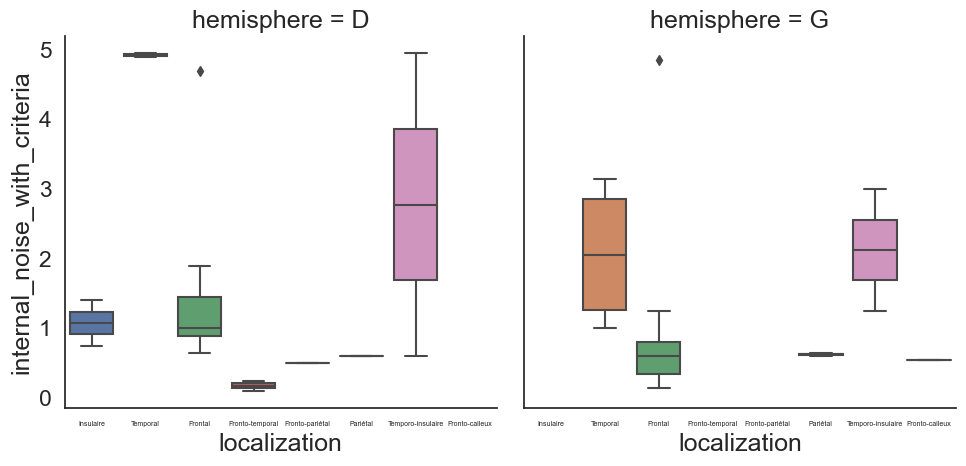

In [207]:
g = sns.catplot(
    data=revcor_measures, 
    x='localization', 
    y='internal_noise_with_criteria',
    col='hemisphere', 
    kind='box', 
    col_wrap=2
)

# Set xtick labels with a smaller font size
g.set_xticklabels(fontsize=5)

# Adjust the layout so labels and titles don't overlap
g.fig.tight_layout()

# Show the plot
plt.show()

In [65]:
for name, group in clinical_data.groupby('hemisphere'):
    print(name, group['localization'].unique())

D ['Insulaire' 'Temporal' 'Pariétal' 'Fronto-temporal' 'Frontal'
 'Fronto-pariétal' 'Temporo-insulaire']
G ['Frontal' 'Temporal' 'Pariétal' 'Temporo-insulaire' 'Fronto-calleux']


In [66]:
print(revcor_measures.groupby(['hemisphere','type'])['internal_noise_with_criteria'].mean())
print(revcor_measures.groupby(['hemisphere','type'])['kernel_typicality'].mean())

hemisphere  type    
D           post        1.906250
            pre         1.565000
G           post        1.100000
            pre         1.490000
controls    controls    0.692857
Name: internal_noise_with_criteria, dtype: float64
hemisphere  type    
D           post        0.841436
            pre         0.779502
G           post        0.748133
            pre         0.790613
controls    controls    0.906971
Name: kernel_typicality, dtype: float64


In [68]:
revcor_measures.groupby(['hemisphere','type']).agg({'kernel_typicality':['mean','std'],
                                                                'internal_noise_with_criteria':['mean','std','max']})

kernel_typicality           internal_noise_with_criteria  \
                                 mean       std                         mean   
hemisphere type                                                                
D          post              0.841436  0.131638                     1.906250   
           pre               0.779502  0.302226                     1.565000   
G          post              0.748133  0.293822                     1.100000   
           pre               0.790613  0.245848                     1.490000   
controls   controls          0.906971  0.137763                     0.692857   

                                     
                          std   max  
hemisphere type                      
D          post      1.925290  4.95  
           pre       1.759901  4.95  
G          post      0.773212  2.75  
           pre       1.592831  4.85  
controls   controls  0.371243  1.75

In [69]:
print(revcor_measures.groupby(['hemisphere','localization','type'])['internal_noise_with_criteria'].mean())
print(revcor_measures.groupby(['hemisphere','localization','type'])['kernel_typicality'].mean())

hemisphere  localization       type    
D           Frontal            post        1.300000
                               pre         1.875000
            Fronto-pariétal    post        0.500000
                               pre         0.500000
            Fronto-temporal    post        0.250000
                               pre         0.100000
            Insulaire          post        0.750000
                               pre         1.400000
            Pariétal           pre         0.600000
            Temporal           post        4.900000
                               pre         4.950000
            Temporo-insulaire  post        4.950000
                               pre         0.600000
G           Frontal            post        0.700000
                               pre         1.320000
            Fronto-calleux     pre         0.550000
            Pariétal           post        0.650000
                               pre         0.600000
            Temporal    

In [217]:
print(revcor_measures.groupby(['hemisphere','localization','subject','type'])['internal_noise_with_criteria'].mean())
print(revcor_measures.groupby(['hemisphere','localization','subject','type'])['kernel_typicality'].mean())

hemisphere  localization       subject  type
D           Frontal            8.0      post    1.10
                                        pre     0.65
                               9.0      pre     0.90
                               14.0     post    0.90
                                        pre     0.85
                               20.0     pre     1.30
                               21.0     post    1.90
                                        pre     4.70
            Fronto-pariétal    10.0     post    0.50
                                        pre     0.50
            Fronto-temporal    6.0      post    0.25
                                        pre     0.10
            Insulaire          1.0      post    0.75
                                        pre     1.40
            Pariétal           4.0      pre     0.60
            Temporal           2.0      post    4.90
                                        pre     4.95
            Temporo-insulaire  15.0     post    4.95
 

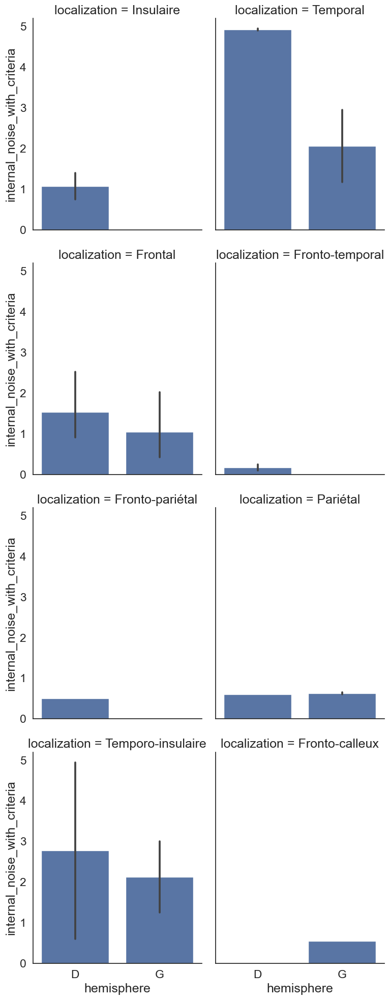

In [218]:
g = sns.FacetGrid(revcor_measures, col="localization", height=5, aspect=.8, col_wrap=2)
g.map(sns.barplot, "hemisphere", "internal_noise_with_criteria", order=["D", "G"])

### Analysis for superset of localization

In [73]:
revcor_measures.groupby(['hemisphere','lateralization','type']).agg({'subject':'count',
                                                                'kernel_typicality':['mean','std',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))],
                                                                'internal_noise_with_criteria':['mean','std','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_typicality            \
                                     count              mean       std   
hemisphere lateralization type                                           
D          Frontal        post           5          0.823067  0.169616   
                          pre            6          0.825643  0.150070   
           Insulaire      post           1          0.903254       NaN   
                          pre            1          0.902697       NaN   
           Pariétal       pre            1          1.000000       NaN   
           Temporal       post           2          0.856449  0.016182   
                          pre            2          0.469230  0.663592   
G          Frontal        post           4          0.891299  0.127519   
                          pre            6          0.802069  0.309536   
           Pariétal       post           1          0.971368       NaN   
                          pre            1          0.969396       NaN   
           Temporal       post           3          0.482834  0.326010   
                          pre            3          0.708107  0.076595   
controls   controls       controls      21          0.906971  0.137763   

                                                                  \
                                      median        Q1        Q3   
hemisphere lateralization type                                     
D          Frontal        post      0.927716  0.701087  0.944543   
                          pre       0.829462  0.758102  0.950354   
           Insulaire      post      0.903254  0.903254  0.903254   
                          pre       0.902697  0.902697  0.902697   
           Pariétal       pre       1.000000  1.000000  1.000000   
           Temporal       post      0.856449  0.850728  0.862171   
                          pre       0.469230  0.234615  0.703846   
G          Frontal        post      0.934376  0.871462  0.954213   
                          pre       0.944331  0.803372  0.972119   
           Pariétal       post      0.971368  0.971368  0.971368   
                          pre       0.969396  0.969396  0.969396   
           Temporal       post      0.395767  0.302482  0.619653   
                          pre       0.702173  0.668413  0.744835   
controls   controls       controls  0.939521  0.915212  0.970918   

                                   internal_noise_with_criteria            \
                                                           mean       std   
hemisphere lateralization type                                              
D          Frontal        post                         0.930000  0.636003   
                          pre                          1.350000  1.688194   
           Insulaire      post                         0.750000       NaN   
                          pre                          1.400000       NaN   
           Pariétal       pre                          0.600000       NaN   
           Temporal       post                         4.925000  0.035355   
                          pre                          2.775000  3.075914   
G          Frontal        post                         0.700000  0.422295   
                          pre                          1.191667  1.801782   
           Pariétal       post                         0.650000       NaN   
                          pre                          0.600000       NaN   
           Temporal       post                         1.783333  0.838650   
                          pre                          2.383333  1.200347   
controls   controls       controls                     0.692857  0.371243   

                                                                 
                                     max median      Q1      Q3  
hemisphere lateralization type                                   
D          Frontal        post      1.90  0.900  0.5000  1.1000  
                          pre       4.70  0.7

In [47]:
revcor_measures[revcor_measures.lateralization.isin(['Frontal','Temporal','controls'])].groupby(['hemisphere','lateralization','type']).agg({'subject':'count',
                                                                'kernel_typicality':['mean','std',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))],
                                                                'internal_noise_with_criteria':['mean','std','max',('median', np.median),('Q1', lambda x: np.percentile(x, 25)),('Q3', lambda x: np.percentile(x, 75))]})

subject kernel_typicality            \
                                     count              mean       std   
hemisphere lateralization type                                           
D          Frontal        post           5          0.823067  0.169616   
                          pre            6          0.825643  0.150070   
           Temporal       post           2          0.856449  0.016182   
                          pre            2          0.469230  0.663592   
G          Frontal        post           4          0.891299  0.127519   
                          pre            6          0.802069  0.309536   
           Temporal       post           3          0.482834  0.326010   
                          pre            3          0.708107  0.076595   
controls   controls       controls      21          0.906971  0.137763   

                                                                  \
                                      median        Q1        Q3   
hemisphere lateralization type                                     
D          Frontal        post      0.927716  0.701087  0.944543   
                          pre       0.829462  0.758102  0.950354   
           Temporal       post      0.856449  0.850728  0.862171   
                          pre       0.469230  0.234615  0.703846   
G          Frontal        post      0.934376  0.871462  0.954213   
                          pre       0.944331  0.803372  0.972119   
           Temporal       post      0.395767  0.302482  0.619653   
                          pre       0.702173  0.668413  0.744835   
controls   controls       controls  0.939521  0.915212  0.970918   

                                   internal_noise_with_criteria            \
                                                           mean       std   
hemisphere lateralization type                                              
D          Frontal        post                         0.930000  0.636003   
                          pre                          1.350000  1.688194   
           Temporal       post                         4.925000  0.035355   
                          pre                          2.775000  3.075914   
G          Frontal        post                         0.700000  0.422295   
                          pre                          1.191667  1.801782   
           Temporal       post                         1.783333  0.838650   
                          pre                          2.383333  1.200347   
controls   controls       controls                     0.692857  0.371243   

                                                                 
                                     max median      Q1      Q3  
hemisphere lateralization type                                   
D          Frontal        post      1.90  0.900  0.5000  1.1000  
                          pre       4.70  0.750  0.5375  1.1875  
           Temporal       post      4.95  4.925  4.9125  4.9375  
                          pre       4.95  2.775  1.6875  3.8625  
G          Frontal        post      1.25  0.625  0.4125  0.9125  
                          pre       4.85  0.575  0.4000  0.6375  
           Temporal       post      2.75  1.350  1.3000  2.0500  
                          pre       3.15  3.000  2.0000  3.0750  
controls   controls       controls  1.75  0.600  0.4000  0.8500

In [215]:
revcor_measures.groupby(['hemisphere','lateralization','type']).agg({ 'kernel_typicality':['mean'],
                                                                'internal_noise_with_criteria':['mean']})

kernel_typicality internal_noise_with_criteria
                                            mean                         mean
hemisphere lateralization type                                               
D          Frontal        post          0.823067                     0.930000
                          pre           0.843561                     1.285714
           Insulaire      post          0.903254                     0.750000
                          pre           0.902697                     1.400000
           Pariétal       pre           1.000000                     0.600000
           Temporal       post          0.856449                     4.925000
                          pre           0.469230                     2.775000
G          Frontal        post          0.891299                     0.700000
                          pre           0.802069                     1.191667
           Pariétal       post          0.971368                     0.650000
                          pre           0.969396                     0.600000
           Temporal       post          0.482834                     1.783333
                          pre           0.708107                     2.383333

#### Reverse correlation measures differentiate different localization of tumors from controls 

In [76]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right and left hemisphere) ")
else:
    print("No significant differences for internal representation found between any pairs.")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire         17.0  0.454545     21      1
1   controls   Temporal         91.0  0.009851     21      5
2   controls    Frontal        151.0  0.359201     21     12
3   controls   Pariétal          6.0  0.126482     21      2
4  Insulaire   Temporal          4.0  0.666667      1      5
5  Insulaire    Frontal          6.0  1.000000      1     12
6  Insulaire   Pariétal          0.0  0.666667      1      2
7   Temporal    Frontal         16.0  0.159987      5     12
8   Temporal   Pariétal          0.0  0.095238      5      2
9    Frontal   Pariétal          3.0  0.131868     12      2
Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right and left hemisphere) 


In [79]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery-controls (Right hemisphere and controls).")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire         17.0  0.454545     21      1
1   controls   Temporal         32.0  0.284585     21      2
2   controls    Frontal         86.0  0.194912     21      6
3   controls   Pariétal          0.0  0.090909     21      1
4  Insulaire   Temporal          1.0  1.000000      1      2
5  Insulaire    Frontal          4.0  0.857143      1      6
6  Insulaire   Pariétal          0.0  1.000000      1      1
7   Temporal    Frontal          4.0  0.642857      2      6
8   Temporal   Pariétal          0.0  0.666667      2      1
9    Frontal   Pariétal          0.0  0.285714      6      1
No significant differences for internal representation found between any pairs for pre surgery-controls (Right hemisphere and controls).


In [160]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery-controls (left hemisphere and controls)")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery-controls (left hemisphere and controls).")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         65.0  0.932137     21      6
1  controls  Temporal         59.0  0.010870     21      3
2  controls  Pariétal          6.0  0.636364     21      1
3   Frontal  Temporal         14.0  0.261905      6      3
4   Frontal  Pariétal          2.0  0.857143      6      1
5  Temporal  Pariétal          0.0  0.500000      3      1
Found significant differences between some pairs for kernel typicality between pre surgery-controls (left hemisphere and controls)


In [150]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (Right and left hemisphere)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (Right and left hemisphere)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          1.0  0.155080     21      1
1   controls   Temporal         14.0  0.013251     21      5
2   controls    Frontal        119.0  0.807444     21     12
3   controls   Pariétal         20.0  0.956310     21      2
4  Insulaire   Temporal          2.0  1.000000      1      5
5  Insulaire    Frontal         10.0  0.348912      1     12
6  Insulaire   Pariétal          2.0  0.479500      1      2
7   Temporal    Frontal         46.5  0.091293      5     12
8   Temporal   Pariétal          9.0  0.159512      5      2
9    Frontal   Pariétal         13.0  0.926863     12      2
Found significant differences between some pairs for internal noise between pre surgery-controls (Right and left hemisphere)


In [151]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = revcor_measures['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (Right hemisphere and controls)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          1.0  0.155080     21      1
1   controls   Temporal         10.0  0.250651     21      2
2   controls    Frontal         49.0  0.430169     21      6
3   controls   Pariétal         10.0  1.000000     21      1
4  Insulaire   Temporal          1.0  1.000000      1      2
5  Insulaire    Frontal          5.0  0.571429      1      6
6  Insulaire   Pariétal          1.0  1.000000      1      1
7   Temporal    Frontal          8.0  0.642857      2      6
8   Temporal   Pariétal          1.5  1.000000      2      1
9    Frontal   Pariétal          4.0  0.857143      6      1
No significant differences for internal noise found between any pairs for pre surgery-controls (Right hemisphere and controls)


In [157]:
df=revcor_measures[revcor_measures.hemisphere.isin(['D','controls'])]
df=df[df.type.isin(['post','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between post surgery-controls (Right hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for post surgery-controls (Right hemisphere and controls)")

      Group1     Group2  U-statistic   P-value  Size1  Size2
0   controls  Insulaire          6.5  0.580206     21      1
1   controls   Temporal          0.0  0.025015     21      2
2   controls    Frontal         41.5  0.493637     21      5
3  Insulaire   Temporal          0.0  0.666667      1      2
4  Insulaire    Frontal          2.0  1.000000      1      5
5   Temporal    Frontal         10.0  0.095238      2      5
Found significant differences between some pairs for internal noise between post surgery-controls (Right hemisphere and controls)


In [161]:
df=revcor_measures[revcor_measures.hemisphere.isin(['G','controls'])]
df=df[df.type.isin(['pre','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery-controls (left hemisphere and controls)")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery-controls (left hemisphere and controls)")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls   Frontal         70.0  0.703933     21      6
1  controls  Temporal          4.0  0.018232     21      3
2  controls  Pariétal         10.0  1.000000     21      1
3   Frontal  Temporal          3.0  0.166667      6      3
4   Frontal  Pariétal          2.5  1.000000      6      1
5  Temporal  Pariétal          3.0  0.500000      3      1
Found significant differences between some pairs for internal noise between pre surgery-controls (left hemisphere and controls)


In [153]:
print(revcor_measures.groupby(['hemisphere','lateralization','type'])['subject'].unique())

hemisphere  lateralization  type    
D           Frontal         post                             [6.0, 8.0, 10.0, 14.0, 21.0]
                            pre                        [6.0, 8.0, 10.0, 14.0, 20.0, 21.0]
            Insulaire       post                                                    [1.0]
                            pre                                                     [1.0]
            Pariétal        pre                                                     [4.0]
            Temporal        post                                              [2.0, 15.0]
                            pre                                               [2.0, 15.0]
G           Frontal         post                                   [3.0, 5.0, 13.0, 16.0]
                            pre                        [3.0, 5.0, 12.0, 13.0, 16.0, 18.0]
            Pariétal        post                                                   [11.0]
                            pre                                

In [89]:
print(revcor_measures.groupby(['hemisphere','lateralization','type'])['kernel_typicality'].mean())

hemisphere  lateralization  type    
D           Frontal         post        0.823067
                            pre         0.825643
            Insulaire       post        0.903254
                            pre         0.902697
            Pariétal        pre         1.000000
            Temporal        post        0.856449
                            pre         0.469230
G           Frontal         post        0.891299
                            pre         0.802069
            Pariétal        post        0.971368
                            pre         0.969396
            Temporal        post        0.482834
                            pre         0.708107
controls    controls        controls    0.906971
Name: kernel_typicality, dtype: float64


In [90]:
print(revcor_measures.groupby(['hemisphere','lateralization','type'])['internal_noise_with_criteria'].mean())

hemisphere  lateralization  type    
D           Frontal         post        0.930000
                            pre         1.350000
            Insulaire       post        0.750000
                            pre         1.400000
            Pariétal        pre         0.600000
            Temporal        post        4.925000
                            pre         2.775000
G           Frontal         post        0.700000
                            pre         1.191667
            Pariétal        post        0.650000
                            pre         0.600000
            Temporal        post        1.783333
                            pre         2.383333
controls    controls        controls    0.692857
Name: internal_noise_with_criteria, dtype: float64


#### Reverse correlation measures differentiate right lateralized frontal tumors from controls 

In [91]:
revcor_measures

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralization
0,aynaz,controls,0.0,1.0,0.177134,0.939521,0.470000,0.700000,0.15,0.85,controls,controls,controls,controls,controls,controls,0.746667,controls
1,aynaz,controls,1.0,1.0,0.202590,0.928859,0.550000,0.780000,0.20,0.55,controls,controls,controls,controls,controls,controls,0.693333,controls
2,aynaz,controls,2.0,1.0,0.235171,0.915212,0.400000,0.640000,0.55,1.25,controls,controls,controls,controls,controls,controls,0.613333,controls
3,aynaz,controls,3.0,1.0,0.675032,0.730970,0.530000,0.580000,0.20,1.75,controls,controls,controls,controls,controls,controls,0.606667,controls
4,aynaz,controls,4.0,1.0,0.102179,0.970918,0.470000,0.820000,0.10,0.45,controls,controls,controls,controls,controls,controls,0.760000,controls
5,aynaz,controls,5.0,1.0,0.173691,0.940963,0.500000,0.720000,0.00,0.75,controls,controls,controls,controls,controls,controls,0.760000,controls
6,aynaz,controls,7.0,1.0,0.070427,0.984217,0.210000,0.740000,1.80,1.25,controls,controls,controls,controls,controls,controls,0.646667,controls
7,aynaz,controls,8.0,1.0,0.276282,0.897992,0.610000,0.740000,0.45,0.70,controls,controls,controls,controls,controls,controls,0.726667,controls
8,aynaz,controls,9.0,1.0,0.142973,0.953830,0.410000,0.860000,0.35,0.35,controls,controls,controls,controls,controls,controls,0.820000,controls
9,aynaz,controls,10.0,1.0,0.100795,0.971497,0.480000,0.760000,0.10,0.60,controls,controls,controls,controls,controls,controls,0.740000,controls


In [172]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery frontal right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery frontal right hemisphere and controls.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         86.0  0.194912     21      6
No significant differences for internal representation found between any pairs for pre surgery frontal right hemisphere and controls.


In [174]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery temporal right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery temporal right hemisphere and controls.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         32.0  0.284585     21      2
No significant differences for internal representation found between any pairs for pre surgery temporal right hemisphere and controls.


In [94]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         70.0  0.278352     21      5
No significant differences for internal representation found between any pairs.


In [173]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery frontal right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery frontal right hemisphere and controls.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         49.0  0.430169     21      6
No significant differences for internal noise found between any pairs for pre surgery frontal right hemisphere and controls.


In [175]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery temporal right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery temporal right hemisphere and controls.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         10.0  0.250651     21      2
No significant differences for internal noise found between any pairs for pre surgery temporal right hemisphere and controls.


In [96]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
df=df[df.lateralization.isin(['Frontal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1   Group2  U-statistic   P-value  Size1  Size2
0  controls  Frontal         41.5  0.493637     21      5
No significant differences for internal representation found between any pairs.


#### Reverse correlation measures differentiate right lateralized localization of tumors from controls 

In [163]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery right hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery right hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D        135.0  0.212543     21     10
No significant differences for internal representation found between any pairs for pre surgery right hemisphere and controls.


In [164]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery left hemisphere and controls")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery left hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G        130.0  0.300522     21     10
No significant differences for internal representation found between any pairs for pre surgery left hemisphere and controls.


In [165]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','D'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality between pre surgery left and right hemisphere")
else:
    print("No significant differences for internal representation found between any pairs for pre surgery left and right hemisphere.")

  Group1 Group2  U-statistic  P-value  Size1  Size2
0      D      G         49.0  0.96985     10     10
No significant differences for internal representation found between any pairs for pre surgery left and right hemisphere.


In [98]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic  P-value  Size1  Size2
0  controls      D        125.0  0.04657     21      8
Found significant differences between some pairs for kernel typicality


In [107]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for kernel typicality")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G        108.0  0.257353     21      8
No significant differences for internal representation found between any pairs.


In [169]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery right hemisphere and controls")
else:
    print("No significant differences for internal noise found between any pairs for pre surgery right hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         70.0  0.143978     21     10
No significant differences for internal noise found between any pairs for pre surgery right hemisphere and controls.


In [170]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery left hemisphere and controls")
else:
    print("No significant differences for internal noise found for any pairs between pre surgery left hemisphere and controls.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G         84.0  0.385279     21     10
No significant differences for internal noise found for any pairs between pre surgery left hemisphere and controls.


In [171]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.hemisphere.isin(['G','D'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise between pre surgery left and right hemisphere")
else:
    print("No significant differences for internal noise found for any pairs between pre surgery left and right hemisphere.")

  Group1 Group2  U-statistic  P-value  Size1  Size2
0      D      G         54.5  0.76141     10     10
No significant differences for internal noise found for any pairs between pre surgery left and right hemisphere.


In [101]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['D','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise ")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic  P-value  Size1  Size2
0  controls      D         48.0  0.08274     21      8
No significant differences for internal noise found between any pairs.


In [109]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.hemisphere.isin(['G','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      G         54.5  0.156029     21      8
No significant differences for internal noise found between any pairs.


### Figure 

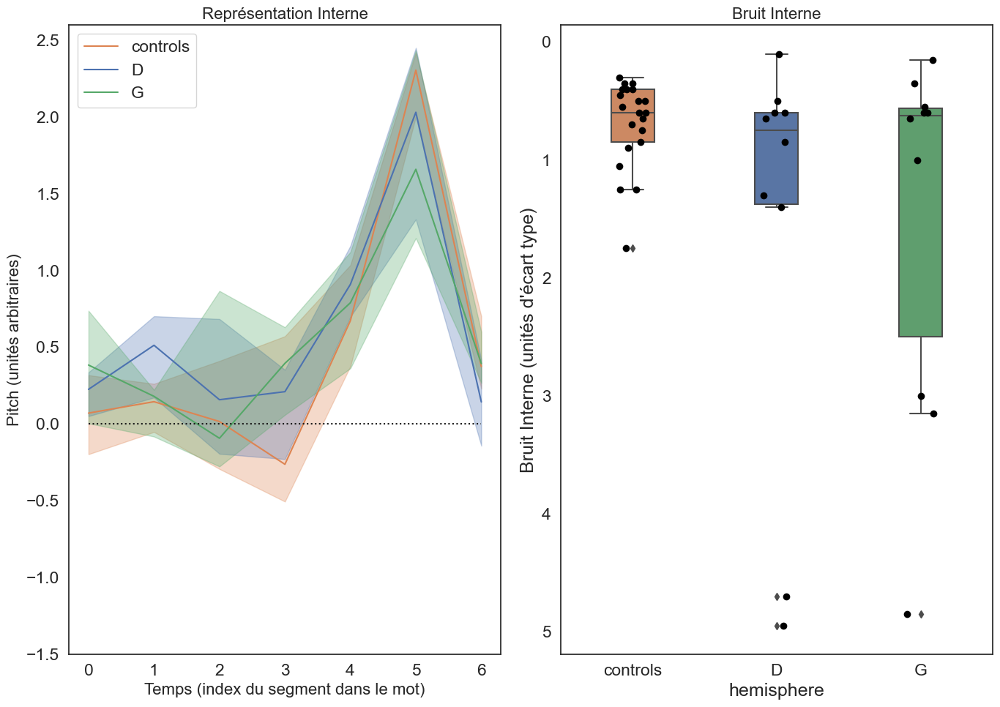

In [116]:
grouped_stats = kernels[kernels.type.isin(['pre','controls'])].groupby(['hemisphere', 'segment'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[0], "G": sns.color_palette()[2]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls", "D", "G"]:
    group_data = grouped_stats[grouped_stats['hemisphere'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], x="hemisphere", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "D", "G"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], x="hemisphere", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls", "D", "G"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

In [42]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         70.0  0.143978     21     10
1  controls      G         84.0  0.385279     21     10
2         D      G         54.5  0.761410     10     10
No significant differences for internal noise found between any pairs.


In [182]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D        135.0  0.212543     21     10
1  controls      G        130.0  0.300522     21     10
2         D      G         49.0  0.969850     10     10
No significant differences for internal representation found between any pairs.


In [43]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['hemisphere'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D        125.0  0.046570     21      8
1  controls      G        108.0  0.257353     21      8
2         D      G         33.0  0.959130      8      8
Found significant differences between some pairs for internal representation


In [183]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         14.0  0.013251     21      5
1  controls   Frontal        119.0  0.807444     21     12
2  Temporal   Frontal         46.5  0.091293      5     12
Found significant differences between some pairs for internal noise


In [44]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['lateralization'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal          3.0  0.001403     21      5
1  controls   Frontal         84.5  0.666650     21      9
2  Temporal   Frontal         42.5  0.009245      5      9
Found significant differences between some pairs for internal noise


In [184]:
df=revcor_measures[revcor_measures.type.isin(['pre','controls'])]
df=df[df.lateralization.isin(['Frontal','Temporal','controls'])]
groups = df['lateralization'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['lateralization'] == groups[i]]['kernel_typicality'].values
        group2_data = df[df['lateralization'] == groups[j]]['kernel_typicality'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal representation")
else:
    print("No significant differences for internal representation found between any pairs.")

     Group1    Group2  U-statistic   P-value  Size1  Size2
0  controls  Temporal         91.0  0.009851     21      5
1  controls   Frontal        151.0  0.359201     21     12
2  Temporal   Frontal         16.0  0.159987      5     12
Found significant differences between some pairs for internal representation


In [178]:
df=revcor_measures[revcor_measures.type.isin(['post','controls'])]
groups = df['hemisphere'].unique()  # Get unique experimentor names

# Perform Mann-Whitney U tests pairwise
results = []
for i in range(len(groups)):
    for j in range(i+1, len(groups)):
        group1_data = df[df['hemisphere'] == groups[i]]['internal_noise_with_criteria'].values
        group2_data = df[df['hemisphere'] == groups[j]]['internal_noise_with_criteria'].values
        stat, pvalue = mannwhitneyu(group1_data, group2_data)
        results.append({'Group1': groups[i], 'Group2': groups[j], 'U-statistic': stat, 'P-value': pvalue,'Size1': len(group1_data), 
            'Size2': len(group2_data)})

# Convert results to a DataFrame for easier reading
results_df = pd.DataFrame(results)
print(results_df)

# Check for any significant results
if results_df['P-value'].min() < 0.05:
    print("Found significant differences between some pairs for internal noise")
else:
    print("No significant differences for internal noise found between any pairs.")

     Group1 Group2  U-statistic   P-value  Size1  Size2
0  controls      D         48.0  0.082740     21      8
1  controls      G         54.5  0.156029     21      8
2         D      G         36.0  0.712989      8      8
No significant differences for internal noise found between any pairs.


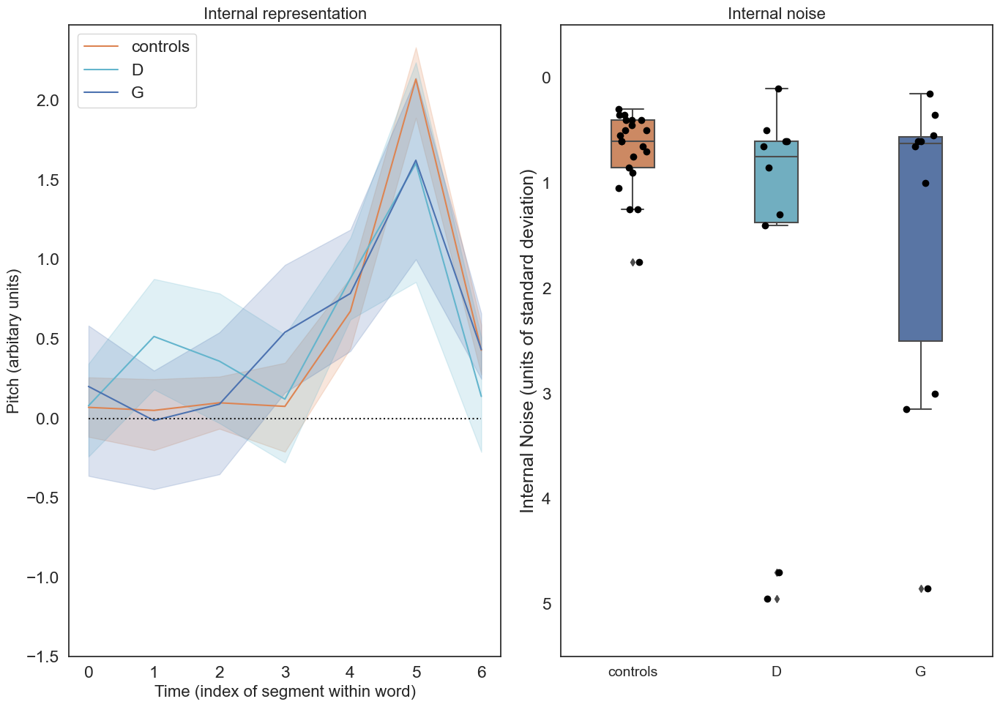

In [120]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[9], "G": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "D", "G"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="hemisphere",
             data=kernels[kernels.type.isin(['pre','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "D", "G"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
            x="hemisphere",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
              x="hemisphere",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


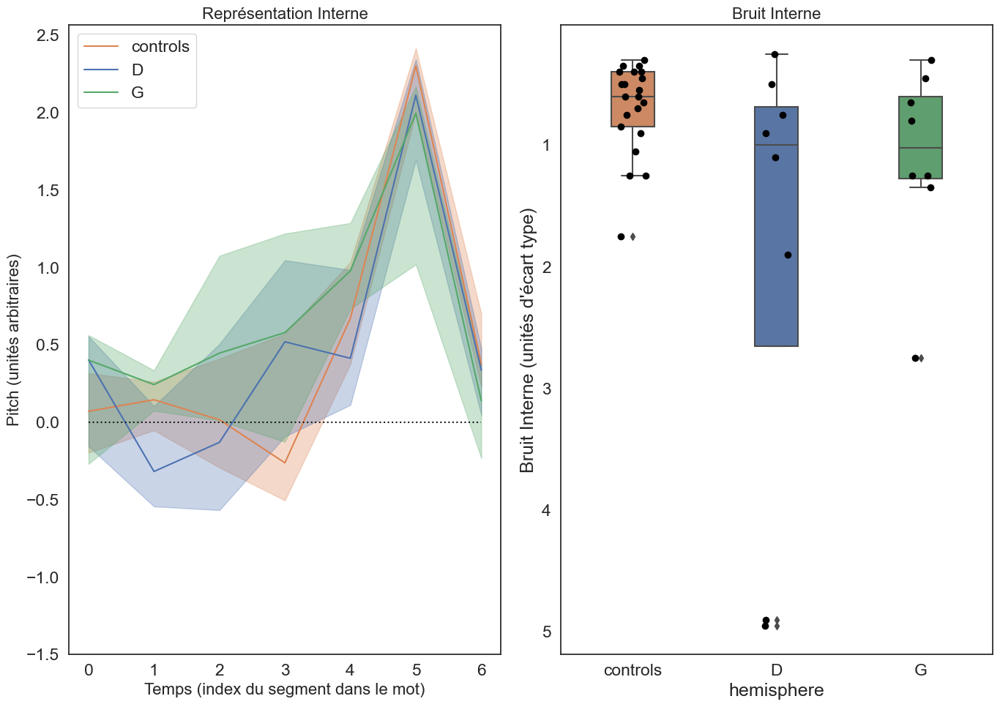

In [117]:
grouped_stats = kernels[kernels.type.isin(['post','controls'])].groupby(['hemisphere', 'segment'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[0], "G": sns.color_palette()[2]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls", "D", "G"]:
    group_data = grouped_stats[grouped_stats['hemisphere'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], x="hemisphere", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "D", "G"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], x="hemisphere", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls", "D", "G"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

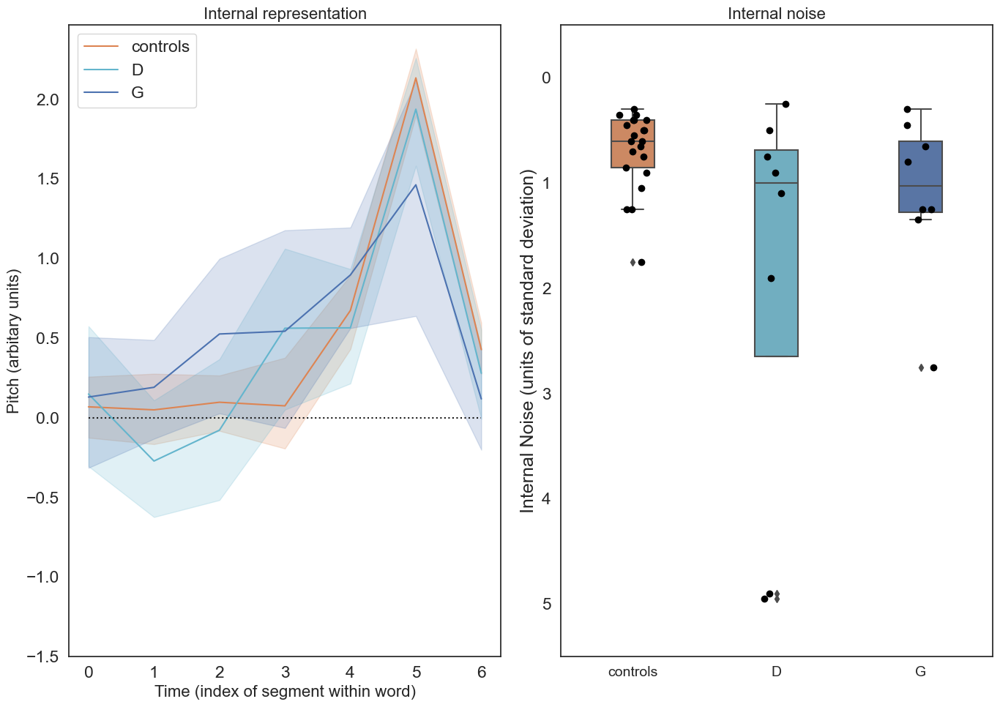

In [119]:
sns.set(font_scale=1.5) 
my_palette = {"controls": sns.color_palette()[1], "D": sns.color_palette()[9], "G": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["controls", "D", "G"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="hemisphere",
             data=kernels[kernels.type.isin(['post','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["controls", "D", "G"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
            x="hemisphere",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
              x="hemisphere",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


In [79]:
kernels['lateralization'] = kernels['localization'].apply(classify_localization)

for name, group in kernels.groupby('hemisphere'):
    print(name, group['lateralization'].unique())

Controls ['Controls']
D ['Insulaire' 'Temporal' 'Frontal' 'Pariétal']
G ['Frontal' 'Temporal' 'Pariétal']


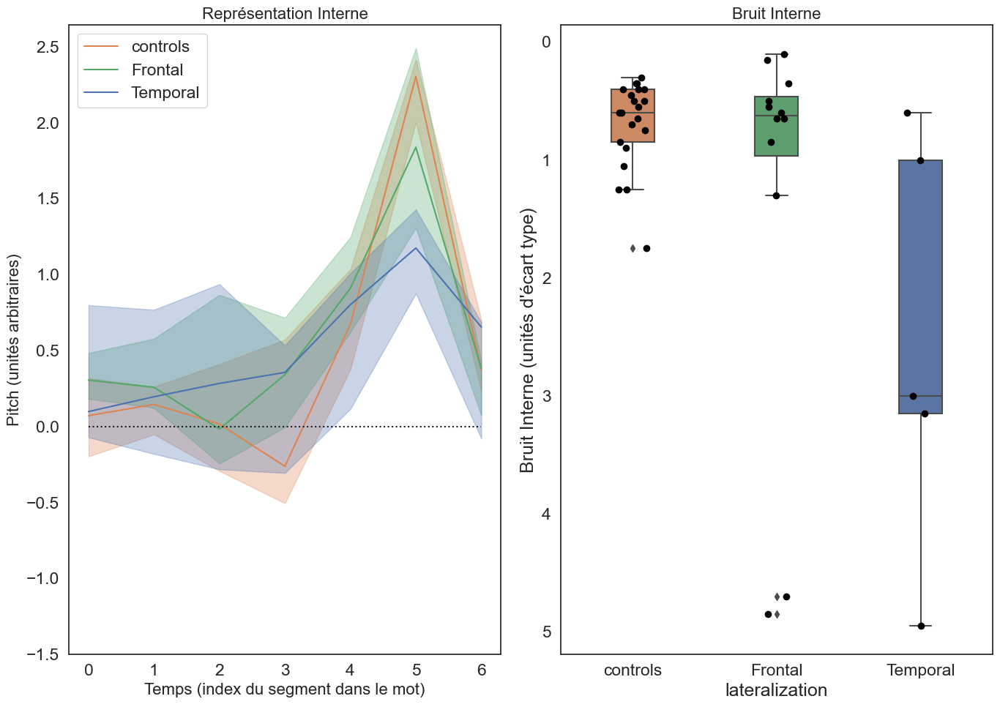

In [125]:
grouped_stats = kernels[kernels.type.isin(['pre','controls'])].groupby(['lateralization', 'segment'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[0], "Frontal": sns.color_palette()[2]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls", "Frontal", "Temporal"]:
    group_data = grouped_stats[grouped_stats['lateralization'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], x="lateralization", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "Frontal", "Temporal"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])], x="lateralization", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls" ,"Frontal", "Temporal"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

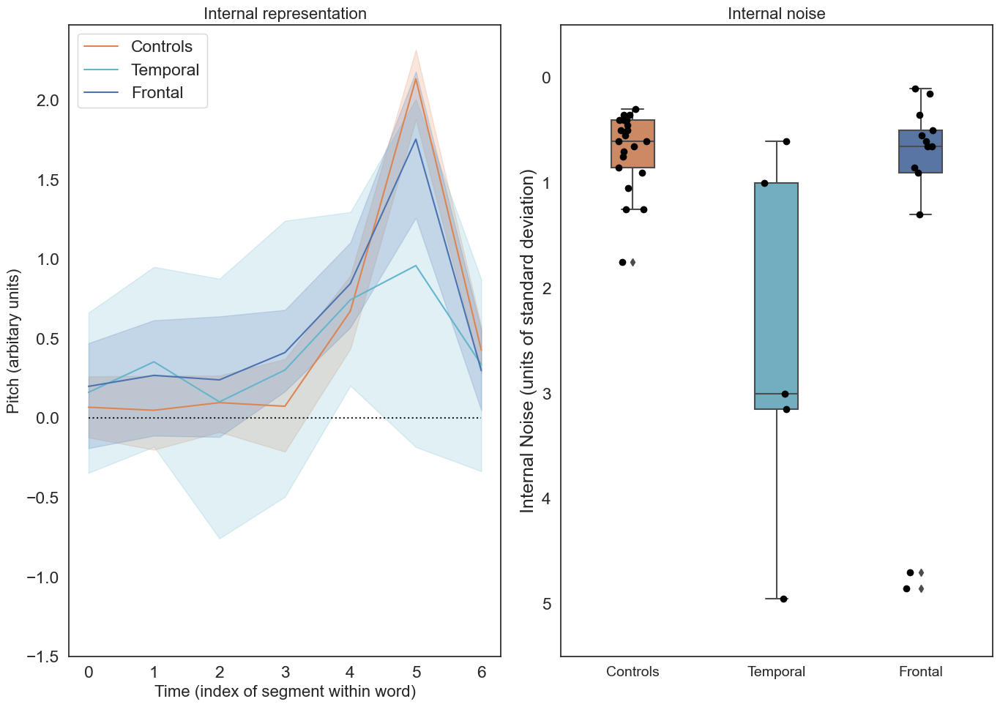

In [80]:
sns.set(font_scale=1.5) 
my_palette = {"Controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["Controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels[kernels.type.isin(['pre','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["Controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['pre','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


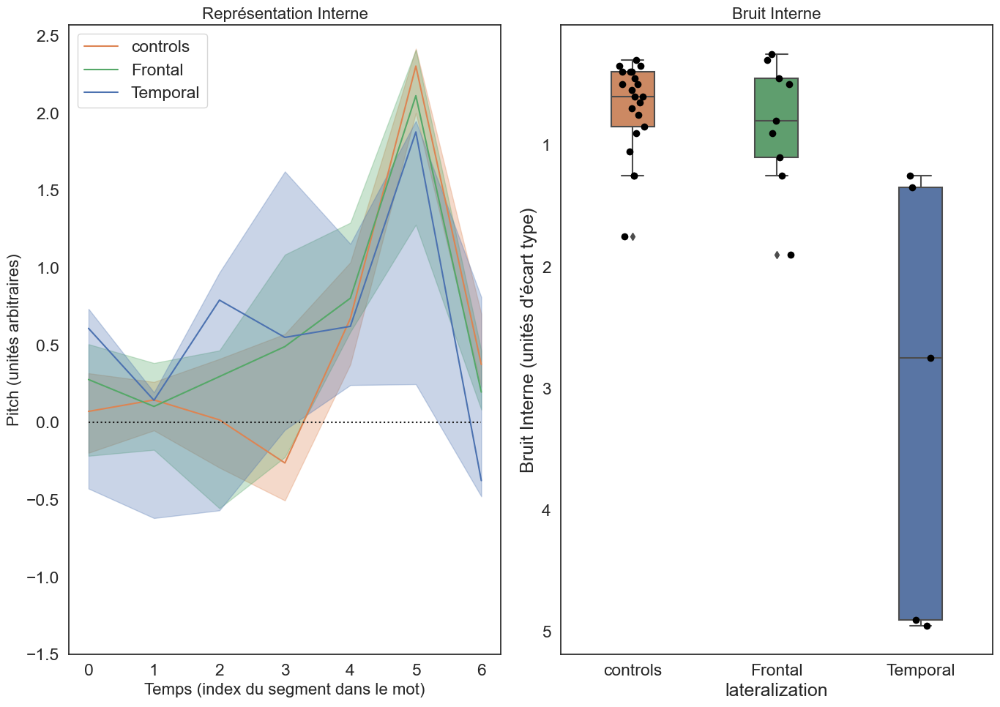

In [126]:
grouped_stats = kernels[kernels.type.isin(['post','controls'])].groupby(['lateralization', 'segment'])['kernel_value'].agg(
    median='median',
    quantile_25=lambda x: np.percentile(x, 25),
    quantile_75=lambda x: np.percentile(x, 75)
).reset_index()
sns.set(style="white", font_scale=1.5)
my_palette = {"controls": sns.color_palette()[1], "Temporal": sns.color_palette()[0], "Frontal": sns.color_palette()[2]}

# Create the figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))

# Plot each type
for group in ["controls", "Frontal", "Temporal"]:
    group_data = grouped_stats[grouped_stats['lateralization'] == group]
    ax1.plot(group_data['segment'], group_data['median'], label=group, color=my_palette[group])
    ax1.fill_between(group_data['segment'], group_data['quantile_25'], group_data['quantile_75'], color=my_palette[group], alpha=0.3)

# Customize the plot
ax1.set_xlabel("Temps (index du segment dans le mot)", fontsize=16)
ax1.set_ylabel("Pitch (unités arbitraires)", fontsize=16)
ax1.set_title("Représentation Interne", fontsize=16)
ax1.legend(title=None)
ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.set_ylim(-1.5, None)
ax1.grid(False)

# Plot for internal noise with boxplot and stripplot
sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], x="lateralization", y="internal_noise_with_criteria", ax=ax2, palette=my_palette, order=["controls", "Frontal", "Temporal"], width=0.3, whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])], x="lateralization", y="internal_noise_with_criteria", dodge=True, alpha=1, zorder=20, size=7, jitter=True, color="black", ax=ax2, order=["controls" ,"Frontal", "Temporal"])

ax2.set_ylabel("Bruit Interne (unités d'écart type)")
ax2.set_title("Bruit Interne", fontsize=16)
ax2.invert_yaxis()

# Final layout adjustments
fig.tight_layout()
plt.show()

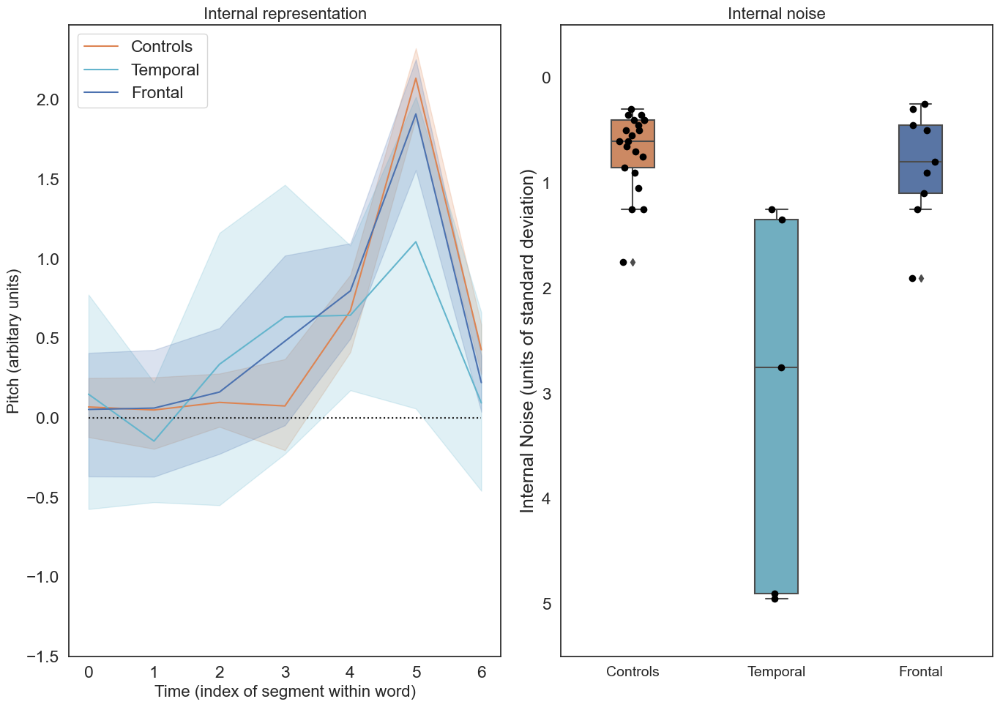

In [81]:
sns.set(font_scale=1.5) 
my_palette = {"Controls": sns.color_palette()[1], "Temporal": sns.color_palette()[9], "Frontal": sns.color_palette()[0]}


sns.set_style("white")  # Set the background color to white
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
ax1.grid(False)
ax2.grid(False)

orders = ["Controls", "Temporal", "Frontal"]
sns.lineplot(x="segment", 
             y="kernel_value",
             hue="lateralization",
             data=kernels[kernels.type.isin(['post','controls'])],
             ci=95,
             hue_order=orders,
             ax=ax1,
             palette=my_palette)
ax1.set_xlabel("Time (index of segment within word)",fontsize=16)
ax1.set_ylabel("Pitch (arbitary units)",fontsize=16)
ax1.set_title("Internal representation",fontsize=16)

ax1.plot([0,6],[0,0],color='k',linestyle=':')
ax1.legend(title=None)
ax1.set_ylim(-1.5, None)


box_order1 = ["Controls", "Temporal", "Frontal"]

sns.boxplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
            x="lateralization",
            y="internal_noise_with_criteria",
            ax=ax2,
            palette=my_palette,order=box_order1
            ,width=0.3,whis=1)
sns.stripplot(data=revcor_measures[revcor_measures.type.isin(['post','controls'])],
              x="lateralization",
              y="internal_noise_with_criteria",
              dodge=True,
              alpha=1,
              zorder=20,size=7,
              jitter=True,
              color="black",
              ax=ax2,order=box_order1)

ax2.set_ylabel("Internal Noise (units of standard deviation)")
ax2.tick_params(axis="x", labelsize=14)
ax2.set_title("Internal noise",fontsize=16)


ax2.set_ylim(-0.5,5.5)

ax2.invert_yaxis()
ax2.set_xlabel(None)

fig.tight_layout()
plt.show()


### Participant's table

In [133]:
from tableone import TableOne

In [137]:
unique_revcor_data = merge_data.drop_duplicates(subset=['subject', 'experimentor','sex', 'age'], keep='first')
revcor_measures_updated = pd.merge(revcor_measures, unique_revcor_data[['subject','experimentor','sex', 'age']], on=['subject','experimentor'], how='right')
revcor_measures_updated

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,...,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralization,lateralizaion,sex,age
0,celia_aude,post,10.0,2.0,0.135816,0.956828,0.411765,0.803922,0.35,0.50,...,Fronto-pariétal,2,28.0,12.0,0.0,0.746753,Frontal,Frontal,m,49.0
1,celia_aude,pre,10.0,1.0,0.083320,0.978817,0.392157,0.803922,0.45,0.50,...,Fronto-pariétal,2,28.0,12.0,0.0,0.759740,Frontal,Frontal,m,49.0
2,celia_aude,post,11.0,2.0,0.101104,0.971368,0.441176,0.745098,0.25,0.65,...,Pariétal,2,43.0,12.0,0.0,0.798701,Pariétal,Pariétal,f,33.0
3,celia_aude,pre,11.0,1.0,0.105812,0.969396,0.490196,0.764706,0.05,0.60,...,Pariétal,2,43.0,12.0,0.0,0.746753,Pariétal,Pariétal,f,33.0
4,celia_aude,pre,12.0,1.0,1.958146,0.193519,0.607843,0.450980,1.40,4.85,...,Frontal,controls,controls,10.0,1.0,0.480519,Frontal,Frontal,f,24.0
5,celia_aude,post,13.0,2.0,0.052219,0.991844,0.500000,0.862745,0.00,0.30,...,Frontal,3,5.0,12.0,0.0,0.863636,Frontal,Frontal,m,40.0
6,celia_aude,pre,13.0,1.0,0.050731,0.992467,0.460784,0.941176,0.15,0.15,...,Frontal,3,5.0,12.0,0.0,0.870130,Frontal,Frontal,m,40.0
7,celia_aude,post,14.0,2.0,0.165145,0.944543,0.431373,0.686275,0.30,0.90,...,Frontal,2,33.0,11.0,1.0,0.740260,Frontal,Frontal,m,46.0
8,celia_aude,pre,14.0,1.0,0.279305,0.896726,0.421569,0.705882,0.40,0.85,...,Frontal,2,33.0,11.0,1.0,0.694805,Frontal,Frontal,m,46.0
9,celia_aude,post,15.0,2.0,0.348143,0.867892,0.450980,0.450980,0.60,4.95,...,Temporo-insulaire,2,29.0,10.0,1.0,0.616883,Temporal,Temporal,f,37.0


In [141]:
revcor_measures_updated.head(60)
unique_subjects_df = revcor_measures_updated.drop_duplicates(subset=['subject', 'experimentor','session','type'], keep='first').reset_index(drop=True)
unique_subjects_df

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,hemisphere,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralizaion,sex,age
0,celia_aude,post,10.0,2.0,0.135816,0.956828,0.411765,0.803922,0.35,0.50,D,Fronto-pariétal,2,28.0,12.0,0.0,0.746753,Frontal,m,49.0
1,celia_aude,pre,10.0,1.0,0.083320,0.978817,0.392157,0.803922,0.45,0.50,D,Fronto-pariétal,2,28.0,12.0,0.0,0.759740,Frontal,m,49.0
2,celia_aude,post,11.0,2.0,0.101104,0.971368,0.441176,0.745098,0.25,0.65,G,Pariétal,2,43.0,12.0,0.0,0.798701,Pariétal,f,33.0
3,celia_aude,pre,11.0,1.0,0.105812,0.969396,0.490196,0.764706,0.05,0.60,G,Pariétal,2,43.0,12.0,0.0,0.746753,Pariétal,f,33.0
4,celia_aude,pre,12.0,1.0,1.958146,0.193519,0.607843,0.450980,1.40,4.85,G,Frontal,NaN,NaN,10.0,1.0,0.480519,Frontal,f,24.0
5,celia_aude,post,13.0,2.0,0.052219,0.991844,0.500000,0.862745,0.00,0.30,G,Frontal,3,5.0,12.0,0.0,0.863636,Frontal,m,40.0
6,celia_aude,pre,13.0,1.0,0.050731,0.992467,0.460784,0.941176,0.15,0.15,G,Frontal,3,5.0,12.0,0.0,0.870130,Frontal,m,40.0
7,celia_aude,post,14.0,2.0,0.165145,0.944543,0.431373,0.686275,0.30,0.90,D,Frontal,2,33.0,11.0,1.0,0.740260,Frontal,m,46.0
8,celia_aude,pre,14.0,1.0,0.279305,0.896726,0.421569,0.705882,0.40,0.85,D,Frontal,2,33.0,11.0,1.0,0.694805,Frontal,m,46.0
9,celia_aude,post,15.0,2.0,0.348143,0.867892,0.450980,0.450980,0.60,4.95,D,Temporo-insulaire,2,29.0,10.0,1.0,0.616883,Temporal,f,37.0


In [129]:
revcor_measures_updated.groupby(['type']).sex.unique()

type
controls    [m, f]
post        [m, f]
pre         [m, f]
Name: sex, dtype: object

In [130]:
for name, group in revcor_measures_updated.groupby('type'):
    print(name, group['sex'].unique())

controls ['m' 'f']
post ['m' 'f']
pre ['m' 'f']


In [135]:
revcor_measures['lateralizaion'] = revcor_measures['localization'].apply(classify_localization)

In [131]:
revcor_measures_updated.describe()

,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,accuracy,age
count,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000,57.000000
mean,10.789474,1.280702,0.432153,0.832703,0.454444,0.723172,0.464035,1.213158,0.686798,46.912281
std,6.289835,0.453336,0.523337,0.219207,0.100129,0.125709,0.461147,1.304064,0.102671,12.874783
min,0.000000,1.000000,0.032747,-0.000000,0.160000,0.450980,0.000000,0.100000,0.467532,24.000000
25%,5.000000,1.000000,0.112478,0.763809,0.400000,0.627451,0.150000,0.500000,0.616883,37.000000
50%,11.000000,1.000000,0.206831,0.927083,0.450980,0.745098,0.350000,0.650000,0.694805,47.000000
75%,16.000000,2.000000,0.596630,0.966604,0.519608,0.803922,0.550000,1.250000,0.760000,53.000000
max,21.000000,2.000000,2.420154,1.000000,0.760000,0.960000,2.050000,4.950000,0.870130,82.000000


In [142]:
# Columns to set to NaN if type is 'controls'
columns_to_modify = ['Grade','Délai-postop' ,'Résultats-bruts-i-MEL ', 'Patho-sain']


# Function to apply across the specified columns
def replace_controls(row):
    if 'controls' in row.values:
        return [np.nan] * len(row)
    else:
        return row

# Apply the function
revcor_measures_updated[columns_to_modify] = revcor_measures_updated[columns_to_modify].apply(replace_controls, axis=1)


In [143]:
revcor_measures_updated

,experimentor,type,subject,session,kernel_distance,kernel_typicality,p_int1,pc_agree,criteria,internal_noise_with_criteria,...,localization,Grade,Délai-postop,Résultats-bruts-i-MEL,Patho-sain,accuracy,lateralization,lateralizaion,sex,age
0,celia_aude,post,10.0,2.0,0.135816,0.956828,0.411765,0.803922,0.35,0.50,...,Fronto-pariétal,2.0,28.0,12.0,0.0,0.746753,Frontal,Frontal,m,49.0
1,celia_aude,pre,10.0,1.0,0.083320,0.978817,0.392157,0.803922,0.45,0.50,...,Fronto-pariétal,2.0,28.0,12.0,0.0,0.759740,Frontal,Frontal,m,49.0
2,celia_aude,post,11.0,2.0,0.101104,0.971368,0.441176,0.745098,0.25,0.65,...,Pariétal,2.0,43.0,12.0,0.0,0.798701,Pariétal,Pariétal,f,33.0
3,celia_aude,pre,11.0,1.0,0.105812,0.969396,0.490196,0.764706,0.05,0.60,...,Pariétal,2.0,43.0,12.0,0.0,0.746753,Pariétal,Pariétal,f,33.0
4,celia_aude,pre,12.0,1.0,1.958146,0.193519,0.607843,0.450980,1.40,4.85,...,Frontal,NaN,NaN,NaN,NaN,0.480519,Frontal,Frontal,f,24.0
5,celia_aude,post,13.0,2.0,0.052219,0.991844,0.500000,0.862745,0.00,0.30,...,Frontal,3.0,5.0,12.0,0.0,0.863636,Frontal,Frontal,m,40.0
6,celia_aude,pre,13.0,1.0,0.050731,0.992467,0.460784,0.941176,0.15,0.15,...,Frontal,3.0,5.0,12.0,0.0,0.870130,Frontal,Frontal,m,40.0
7,celia_aude,post,14.0,2.0,0.165145,0.944543,0.431373,0.686275,0.30,0.90,...,Frontal,2.0,33.0,11.0,1.0,0.740260,Frontal,Frontal,m,46.0
8,celia_aude,pre,14.0,1.0,0.279305,0.896726,0.421569,0.705882,0.40,0.85,...,Frontal,2.0,33.0,11.0,1.0,0.694805,Frontal,Frontal,m,46.0
9,celia_aude,post,15.0,2.0,0.348143,0.867892,0.450980,0.450980,0.60,4.95,...,Temporo-insulaire,2.0,29.0,10.0,1.0,0.616883,Temporal,Temporal,f,37.0


In [144]:
columns=['sex','age','hemisphere', 'lateralizaion', 'Grade',
       'Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain']
categorical = ['sex','hemisphere', 'lateralizaion','Grade']
groupby = ['type']
nonnormal = ['age','Délai-postop', 'Résultats-bruts-i-MEL ', 'Patho-sain']
mytable = TableOne(revcor_measures_updated, columns=columns, nonnormal=nonnormal,categorical=categorical, groupby=groupby, pval=False)
mytable

Grouped by type                                                                        
                                                         Missing           Overall          controls              post               pre
n                                                                               57                21                16                20
sex, n (%)                             f                       0         25 (43.9)          8 (38.1)          8 (50.0)          9 (45.0)
                                       m                                 32 (56.1)         13 (61.9)          8 (50.0)         11 (55.0)
age, median [Q1,Q3]                                            0  47.0 [37.0,53.0]  58.0 [52.0,64.0]  38.5 [34.8,47.5]  37.0 [34.8,46.2]
hemisphere, n (%)                      controls                0         21 (36.8)        21 (100.0)                                    
                                       D                                 18 (31.6)                            8 (50.0)         10 (50.0)
                                       G                                 18 (31.6)                            8 (50.0)         10 (50.0)
lateralizaion, n (%)                   controls                0         21 (36.8)        21 (100.0)                                    
                                       Frontal                           21 (36.8)                            9 (56.2)         12 (60.0)
                                       Insulaire                           2 (3.5)                             1 (6.2)           1 (5.0)
                                       Pariétal                            3 (5.3)                             1 (6.2)          2 (10.0)
                                       Temporal                          10 (17.5)                            5 (31.2)          5 (25.0)
Grade, n (%)                           2.0                    25         16 (50.0)                            8 (50.0)          8 (50.0)
                                       3.0                               14 (43.8)                            7 (43.8)          7 (43.8)
                                       4.0                                 2 (6.2)                             1 (6.2)           1 (6.2)
Délai-postop, median [Q1,Q3]                                  25  30.5 [17.0,44.0]     nan [nan,nan]  30.5 [17.0,44.0]  30.5 [17.0,44.0]
Résultats-bruts-i-MEL , median [Q1,Q3]                        25  12.0 [11.0,12.0]     nan [nan,nan]  12.0 [11.0,12.0]  12.0 [11.0,12.0]
Patho-sain, median [Q1,Q3]                                    25     0.0 [0.0,1.0]     nan [nan,nan]     0.0 [0.0,1.0]     0.0 [0.0,1.0]